In [1]:
import numpy as np
import matplotlib.pyplot as plt
import natsort, glob, h5py
from scipy.optimize import curve_fit
import scipy.signal
import pickle
import os

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
# changing the display so that the cells fill the whole window

In [3]:
def gauss_fun(x, A, mu, sig):
    return A * np.exp( -(x-mu)**2/(2*sig**2) )

def lin_fun(x, m, x1):
    return m*(x-x1)

In [4]:
def rebin_histogram(bins, counts, new_bin_size):
    """Rebin a histogram to a new bin size.
    Parameters:
        bins (np.ndarray): The bin edges of the histogram.
        counts (np.ndarray): The number of counts in each bin.
        new_bin_size (float): The size of the new bins.
    Returns:
        np.ndarray: The new bin edges.
        np.ndarray: The new bin counts.
    """
    # Find the new number of bins
    new_nbins = int((bins[-1] - bins[0]) / new_bin_size)
    # Create the new bin edges
    new_bins = np.linspace(bins[0], bins[-1], new_nbins + 1)
    # Digitize the original bins into the new bins
    digitized_bins = np.digitize(bins, new_bins)
    # Calculate the new counts
    new_counts = np.array([counts[digitized_bins == i].sum() for i in range(1, new_nbins + 1)])

    new_centers = new_bins[:-1] + np.diff(new_bins)/2
    return new_centers, new_counts

### if redoing, use this
# def rebin_center(hx,h,bins):
#     # rebinning the data with the new x values corresponding to the mean of the old?
#     h_rebin=[]
#     hx_rebin=[]
#     for i in range(int(len(h)/bins)):
#         start_idx=i*bins
#         end_idx=(i+1)*bins
#         h_rebin.append(np.sum(h[start_idx:end_idx]))
#         hx_rebin.append(np.mean(hx[start_idx:end_idx])) # finding the mean of the x values in the bin
#     # hx_rebin=range(len(h_rebin))
#     return np.array(hx_rebin), np.array(h_rebin)

In [5]:
def load_directory(path):
    # getting files from a certain directory and selecting the data type such as source and wavelength
    # sourting them into a dictionary labeled by the file type
    files = {}
    
    file_list = natsort.realsorted(glob.glob(path + "mca_*.h5"), reverse=True)[::-1] # sorting all of the files in the given directory
    print('Number of files found: ', len(file_list))
    for file in file_list:
#         file_parts = file.split("_")
#         try:
#             file_wavelength = float(file_parts[-2]) # get wavelength from filename
#         except ValueError:
#             file_wavelength = file_parts[-2] # leaving tag as a string for source data

        if 'source' not in files: # starting the dictionary of files according to type
            files['source'] = [file]
        else:
            files['source'].append(file)
    
    # printing the number of files in the directory
    print('Number of files: ', len(file_list))
    
    return files

In [6]:
def peak_fit_srs10(x_data, y_data, voltage, min_distance=20, max_peaks=5, min_thresh=10, peak_range=500):
    # Find the peaks in the spectrum using the find_peaks function from scipy.signal
    
    peaks_index, _ = scipy.signal.find_peaks(y_data, distance=min_distance)
    
    # Fit each peak with a Gaussian function using the curve_fit function from scipy
    gain_info = [] # parameters to fit the gain
    peak_params = [] # parameters to plot the gaussian
    peak_number = 1 # corresponds to single photoelectron peak
    peaks = [] # list of where all the peaks are that are used in the fits
    peak_cuts = []
    for peak in peaks_index:
        if peak_number > max_peaks: # stopping the loop after we have reached the max number of peaks
            break

        if peak < min_thresh:
            continue
        
        peaks.append(np.array([x_data[peak], y_data[peak]]))
        
        # initial guess for the Gaussian parameters
        amplitude_guess = y_data[peak]
        mean_guess = x_data[peak]
        standard_deviation_guess = 10
        initial_guess = [amplitude_guess, mean_guess, standard_deviation_guess]
        
        # cutting data around each peak
        if peak_number == 1: # trying to not include the pedestal for the first peak
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - 40))
        else:
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - peak_range))
        peak_x = x_data[cut] # x values of peak for fitting
        peak_y = y_data[cut] # y values of peak for fitting
        peak_cuts.append([peak_x, peak_y])
        
        
        # Perform the curve fitting
        try:
            # trying to fit the peaks
            params, params_covariance = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
            # params are returned as amplitude, mean, std dev
            peak_params.append(params)
            gain_info.append([peak_number, params[1], np.sqrt(params_covariance[1,1])]) # peak number, mean, and covariance
        except RuntimeError as r:
            # if curve fit doesn't work then we will just use the peak amplitude and center that find_peaks found
            print('fit failed')
            params = initial_guess
            peak_params.append(initial_guess)
            gain_info.append([peak_number, mean_guess, np.nan])
#             xx = np.linspace( x_data[peak] - 2*standard_deviation_guess, x_data[peak] + 2*standard_deviation_guess, 100 )
        
        peak_number += 1 # (goes to n*spe until it reaches max_peak)
        
    plt.show()
    return np.array(peak_params), np.array(gain_info), np.array(peaks), peak_cuts

In [7]:
def gain_fit(pe_locations):
    # fitting a line of the peak centers and heights to get the slope (gain) 
    fpts = ~np.isnan(pe_locations[:,1])
    if(np.sum(fpts) < 3):
        return
    # fitting the peak locations to a line to find the gain (slope)
    gain_bp, gain_bc = curve_fit(lin_fun, pe_locations[fpts, 0], pe_locations[fpts, 1])

    x = pe_locations[fpts, 0]
    
    return x, gain_bp, gain_bc

def find_bv(g_vs_v, wavelength):
    # finding the breakdown voltage using fitted gain data of a certain wavelength (310, 405, or source)
    data_to_use = np.asarray(g_vs_v[wavelength])
    
    # fitting the curve 
    bv_params, bv_cov = curve_fit(lin_fun, data_to_use[:, 0], data_to_use[:, 1], sigma=data_to_use[:, 2])
    
    return bv_params, bv_cov

In [8]:
def plot_fit_gain_dc(file, peak_dist, SRS_gain, binsize):
    # doing the gain calculations and plotting the results (hopefully store this in a separate script at some point)
    gain_vs_volts = {}
    print("Working on file %s"%(file))
    
    file_parts = file.split("_")
    #         file_parts = file.split("_")
#         try:
#             file_wavelength = float(file_parts[-2]) # get wavelength from filename
#         except ValueError:
#             file_wavelength = file_parts[-2] # leaving tag as a string for source data
    file_volts = float(file_parts[-2][:5]) # get voltage from filename
    file_wavelength = 'source'
    
    if SRS_gain == 20:
        if file_volts < 31.5 and file_volts >=30.5:
            peak_range = 60 # picking a smaller range of values to fit over for the lower OV files
        elif file_volts < 30.5:
            print('low voltage range')
            peak_range = 50
        else:
            peak_range = 100
    elif SRS_gain == 10:
    # setting the peak range for low gain data
        if file_volts < 31.5 and file_volts >=30.5:
            peak_range = 30 # picking a smaller range of values to fit over for the lower OV files
        elif file_volts < 30.5:
            print('low voltage range')
            peak_range = 25
        else:
            peak_range = 50
#         else:
#             if file_volts < 31.5 and file_volts >=30.5:
#                 peak_range = 40 # picking a smaller range of values to fit over for the lower OV files
#             elif file_volts < 30.5:
#                 print('low voltage range')
#                 peak_range = 25
#             else:
#                 peak_range = 55
#     elif (SRS_gain == 5):
#         # setting the peak range for low gain data
#         if file_volts < 31.5 and file_volts >=30.5:
#             peak_range = 25 # picking a smaller range of values to fit over for the lower OV files
#         elif file_volts < 30.5:
#             print('low voltage range')
#             peak_range = 20 # these might need changing
#         else:
#             peak_range = 45 # these might need changing
    
    # extracting the data from the files
    f = h5py.File(file, 'r')  
    ch2 = f.get('ch2')
    for key in ch2.keys():
        mca_hist = np.array(ch2.get(key))
    bin_num = np.arange(len(mca_hist))
    b, c = rebin_histogram(bin_num, mca_hist, binsize)
    
    if SRS_gain == 20:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist, min_thresh=30, peak_range=peak_range)
    
    elif SRS_gain == 10:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist/2, min_thresh=30, peak_range=peak_range)
#         # getting the peak and fit info
# #         if file_wavelength == 'source':
#         if file_wavelength == 405.0:
#             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist/2, min_thresh=7, peak_range=peak_range, max_peaks=3)
#         else:
#             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist/2, min_thresh=7, peak_range=peak_range)
# #         elif file_wavelength == 310.0:
# #             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist/2, min_thresh=7, peak_range=peak_range, max_peaks=3)
#     elif SRS_gain == 5:
#         # getting the peak and fit info
#         if file_wavelength == 'source':
#             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs5(b, c, file_volts, min_distance=peak_dist*25/200, min_thresh=10, peak_range=peak_range)
#         elif file_wavelength == 405.0:
#             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs5(b, c, file_volts, min_distance=peak_dist*25/200, min_thresh=10, peak_range=peak_range, max_peaks=4)
#         elif file_wavelength == 310.0:
#             peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs5(b, c, file_volts, min_distance=peak_dist*25/200, min_thresh=10, peak_range=peak_range, max_peaks=3)
    
    
    # starting the plots
    plt.figure(figsize=(18,6))
    
    # calculating and plotting the gain 
    plt.subplot(1,2,2)
    plt.errorbar( pe_locs[:,0], pe_locs[:,1], yerr=pe_locs[:,2], fmt='ko' )

    xx, gain_params, gain_cov = gain_fit(pe_locs)
    gain_error = np.sqrt(np.diag(gain_cov))[0]
    plt.plot( xx, lin_fun(xx, *gain_params), 'r', label=r'Gain: %.2f $\pm$ %.2f'%(gain_params[0], gain_error))  #(str(np.round(popt_temp[0],2)))+'$\pm$'+str(np.round(np.sqrt(np.diag(pcov_temp))[0],2))+' ADC/PE'
    plt.legend()
    

    
    # plotting the peaks
    plt.subplot(1,2,1)
    plt.grid()
    plt.ylim(0.1, 10000)
    plt.yscale('log')
#     plt.ylim(0.1, np.max(mca_hist)*2)
    plt.xlim(0.1, 2000)
#     plt.xticks(np.arange(0, 9, 1))
    
    plt.plot(b, c, 'k')
    plt.plot(peaks[:,0], peaks[:,1], 'o', color='r')
    for fit_params, data_peaks in zip(peak_info, data_for_fits):
        plt.plot(b, gauss_fun(b, *fit_params))
        plt.plot(data_peaks[0], data_peaks[1])
    plt.show()
    
    return b, c, gain_params[0], gain_error, gain_params[1], file_volts

In [9]:
def get_data(empty_dict, path, files, peak_dist=20, srs_gain=10, binsize=5, take_mean=False):
    # getting the data we need into dictionaries
    for file_type, file_list in files.items():
        # creating the data fields in the dict
        empty_dict[file_type]['pe_data'] = []
        empty_dict[file_type]['counts'] = []
        empty_dict[file_type]['gain'] = np.empty(len(file_list))
        empty_dict[file_type]['gain_err'] = np.empty(len(file_list))
        empty_dict[file_type]['dc_offset'] = np.empty(len(file_list))
        empty_dict[file_type]['file_volts'] = np.empty(len(file_list))
        empty_dict[file_type]['time'] = np.empty(len(file_list))
        for i, file in enumerate(file_list):
            pe, counts, gain, gain_err, dc_offset, volts = plot_fit_gain_dc(file, peak_dist, srs_gain, binsize)
            empty_dict[file_type]['pe_data'].append(pe)
            empty_dict[file_type]['counts'].append(counts)
            empty_dict[file_type]['gain'][i] = gain
            empty_dict[file_type]['gain_err'][i] = gain_err
            empty_dict[file_type]['dc_offset'][i] = dc_offset
            empty_dict[file_type]['file_volts'][i] = volts
            file_path = os.path.join(path, file)
            mod_time = os.path.getmtime(file_path)
            empty_dict[file_type]['time'][i] = mod_time
            
        # converting all the lists to arrays 
        empty_dict[file_type]['pe_data'] = np.array(empty_dict[file_type]['pe_data'])
        empty_dict[file_type]['counts'] = np.array(empty_dict[file_type]['counts'])

def plot_offset(data_dict, field_type):
    plt.figure(figsize = (9, 6))
    # plotting the dc offset over time

    plt.figure(figsize=(6,4))
    for file_type in data_dict:
        data_dict[file_type]['dc_offset'][data_dict[file_type]['dc_offset'] < -5] = np.nan # setting any outliers to nan
        data_dict[file_type]['dc_offset'][data_dict[file_type]['dc_offset'] > 0.1] = np.nan
        masked_data = np.ma.masked_array(data_dict[file_type]['dc_offset'], np.isnan(data_dict[file_type]['dc_offset'])) # creating a masked array to ignore the nan when tkaing the average dc offset
        dc_offset_mean = np.ma.average(masked_data)
        data_dict[file_type]['mean_dc_offset'] = dc_offset_mean
        plt.scatter((data_dict[file_type]['time']-data_dict['source']['time'][0])/60, data_dict[file_type]['dc_offset'], marker='o', label= str(file_type), color=data_dict[file_type]['color'])
        plt.axhline(y=dc_offset_mean, color='r')
        print(dc_offset_mean)

    plt.ylabel('DC Offset')
    plt.xlabel('Time [m]')
    plt.title('{} Field'.format(field_type))
    # plt.ylim(-1.4, -1)
    # plt.grid()
    plt.legend(loc='best')
    # plt.savefig('NO_FIELD_gain_comparison.pdf')
    plt.show()

# 0 E Field

In [10]:
# getting the data that we need
path_9 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/'
files_9 = load_directory(path_9)
SRS_gain_9 = 20 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_9 = 100 # center of noise pedestal peak

Number of files found:  6
Number of files:  6


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_0.h5


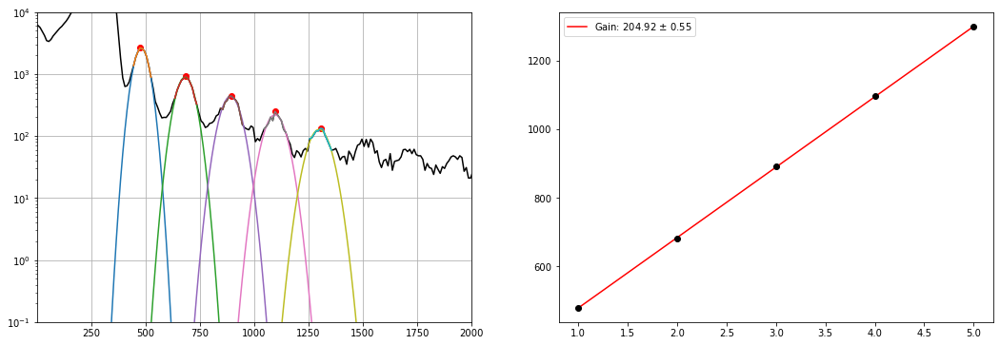

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_1.h5


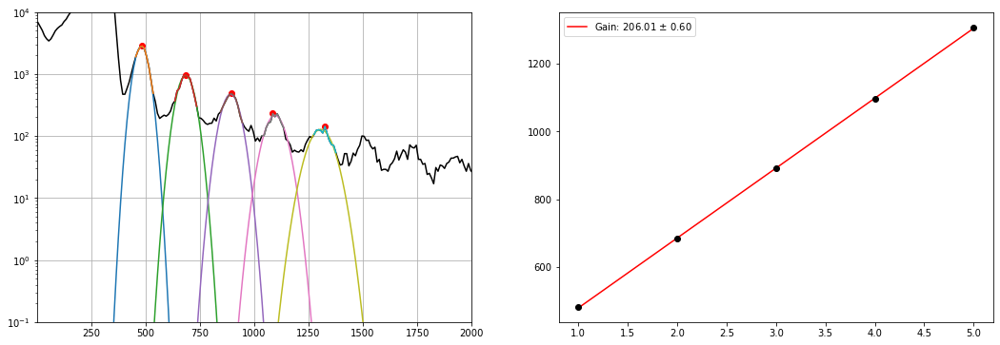

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_2.h5


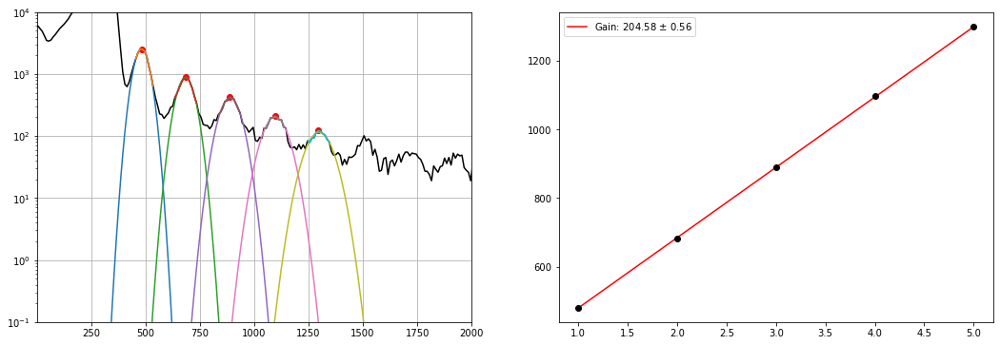

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_3.h5


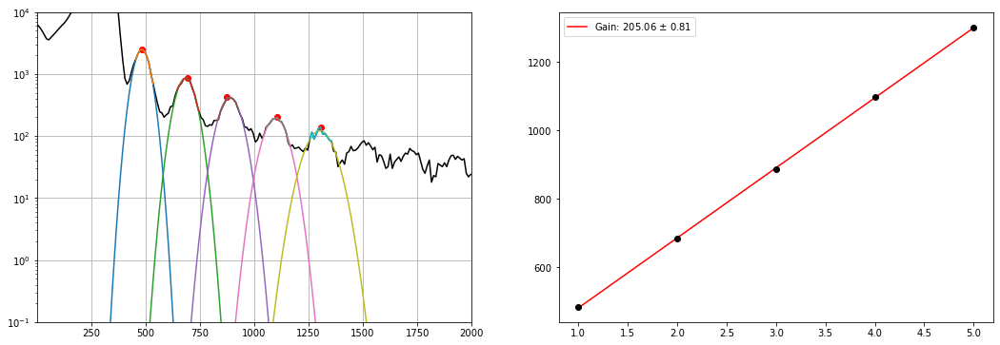

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_4.h5


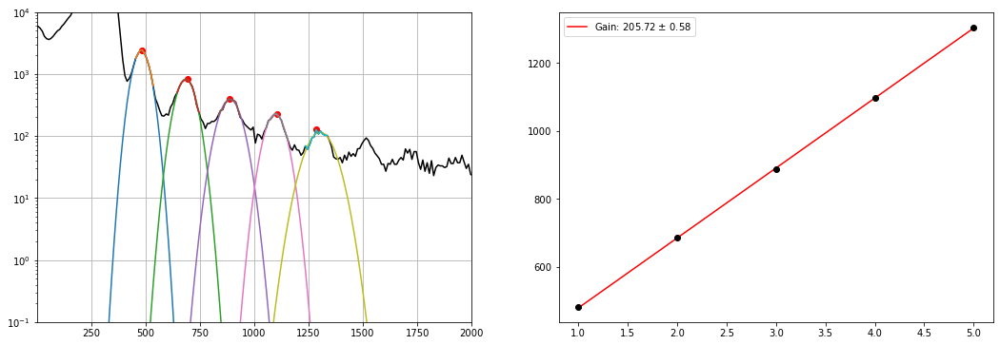

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9/mca_keith_31.40OV_5.h5


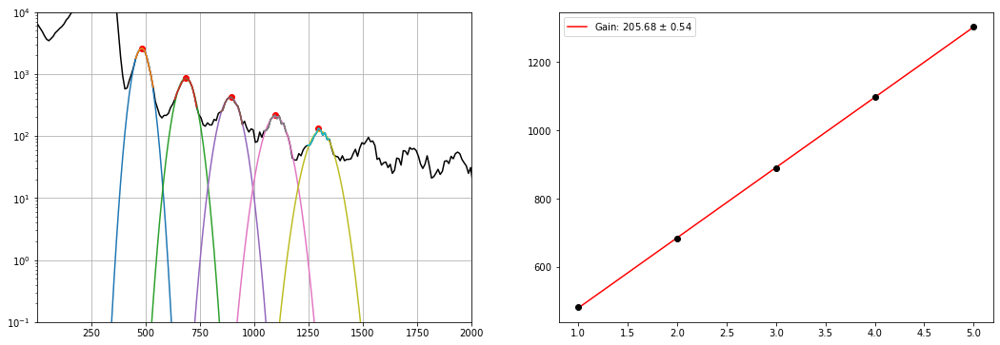

In [11]:
data_NO_FIELD1 = {'source':{'color': 'black'}}

get_data(data_NO_FIELD1, path_9, files_9, srs_gain = SRS_gain_9, binsize=10, peak_dist=17)

-1.337175379092228


<Figure size 648x432 with 0 Axes>

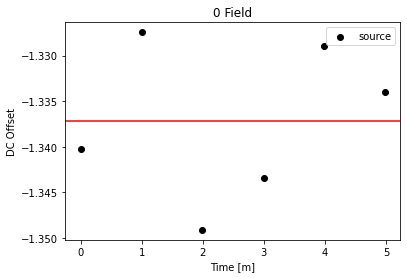

In [12]:
plot_offset(data_NO_FIELD1, '0')

In [13]:
# getting the data that we need
path_9_2 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/'
files_9_2 = load_directory(path_9_2)
SRS_gain_9_2 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_9_2 = 100 # center of noise pedestal peak

Number of files found:  10
Number of files:  10


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_0.h5


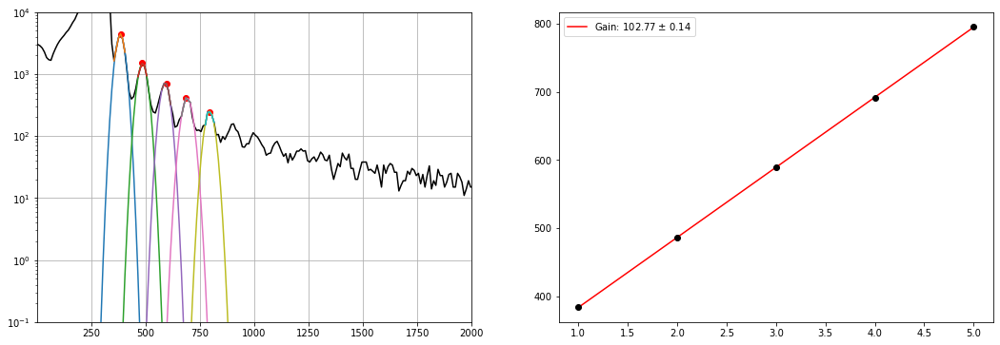

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_1.h5


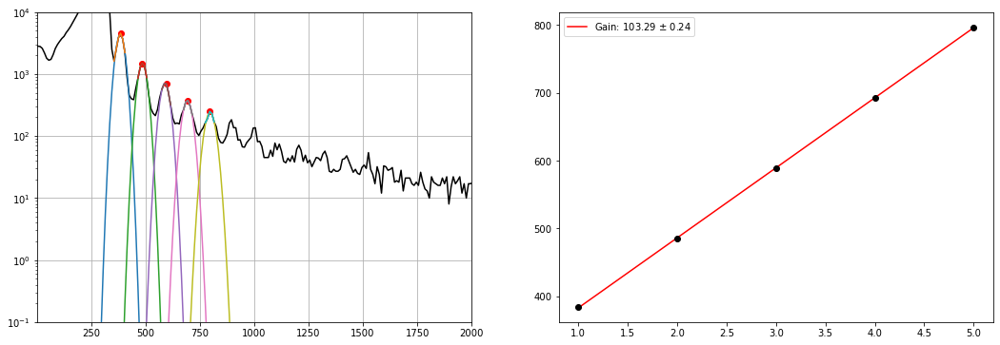

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_2.h5


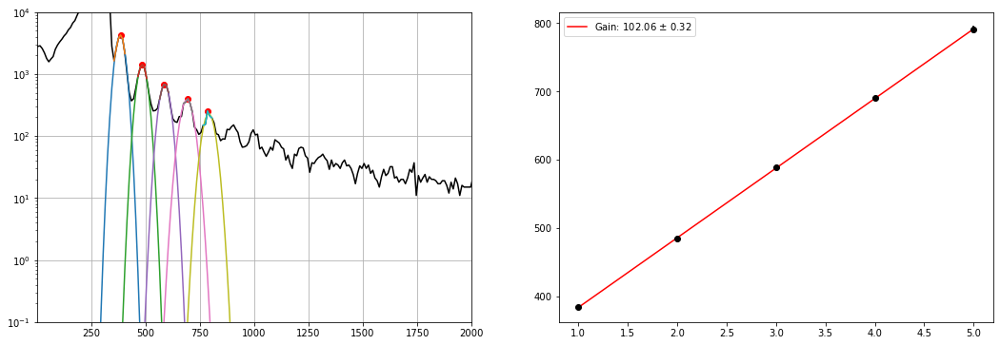

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_3.h5


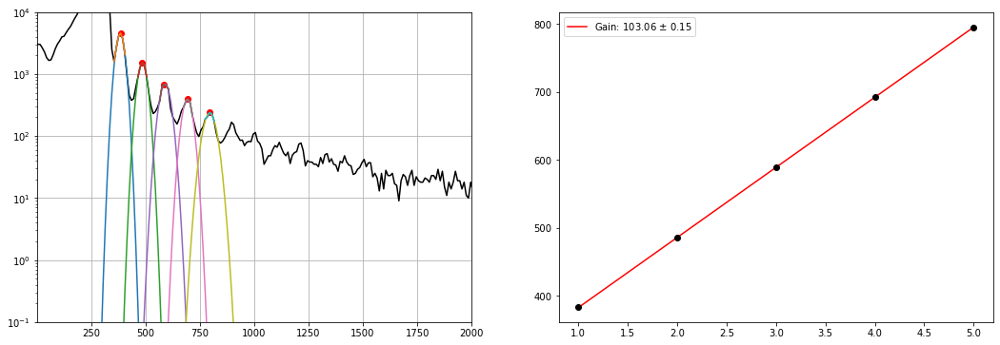

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_4.h5


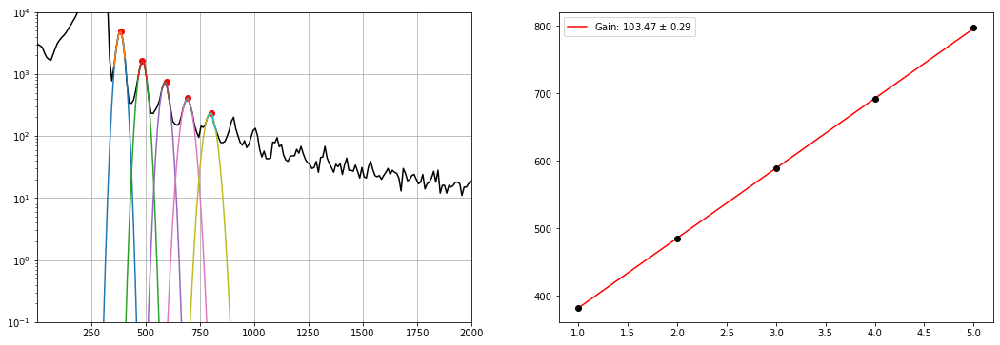

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_5.h5


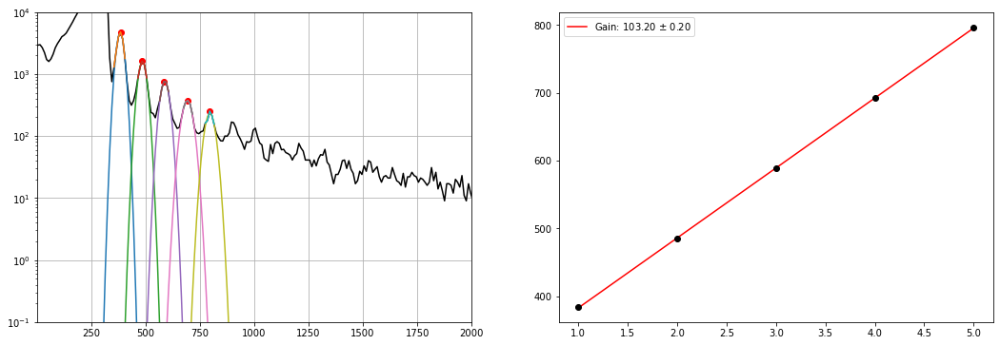

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_6.h5


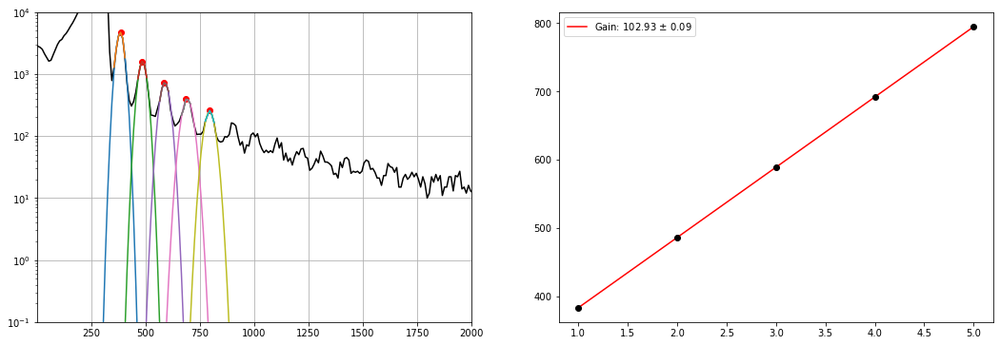

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_7.h5


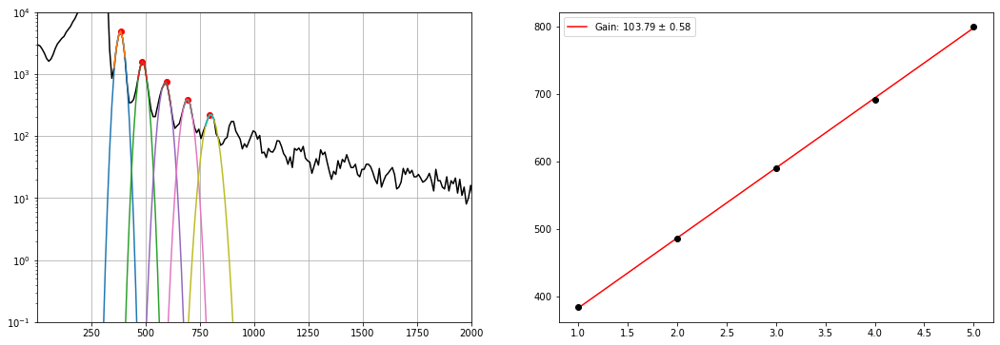

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_8.h5


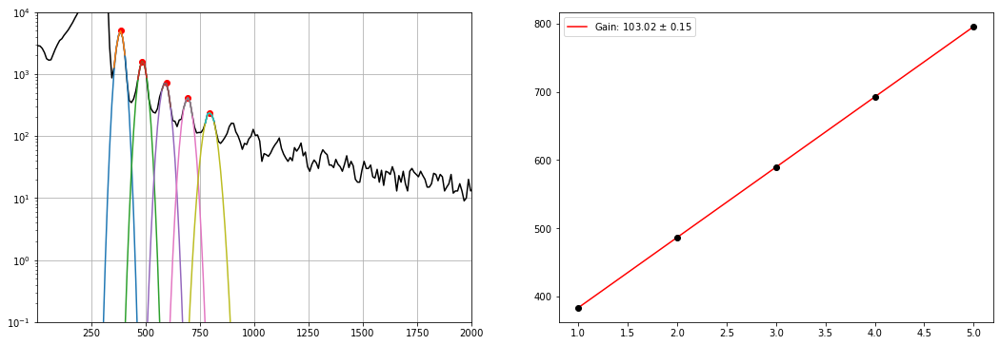

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step9_take2/mca_keith_31.40OV_9.h5


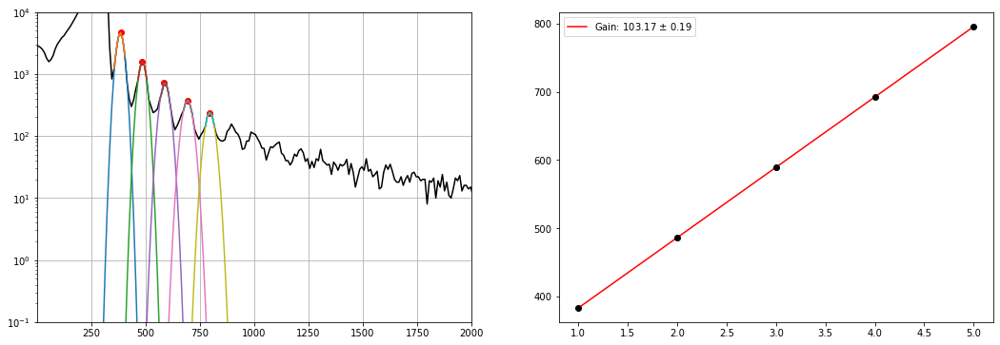

In [14]:
data_NO_FIELD1_2 = {'source':{'color': 'black'}}

get_data(data_NO_FIELD1_2, path_9_2, files_9_2, binsize=10, peak_dist=15)

-2.7163560562634306


<Figure size 648x432 with 0 Axes>

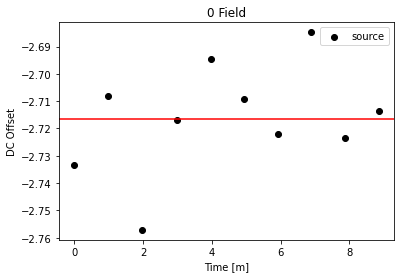

In [15]:
plot_offset(data_NO_FIELD1_2, '0')

# Positive E Field

In [16]:
# getting the data that we need
path_11 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/'
files_11 = load_directory(path_11)
SRS_gain_11 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_11 = 100 # center of noise pedestal peak

Number of files found:  157
Number of files:  157


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_0.h5


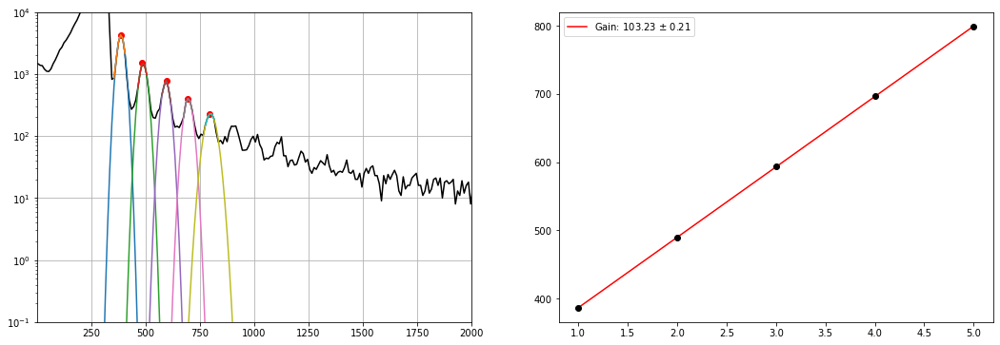

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_1.h5


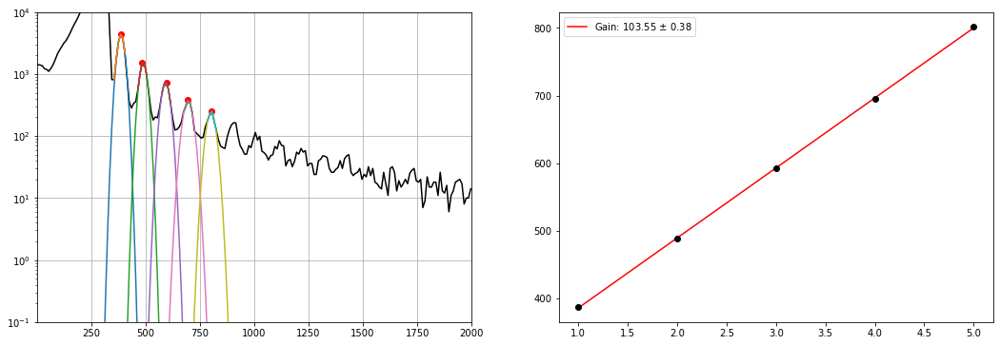

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_2.h5


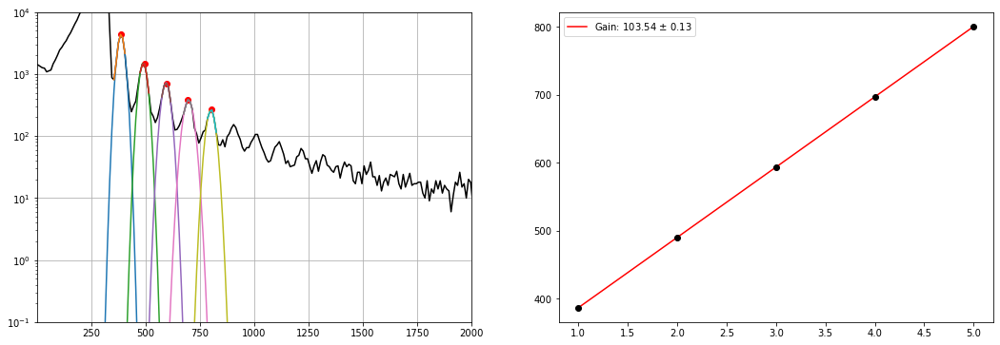

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_3.h5


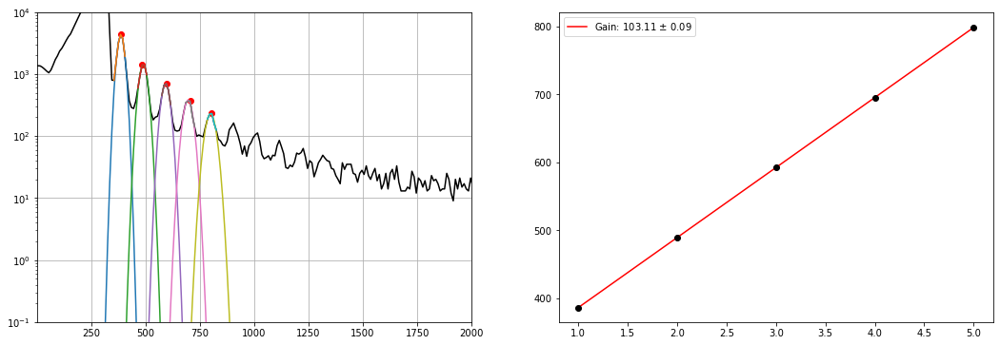

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_4.h5


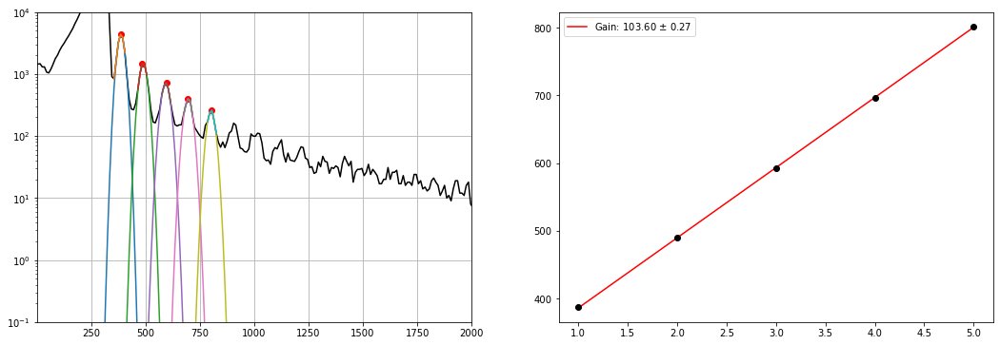

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_5.h5


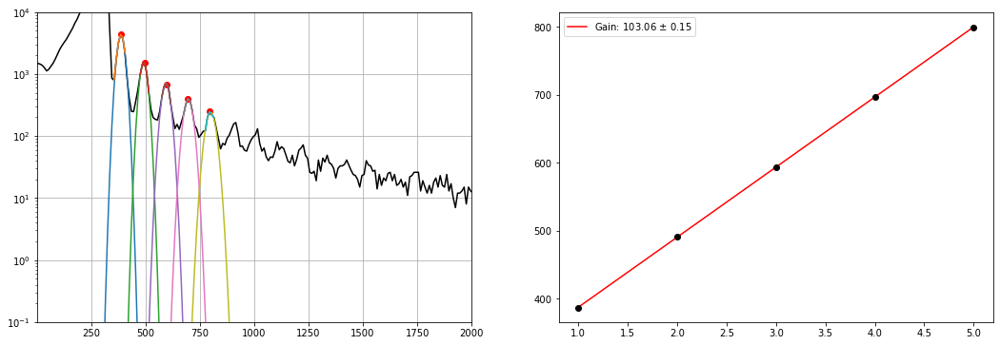

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_6.h5


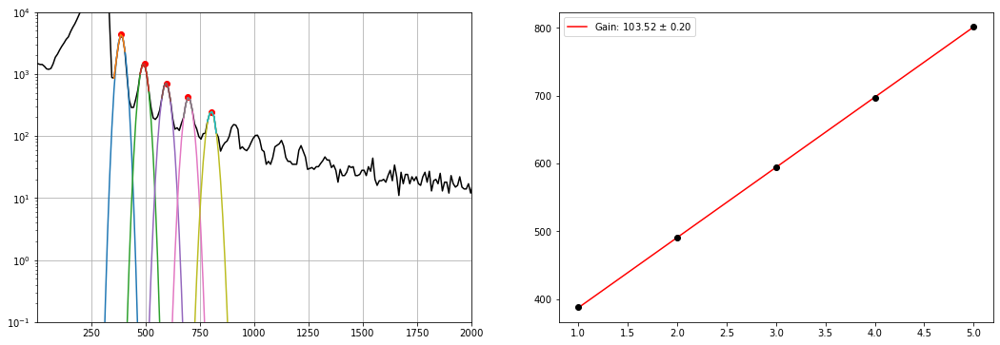

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_7.h5


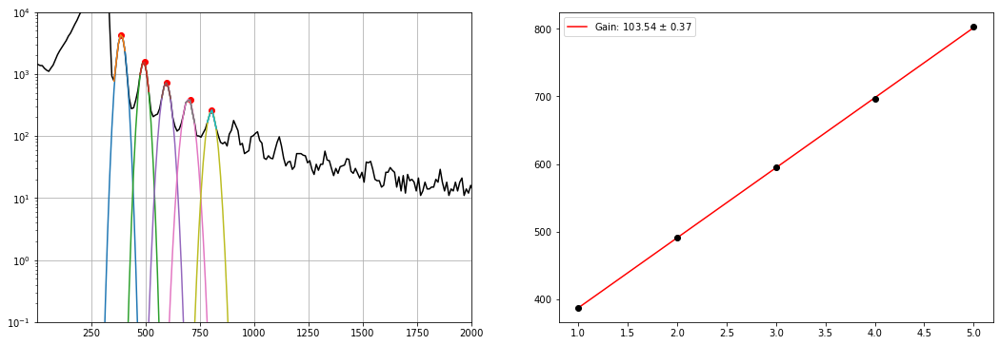

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_8.h5


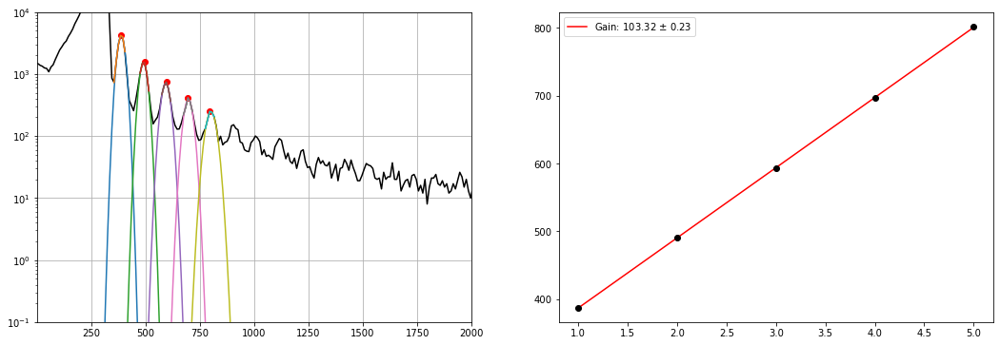

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_9.h5


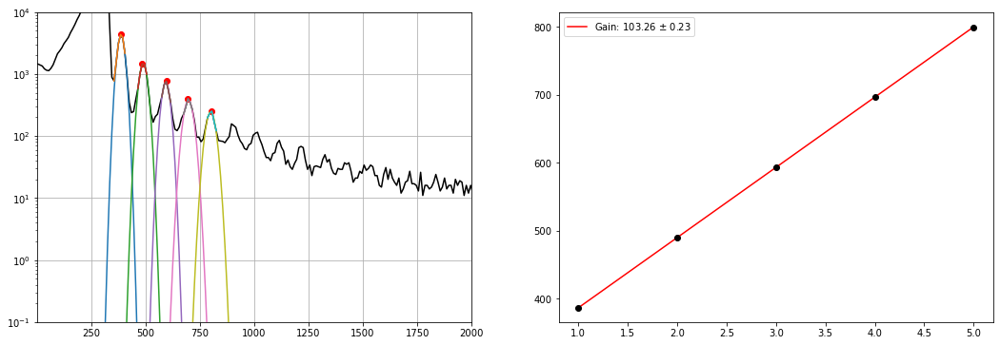

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_10.h5


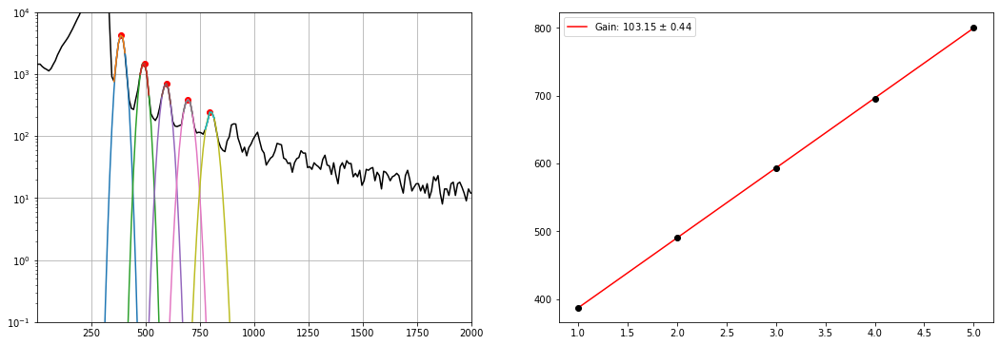

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_11.h5


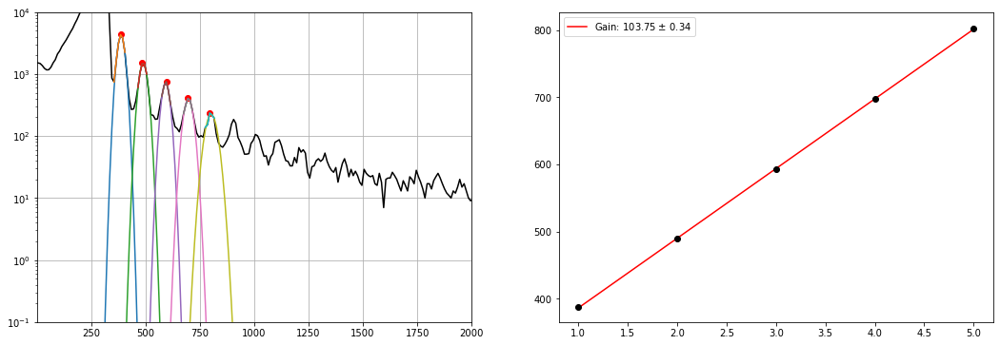

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_12.h5


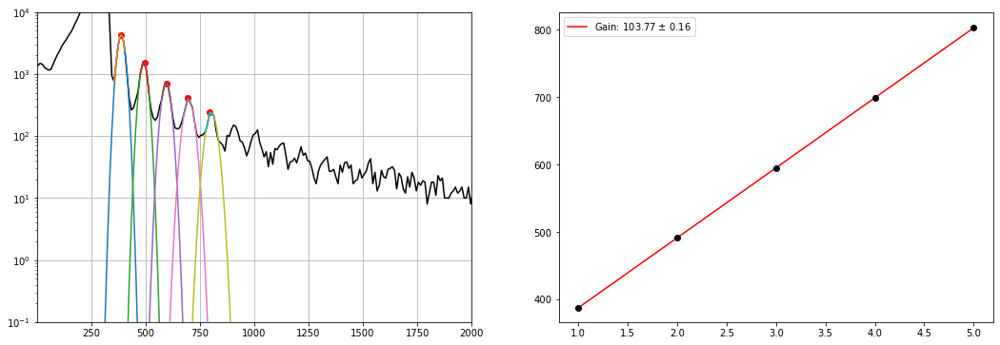

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_13.h5


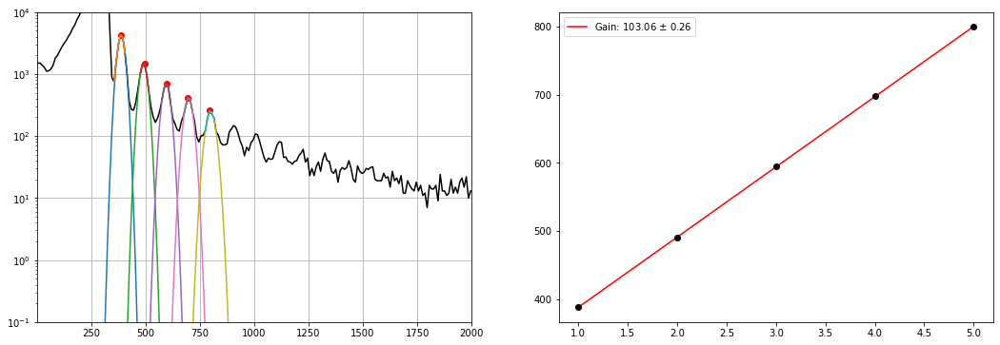

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_14.h5


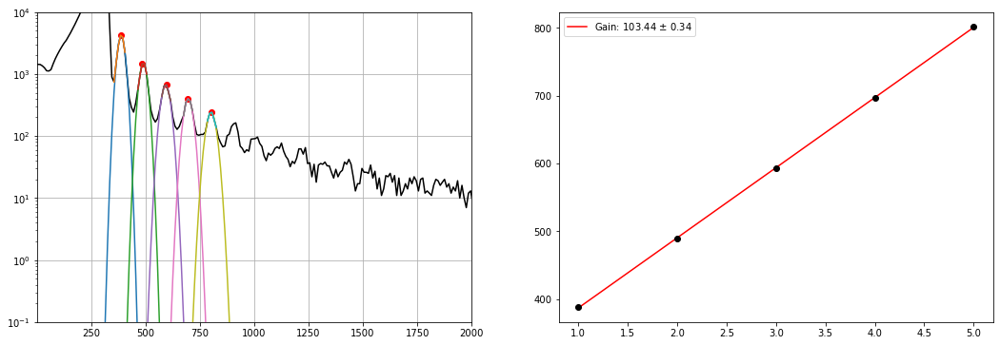

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_15.h5


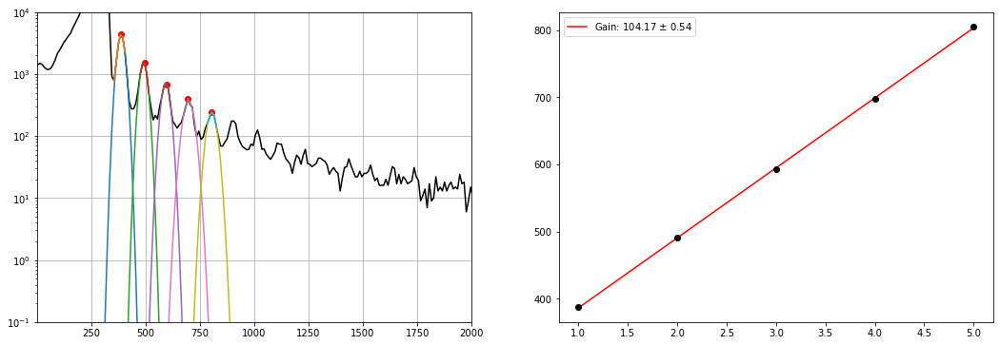

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_16.h5


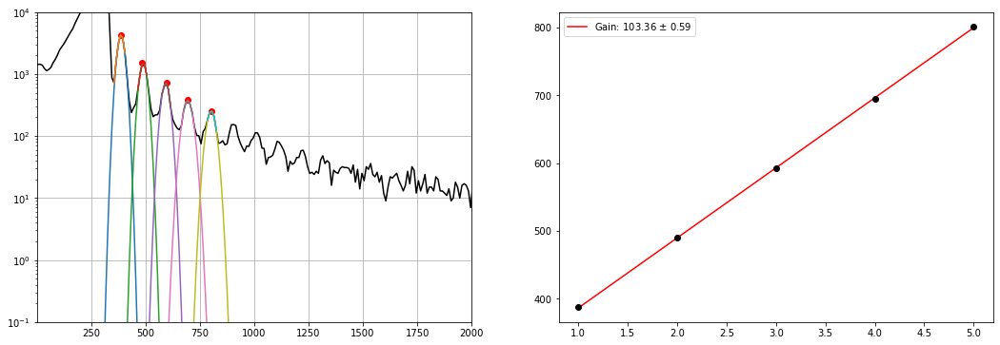

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_17.h5


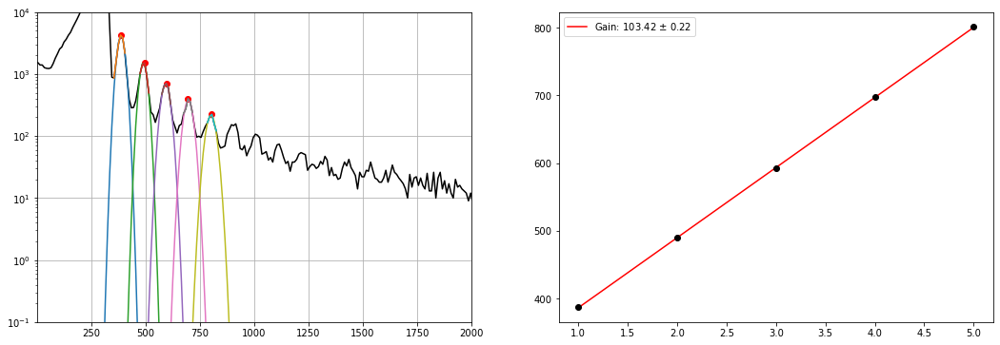

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_18.h5


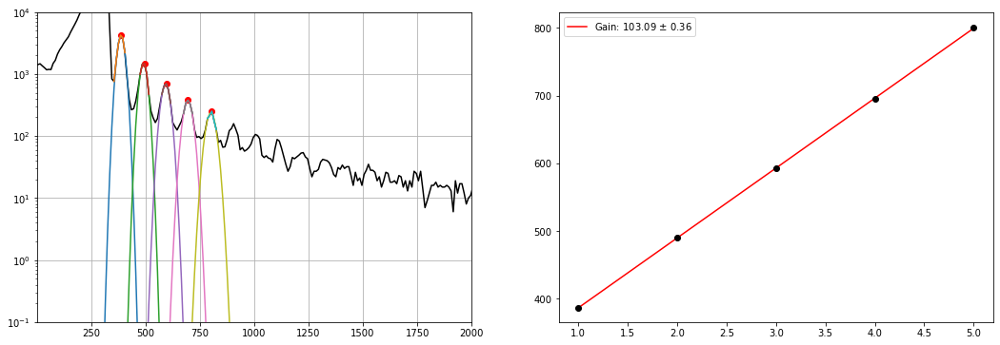

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_19.h5


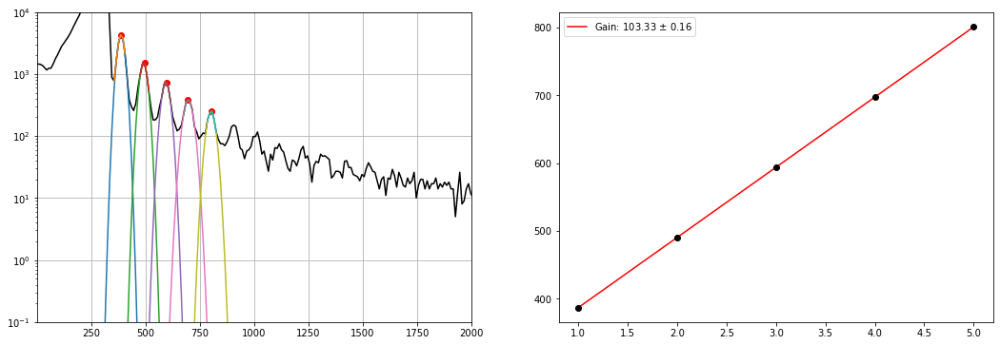

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_20.h5


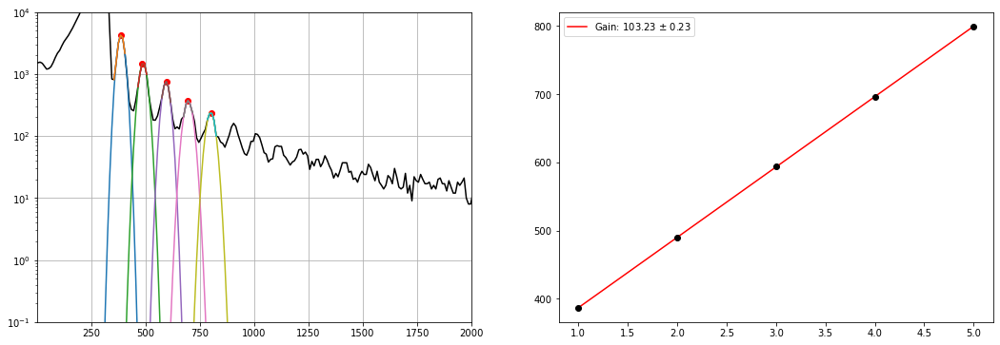

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_21.h5


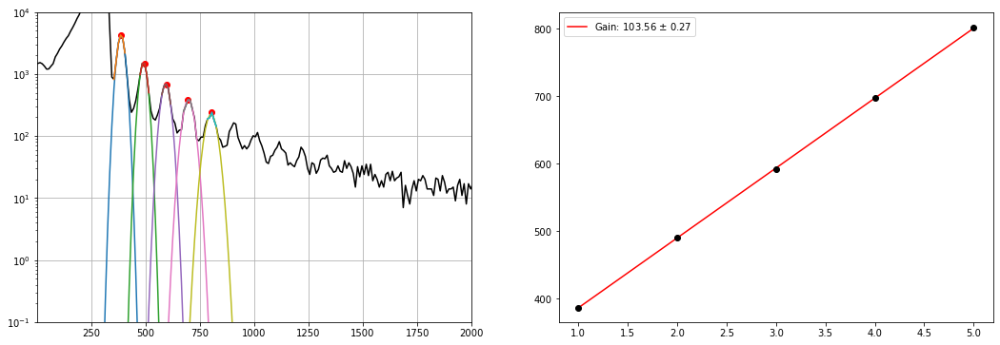

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_22.h5


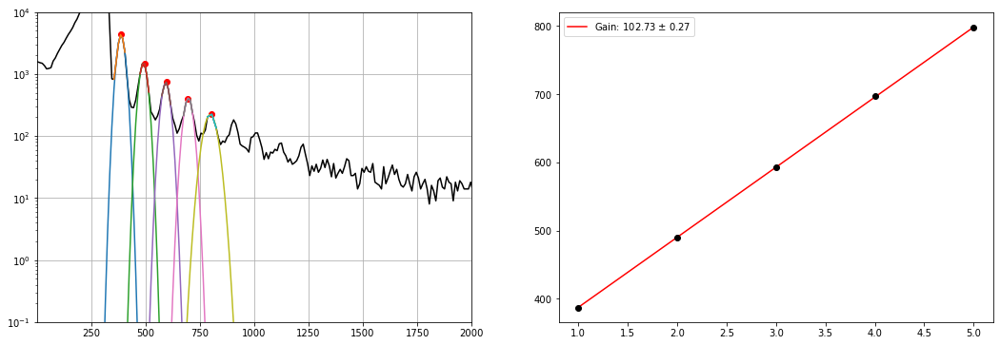

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_23.h5


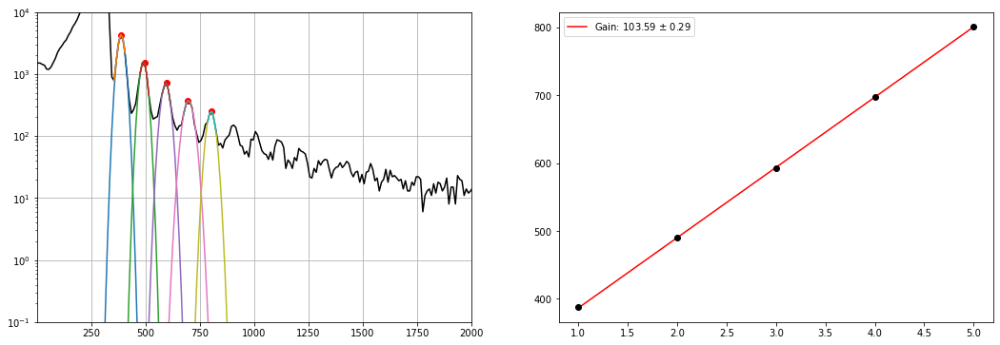

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_24.h5


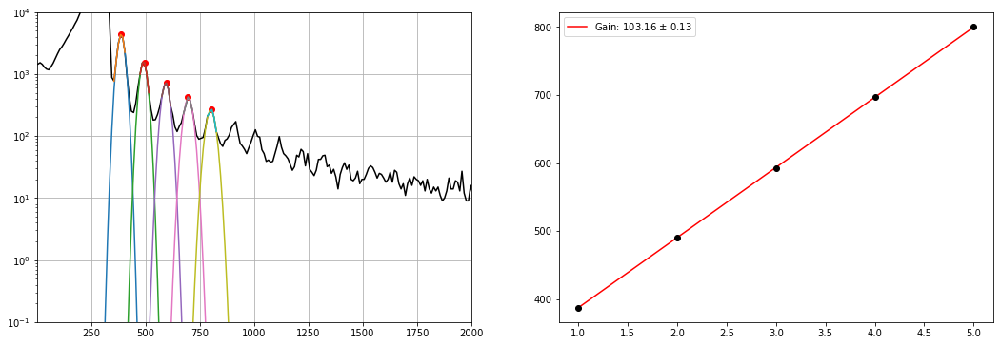

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_25.h5


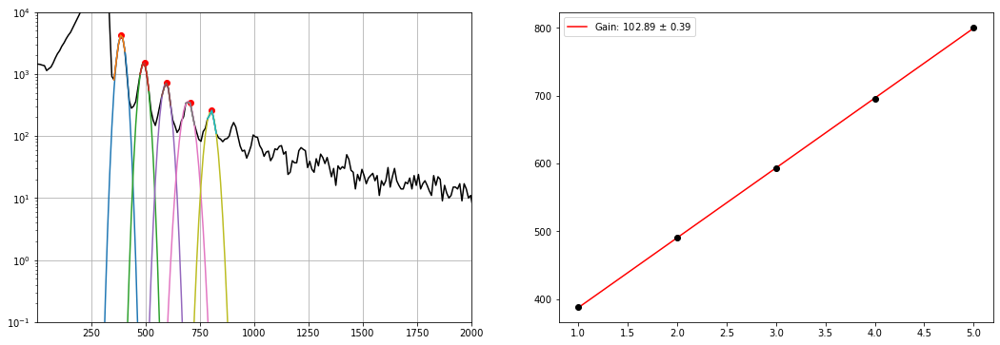

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_26.h5


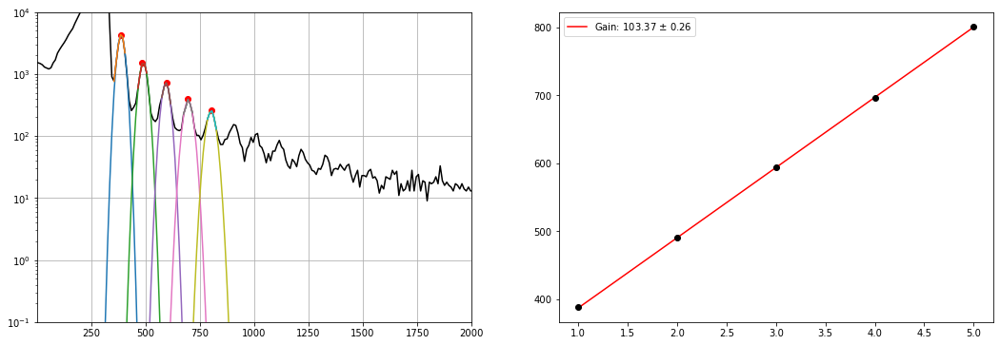

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_27.h5


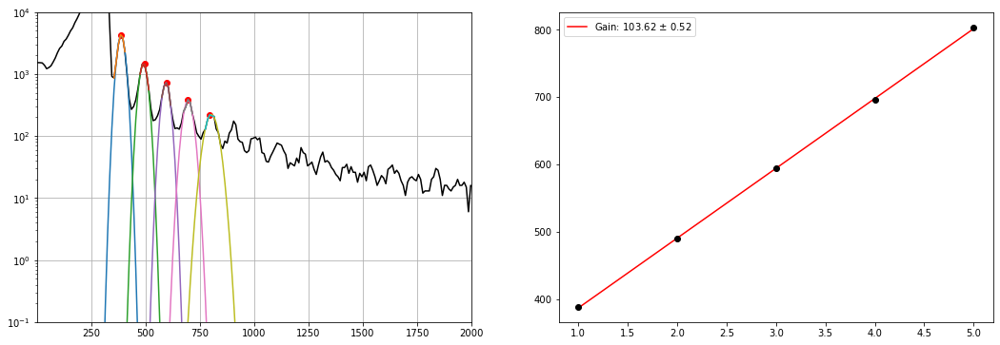

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_28.h5


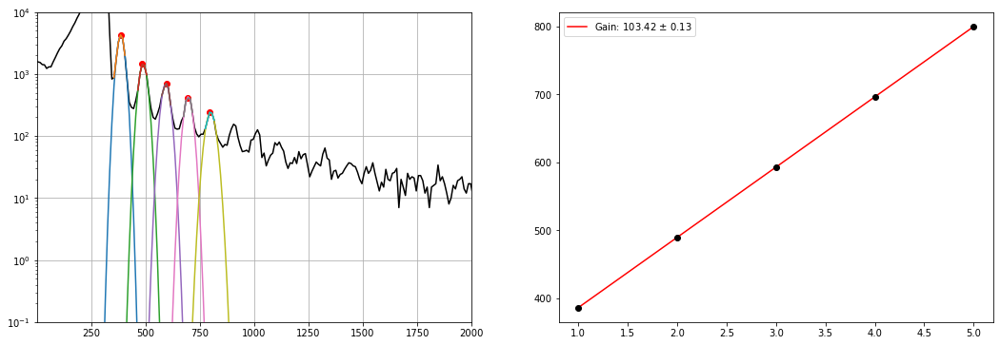

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_29.h5


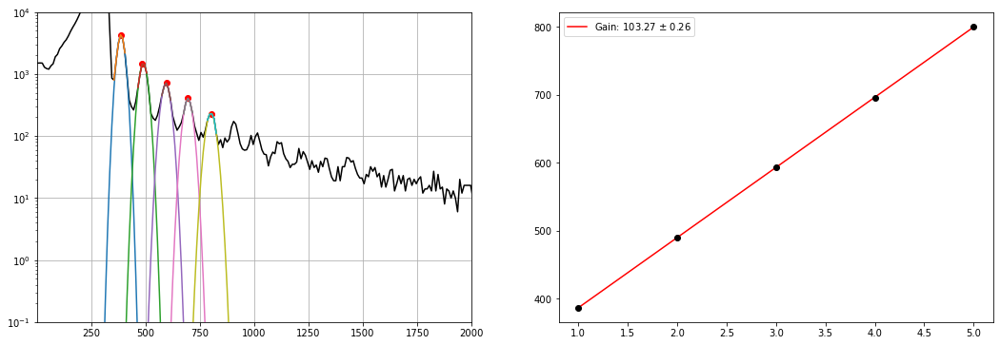

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_30.h5


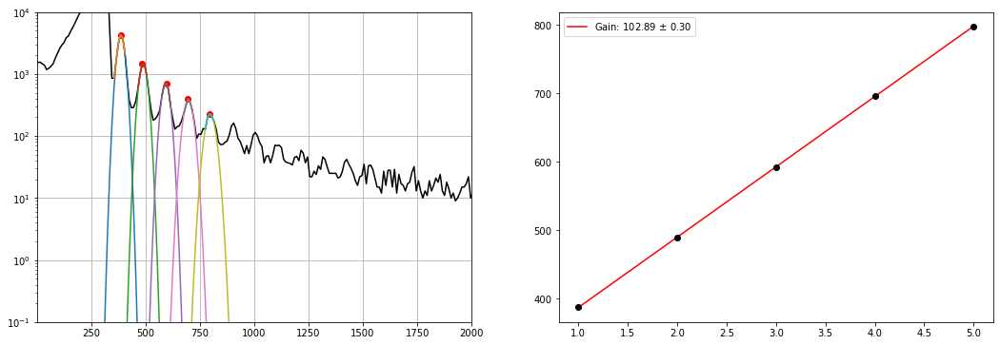

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_31.h5


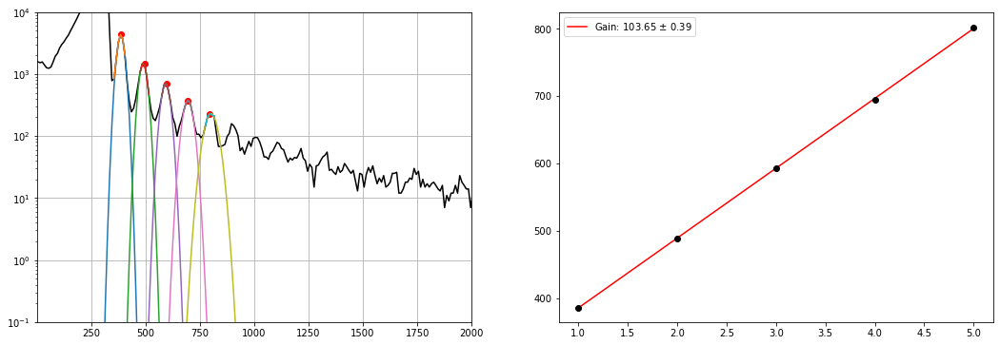

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_32.h5


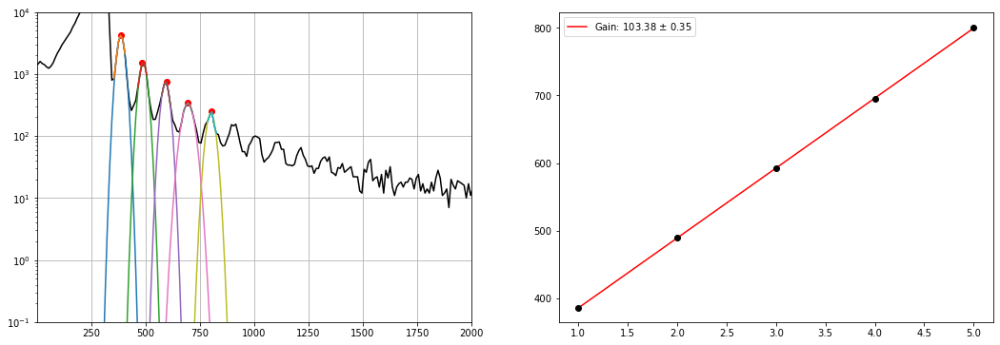

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_33.h5


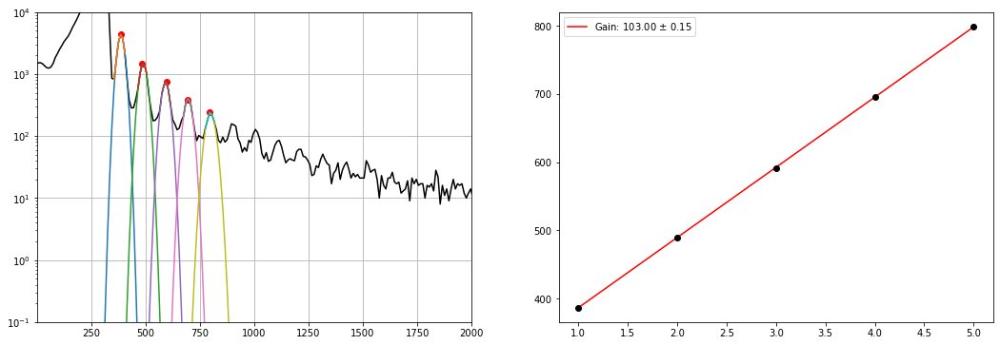

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_34.h5


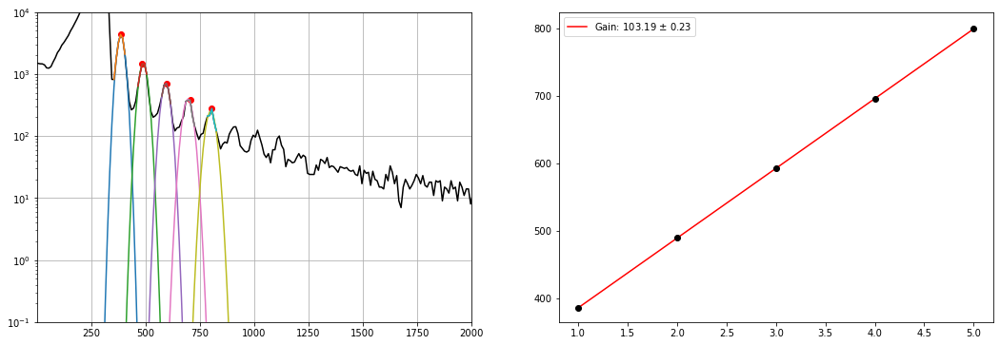

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_35.h5


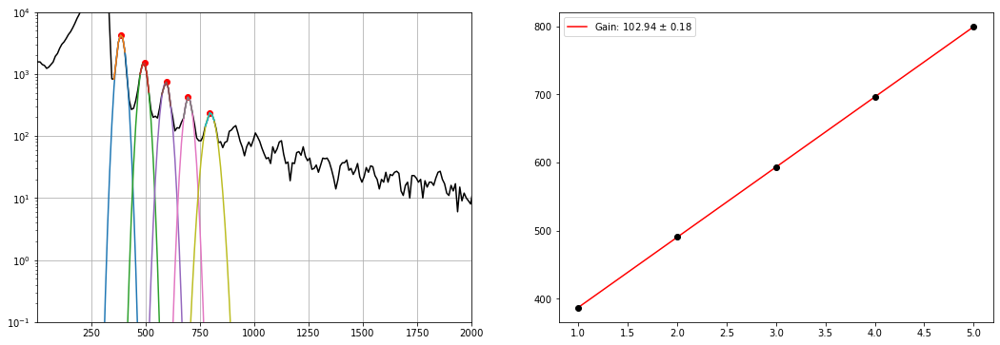

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_36.h5


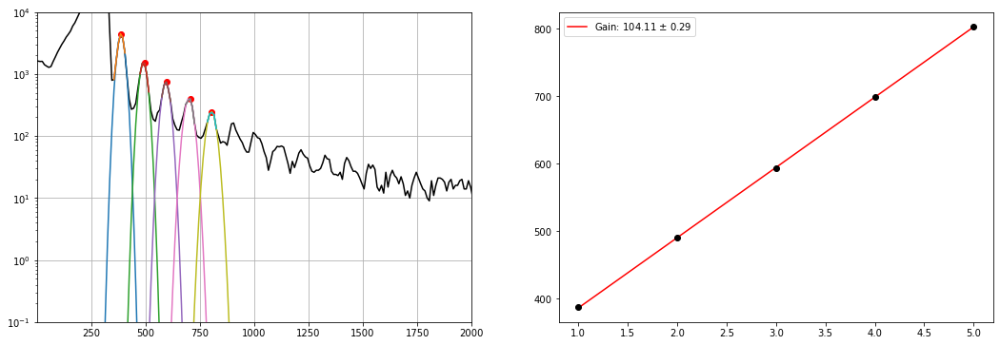

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_37.h5


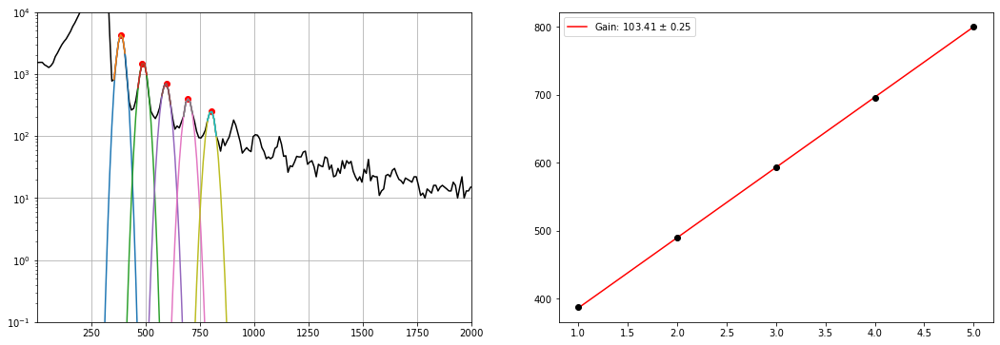

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_38.h5


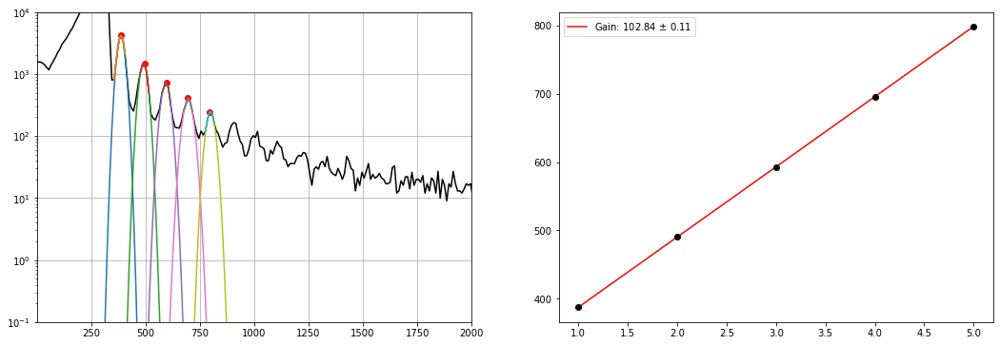

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_39.h5


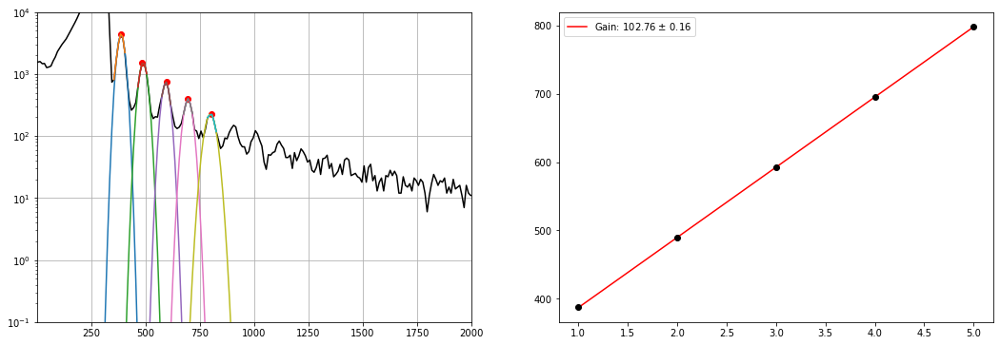

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_40.h5


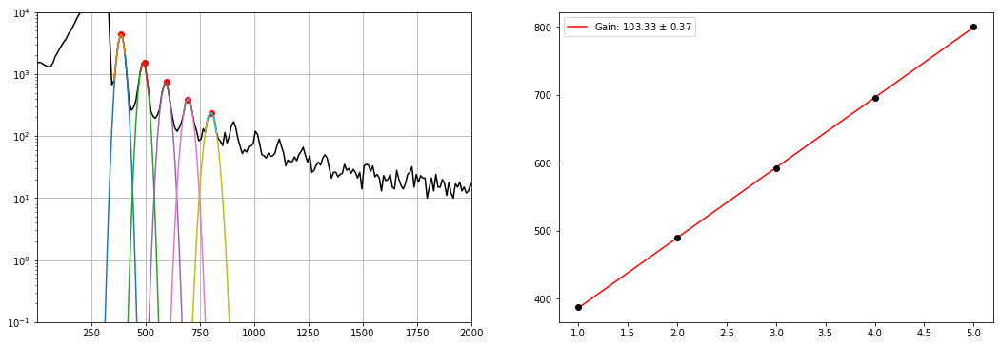

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_41.h5


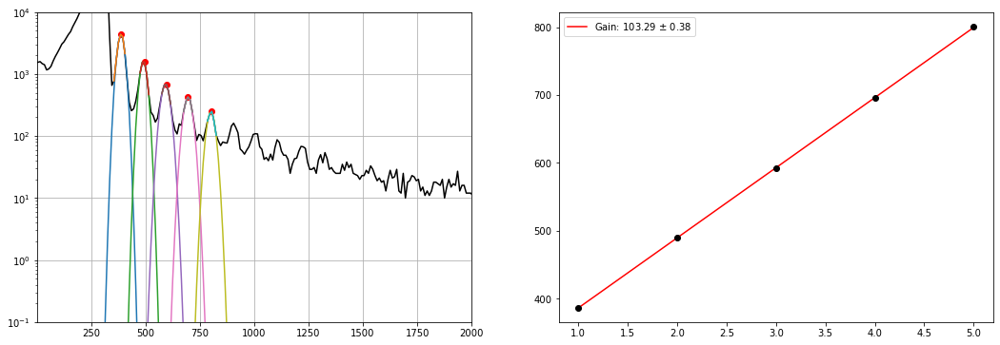

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_42.h5


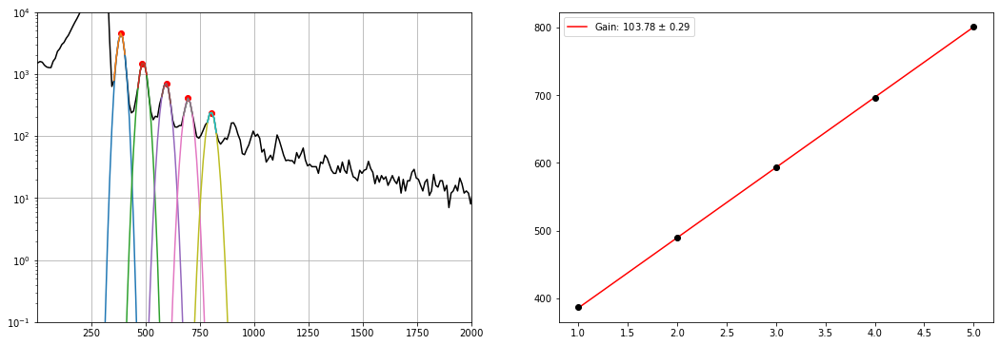

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_43.h5


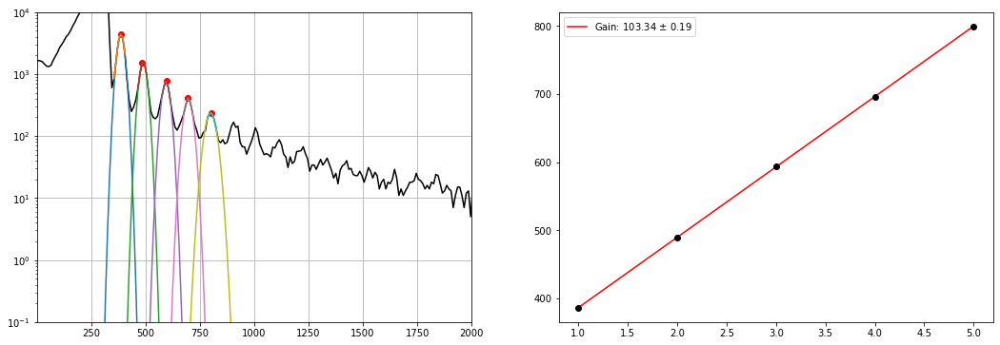

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_44.h5


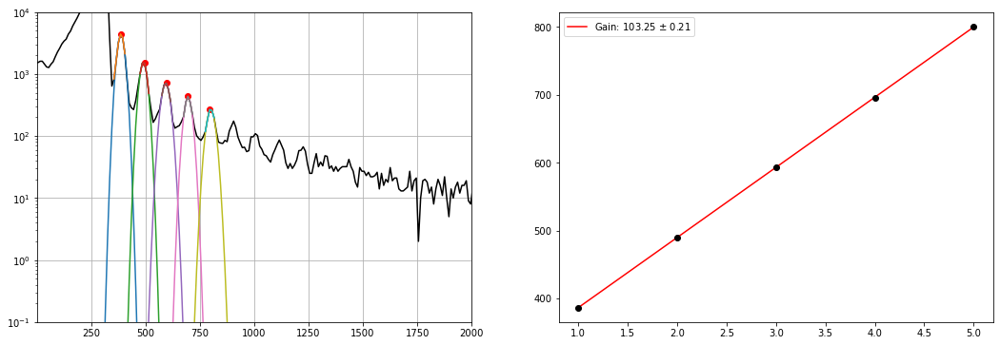

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_45.h5


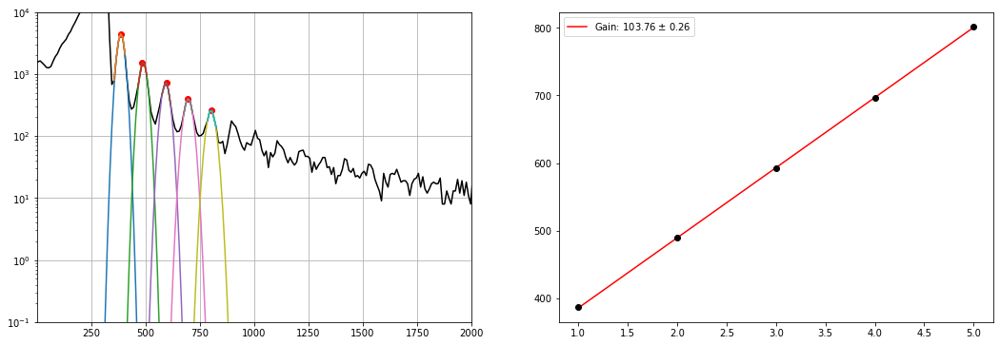

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_46.h5


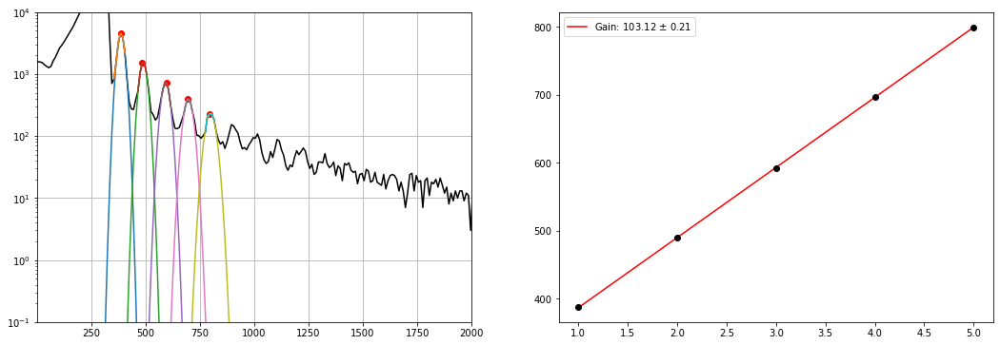

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_47.h5


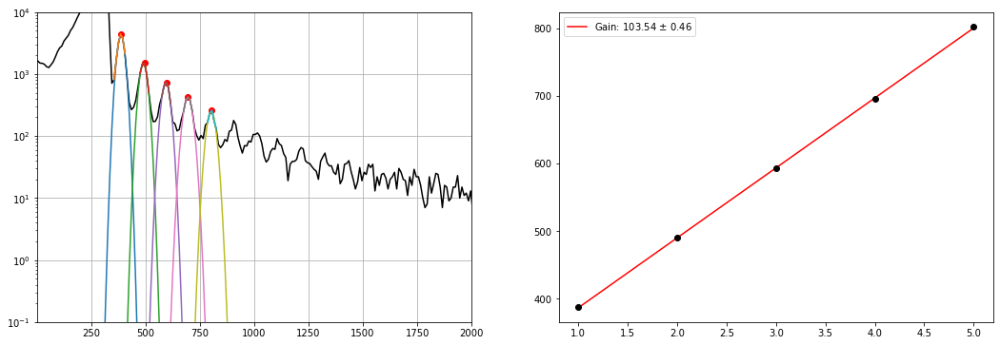

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_48.h5


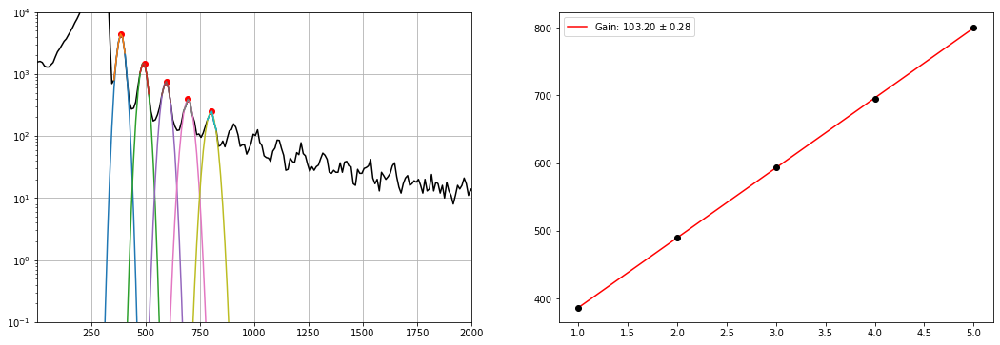

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_49.h5


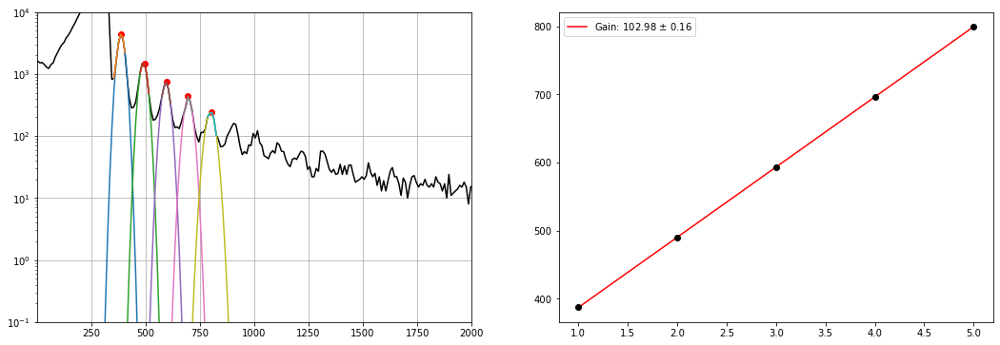

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_50.h5


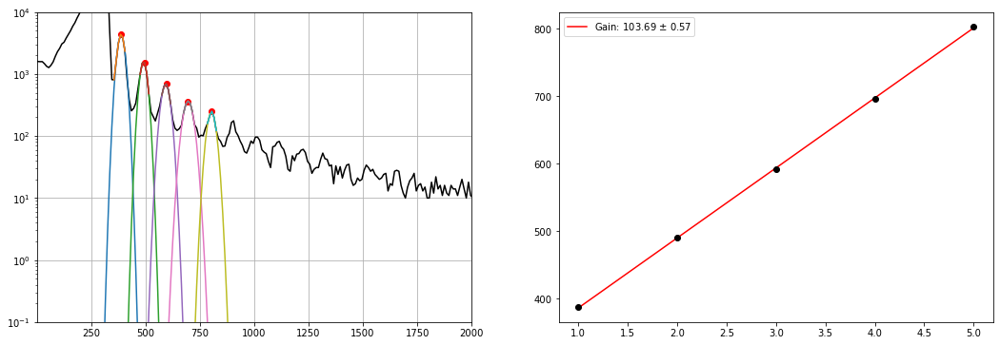

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_51.h5


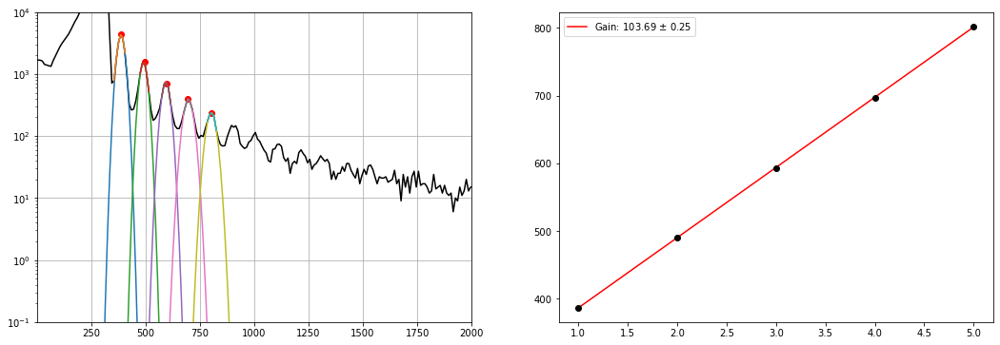

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_52.h5


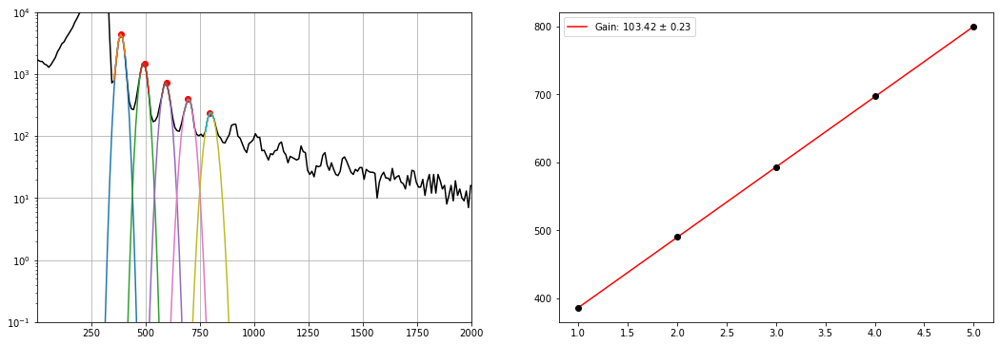

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_53.h5


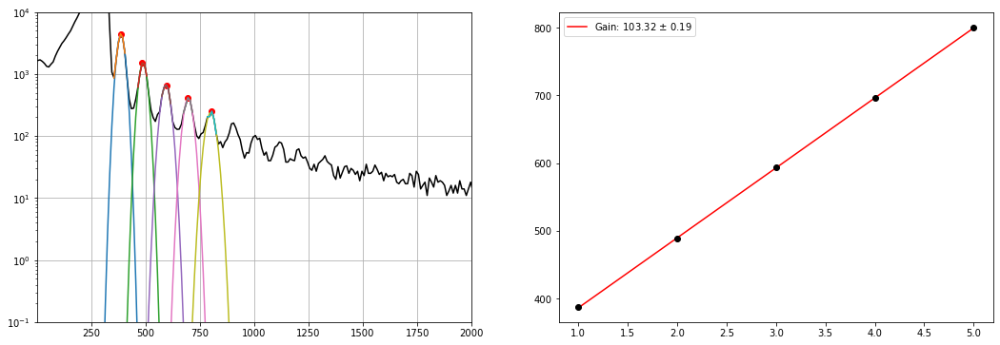

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_54.h5


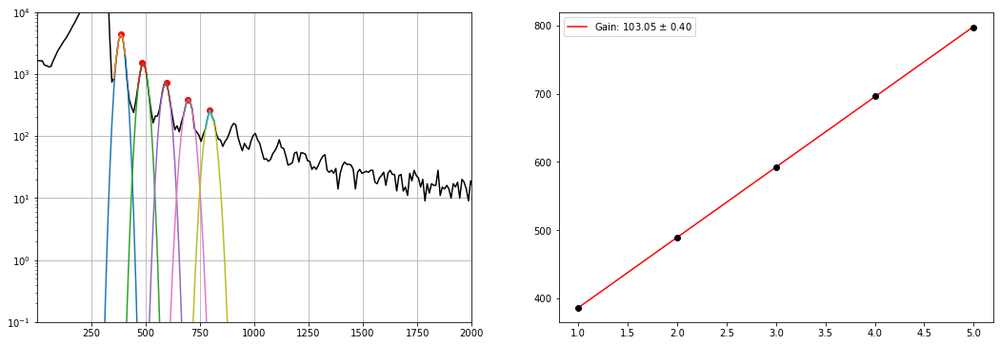

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_55.h5


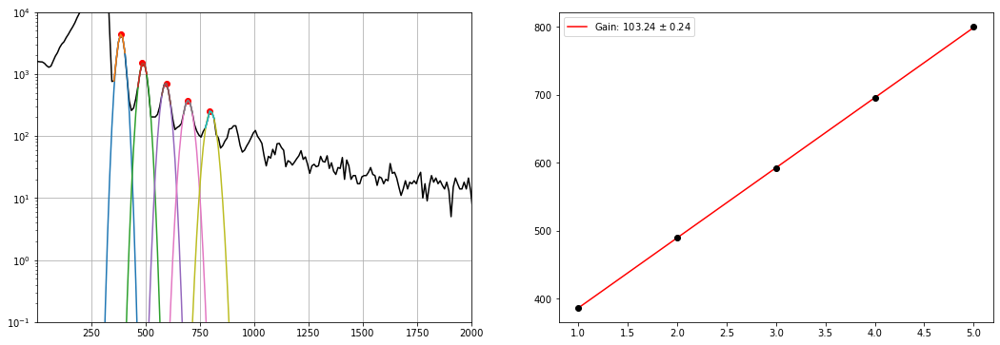

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_56.h5


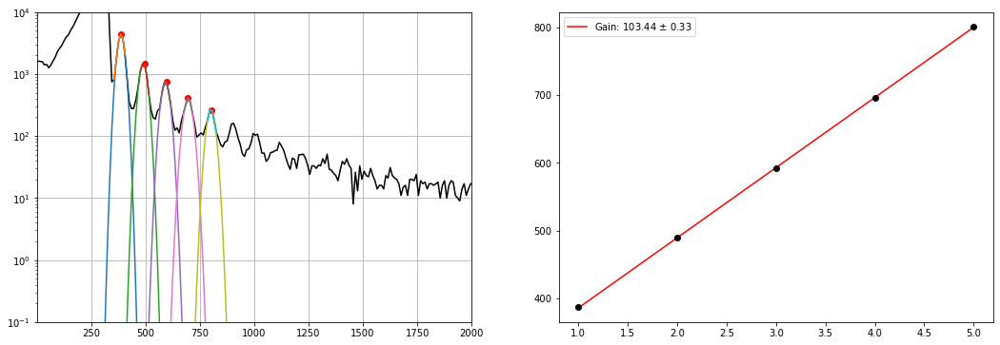

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_57.h5


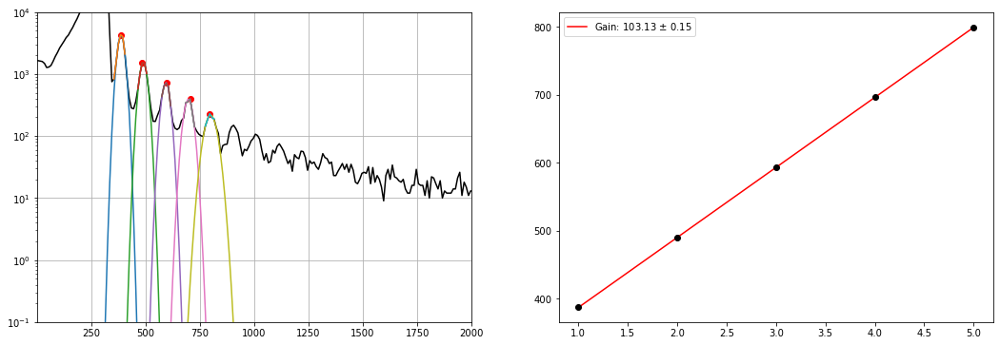

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_58.h5


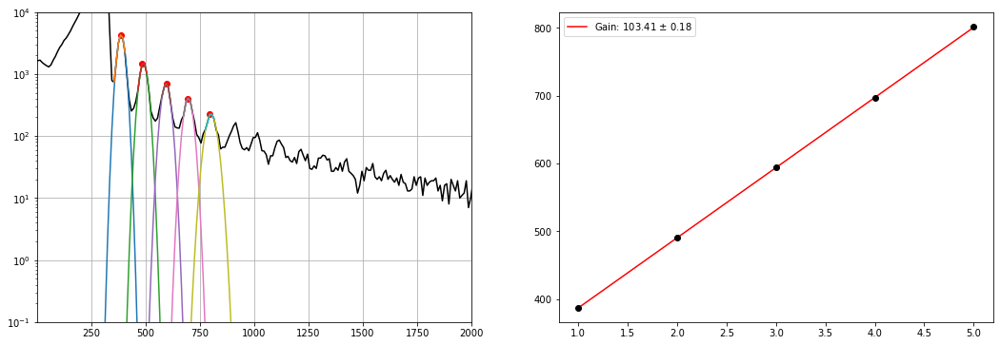

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_59.h5


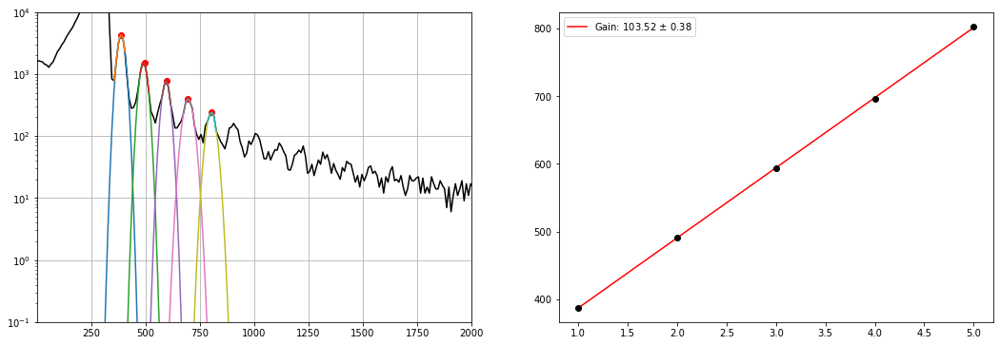

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_60.h5


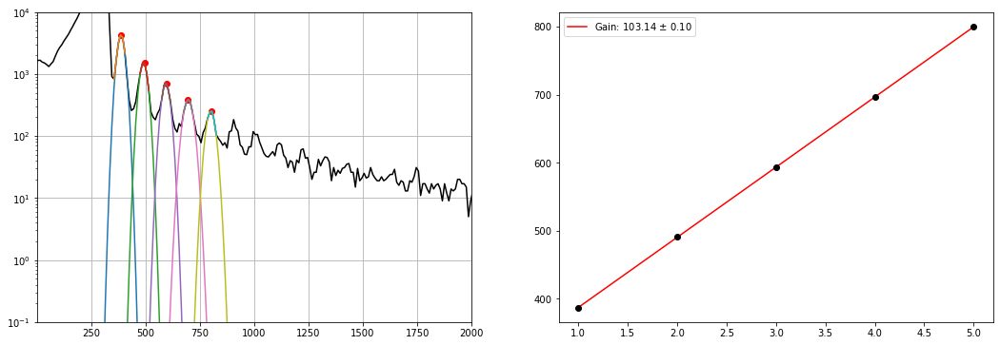

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_61.h5


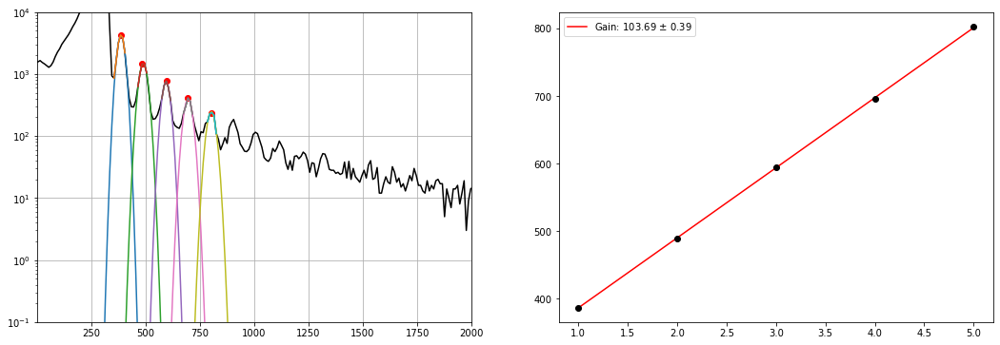

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_62.h5


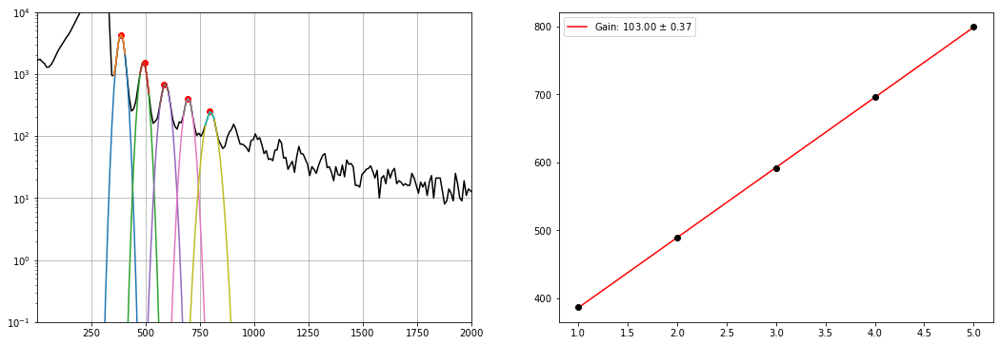

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_63.h5


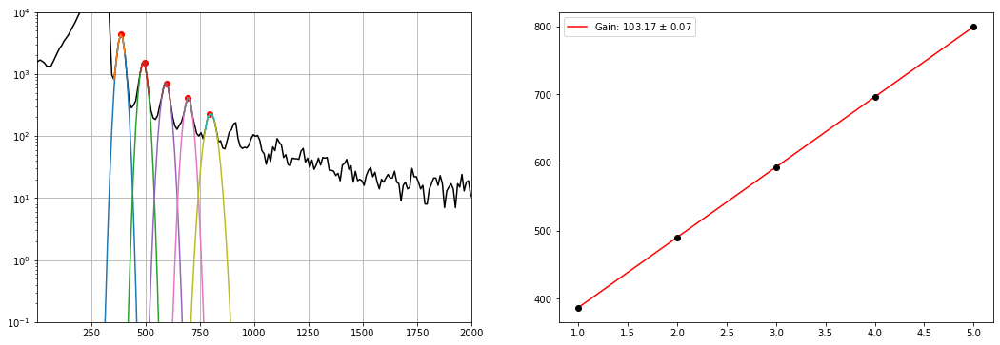

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_64.h5


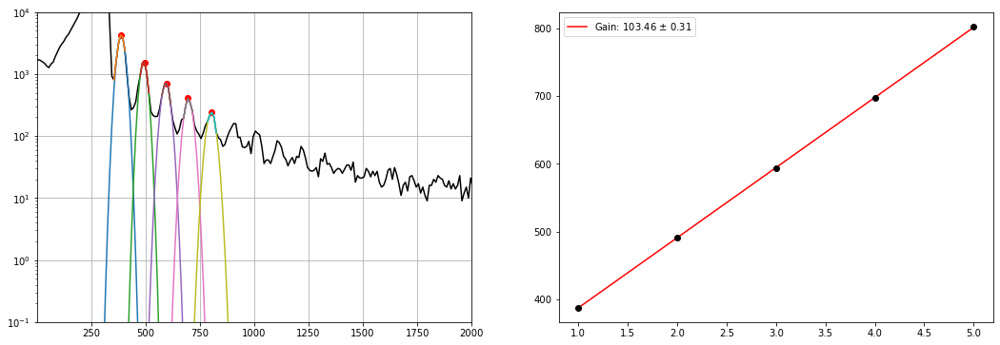

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_65.h5


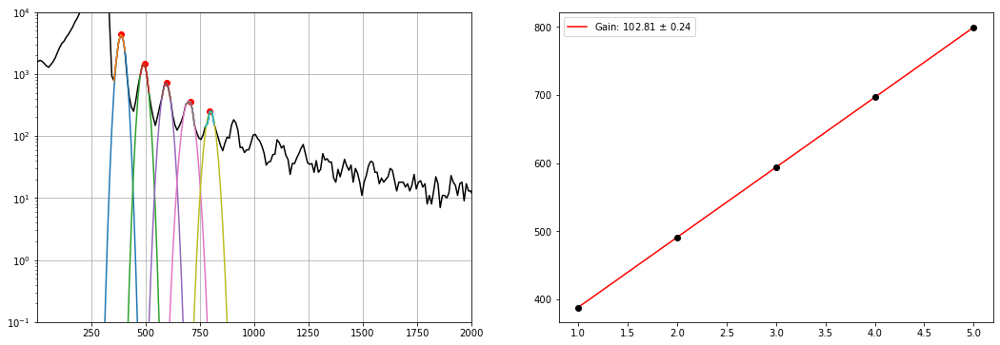

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_66.h5


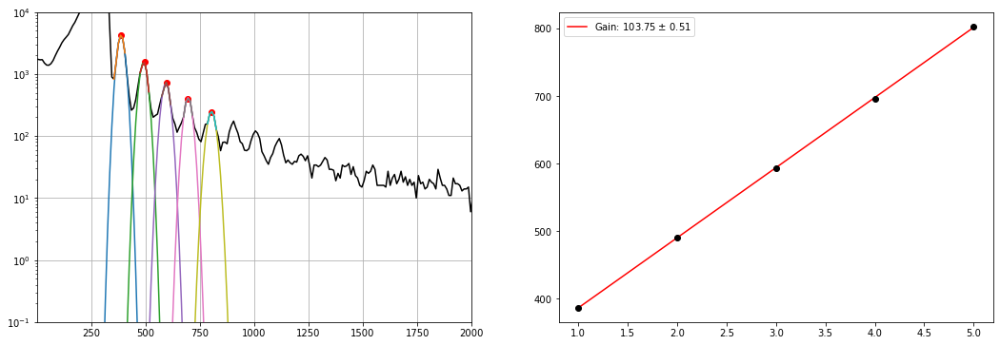

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_67.h5


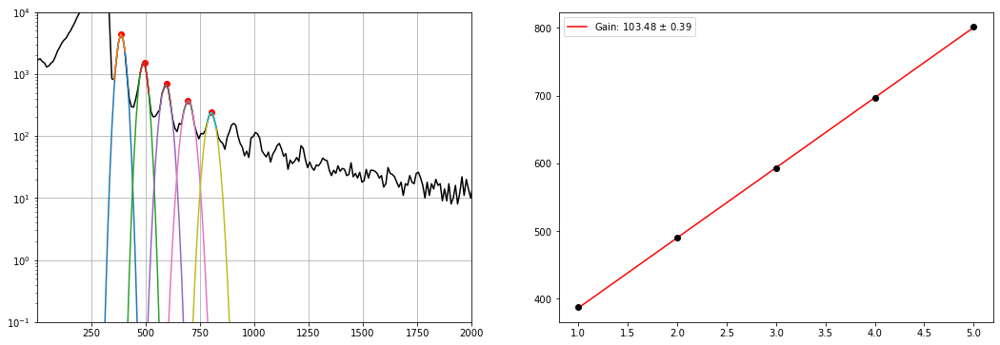

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_68.h5


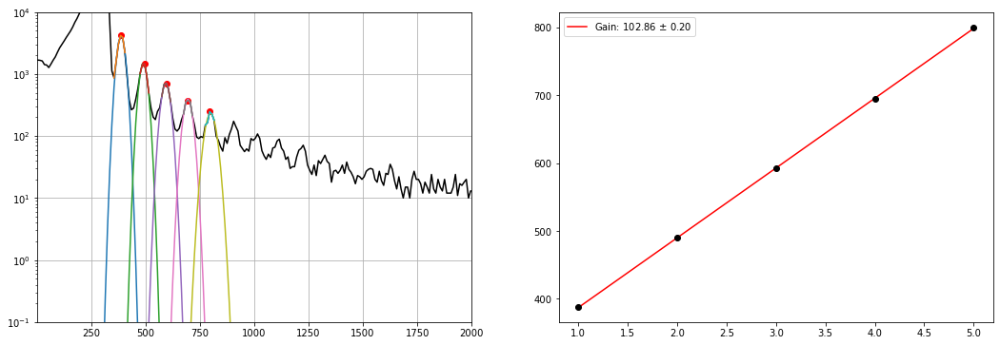

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_69.h5


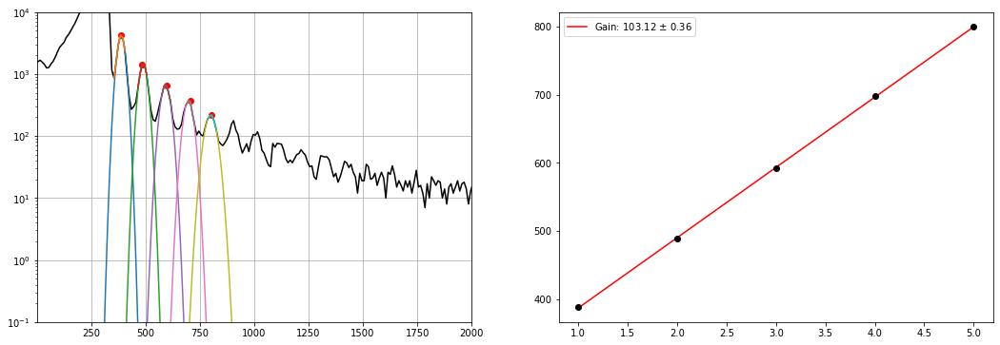

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_70.h5


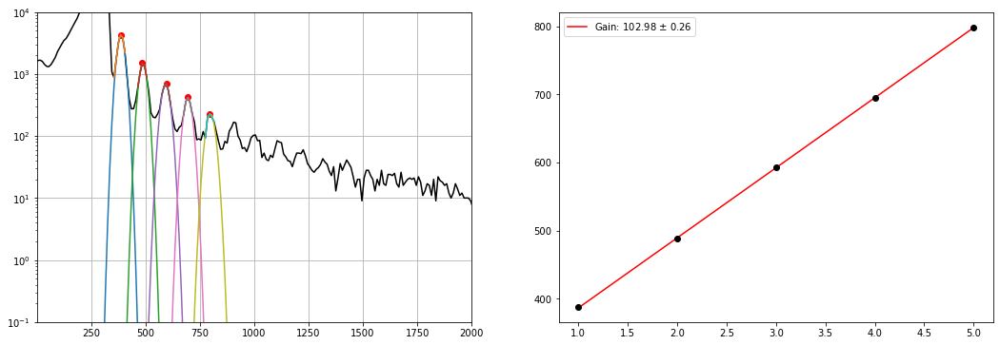

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_71.h5


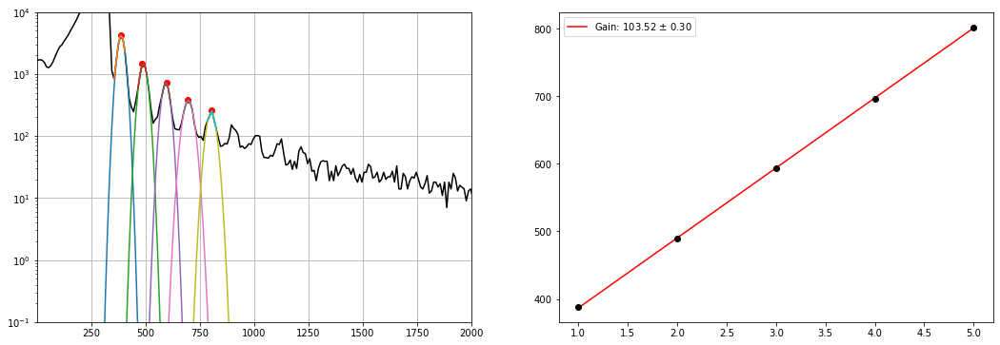

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_72.h5


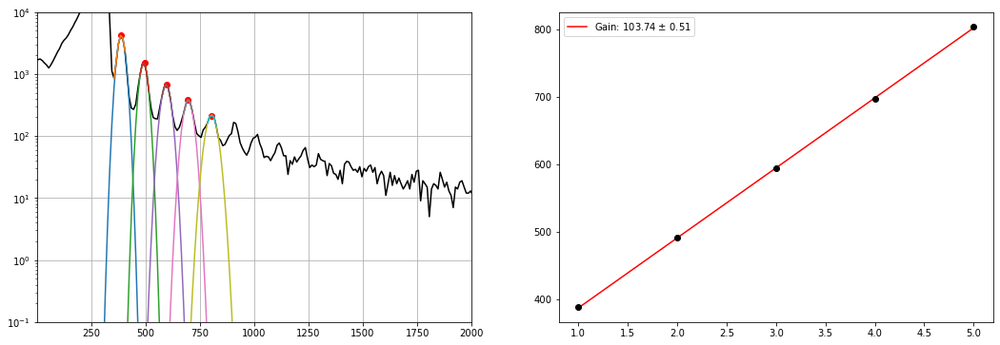

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_73.h5


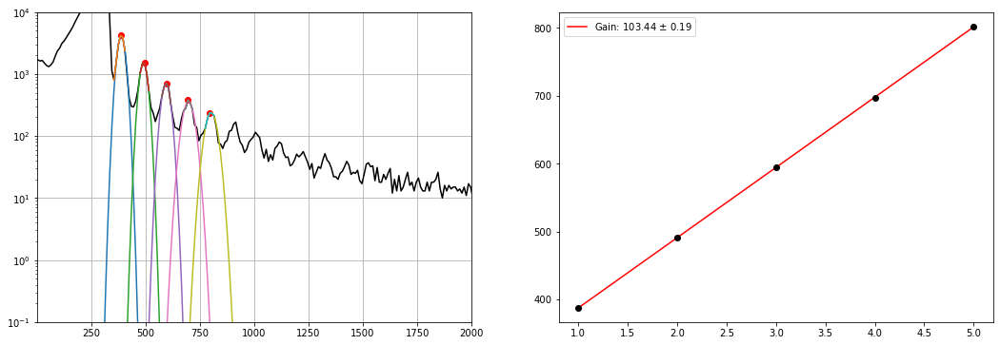

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_74.h5


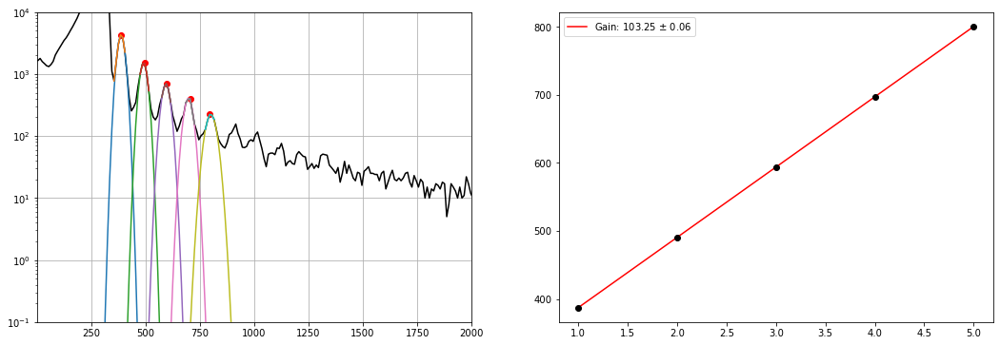

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_75.h5


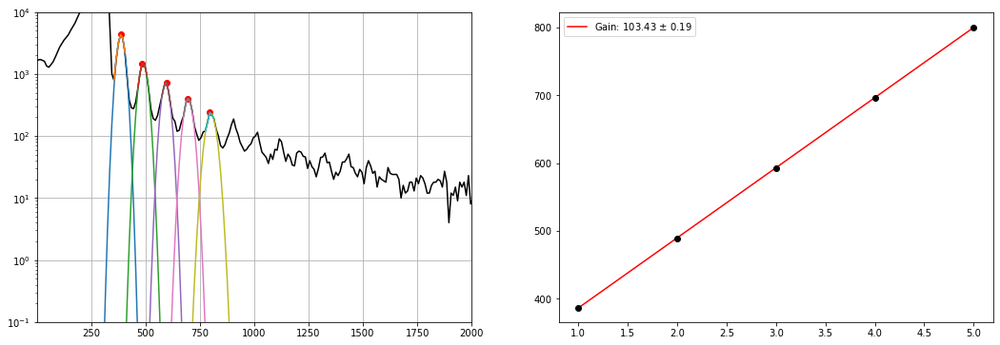

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_76.h5


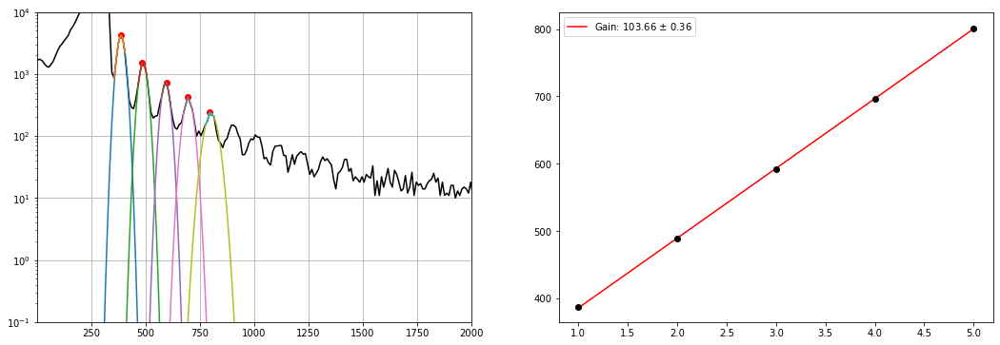

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_77.h5


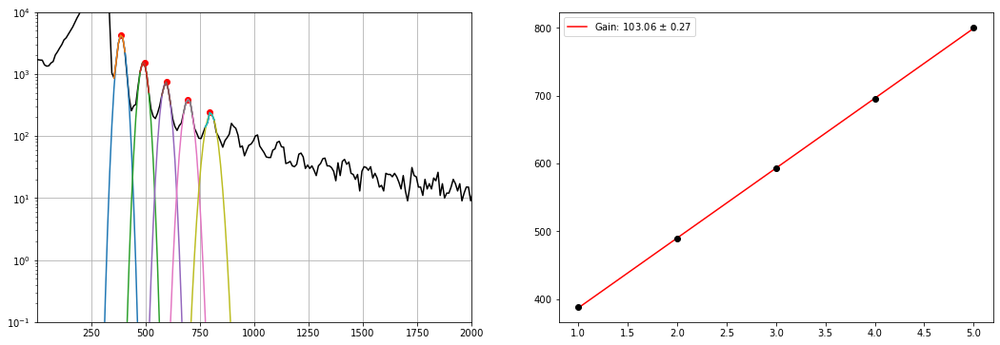

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_78.h5


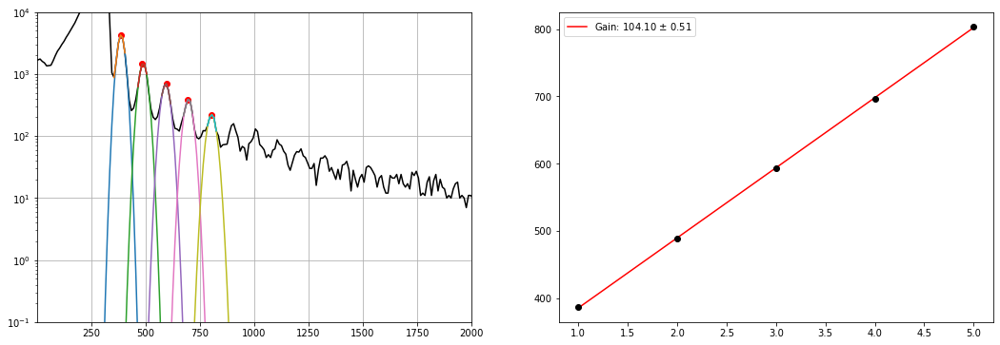

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_79.h5


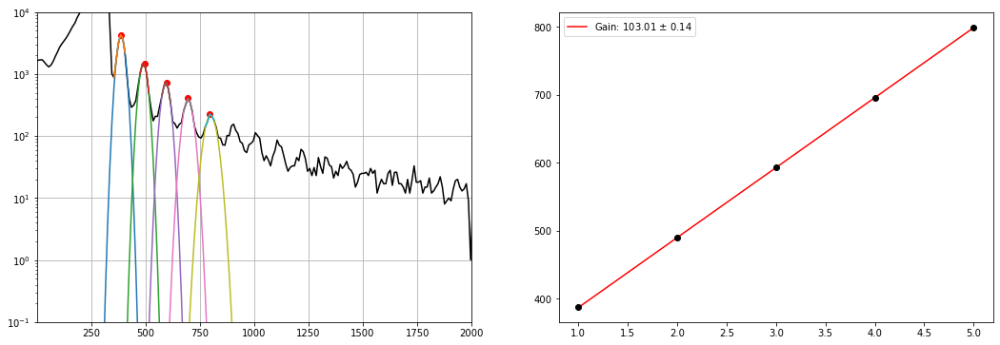

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_80.h5


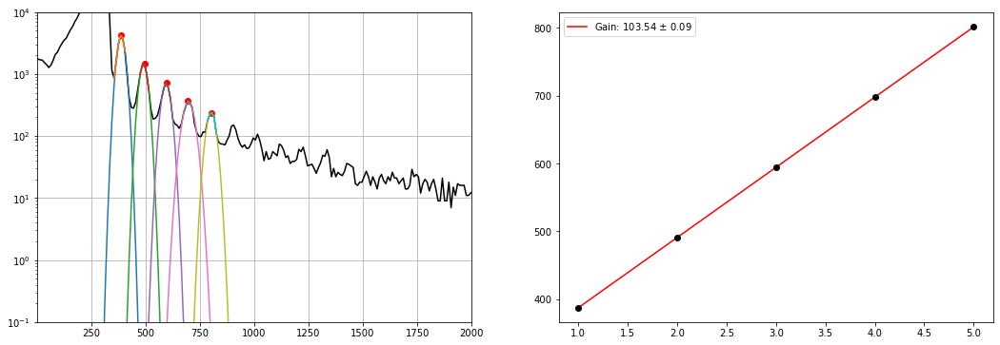

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_81.h5


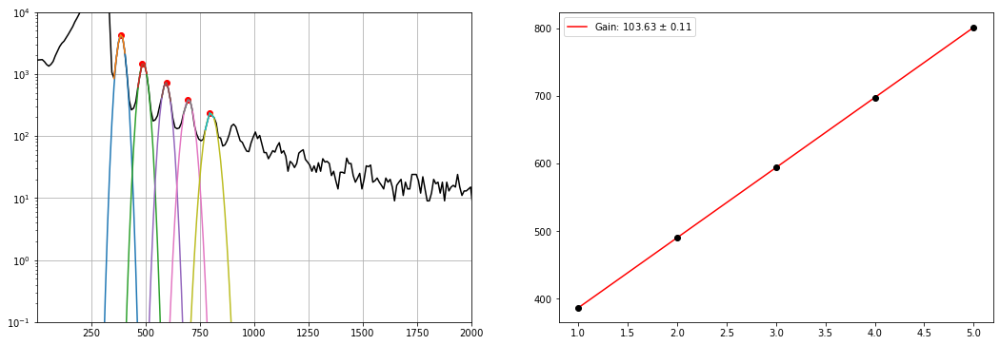

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_82.h5


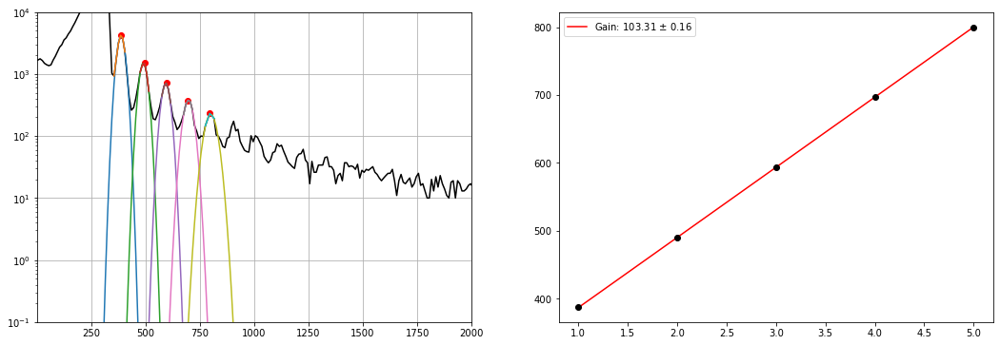

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_83.h5


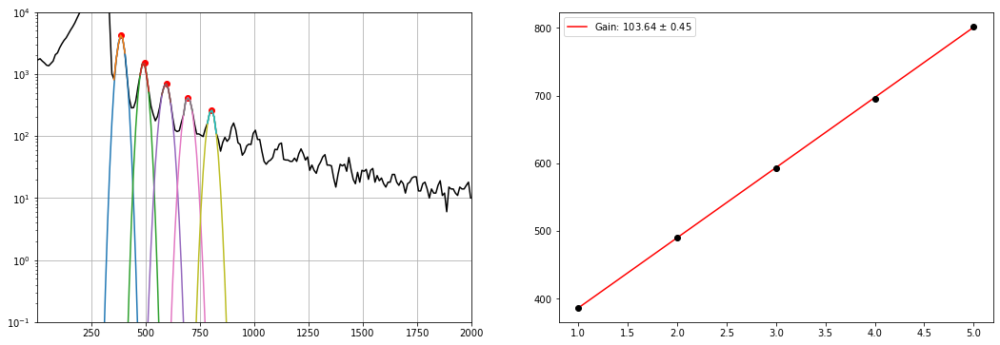

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_84.h5


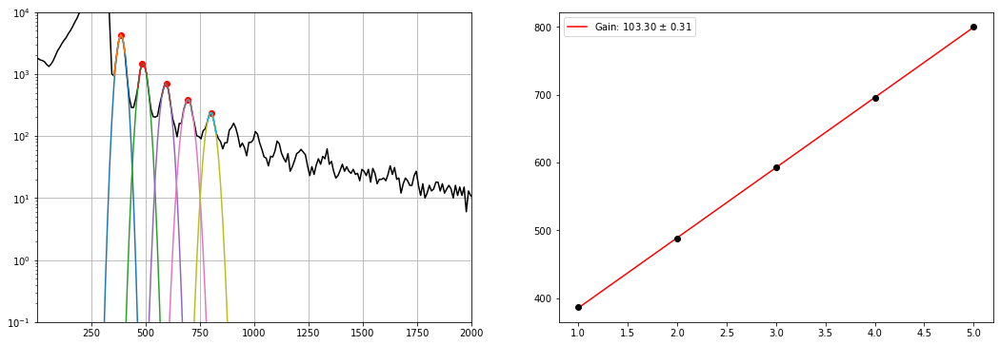

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_85.h5


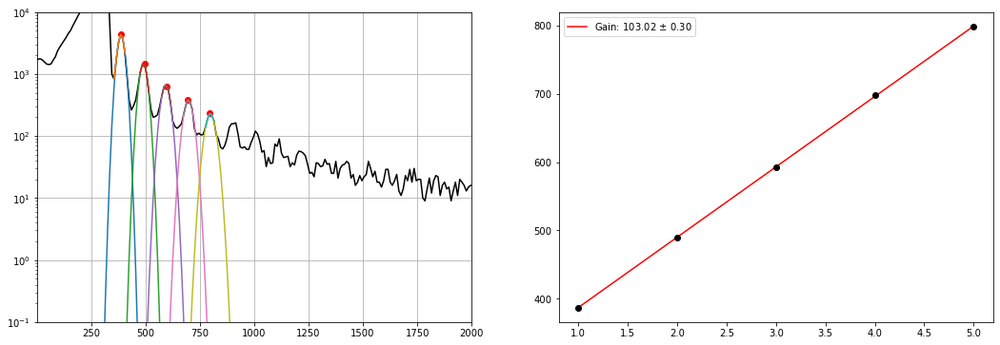

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_86.h5


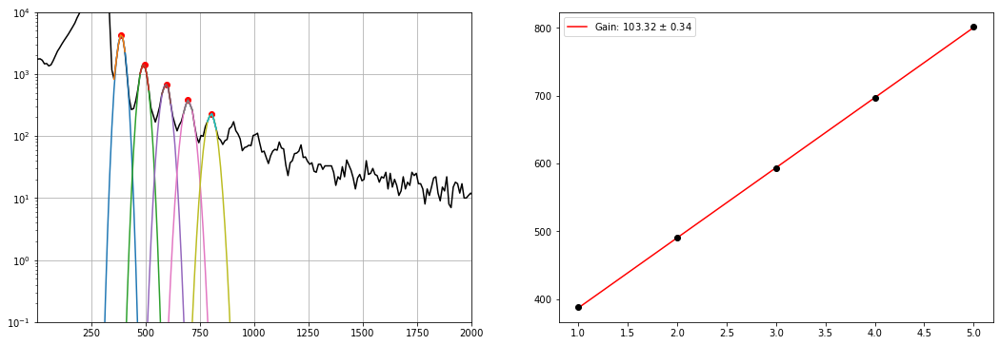

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_87.h5


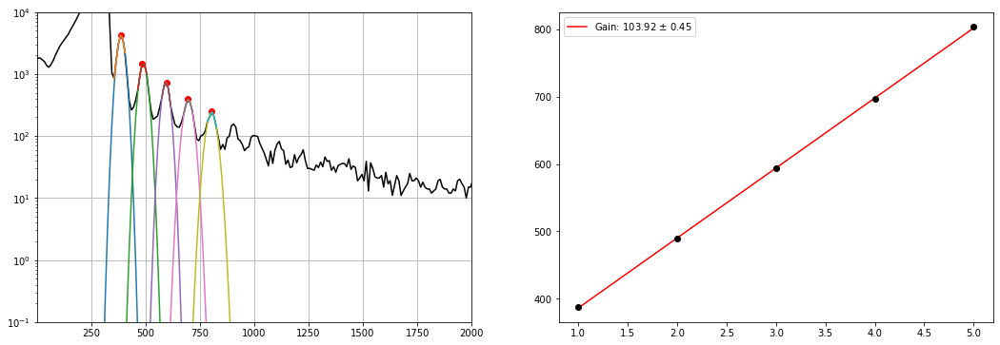

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_88.h5


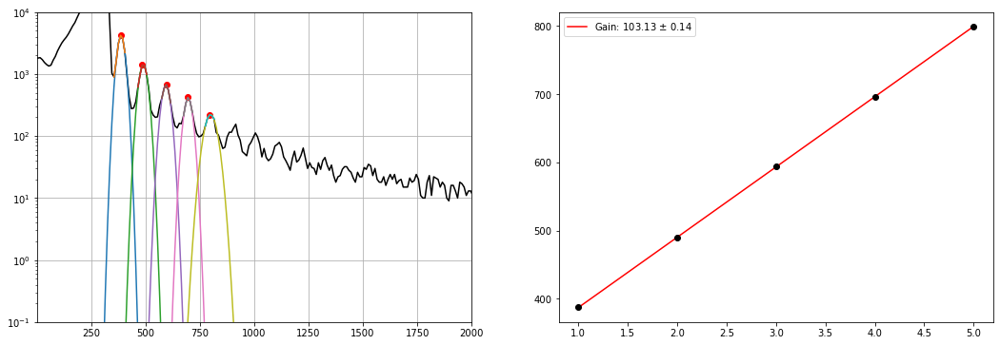

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_89.h5


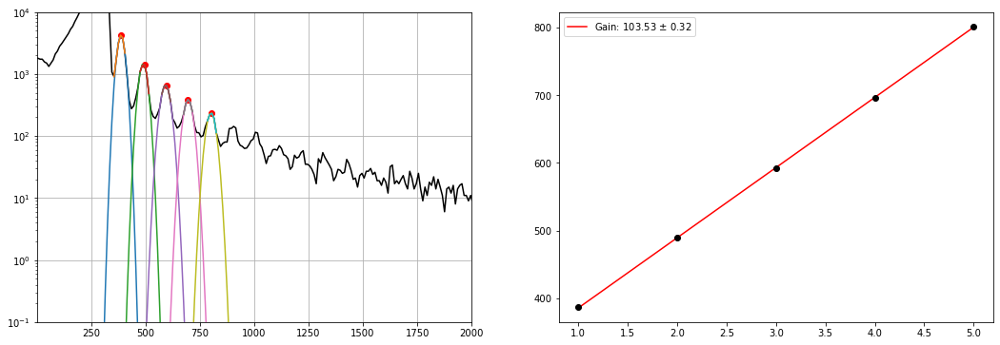

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_90.h5


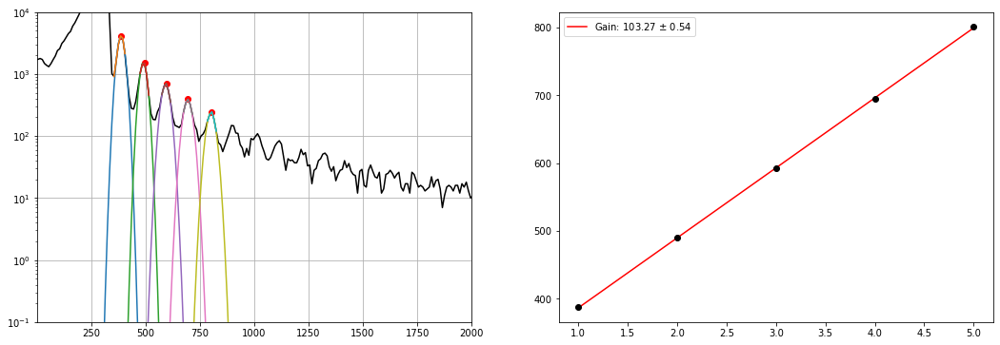

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_91.h5


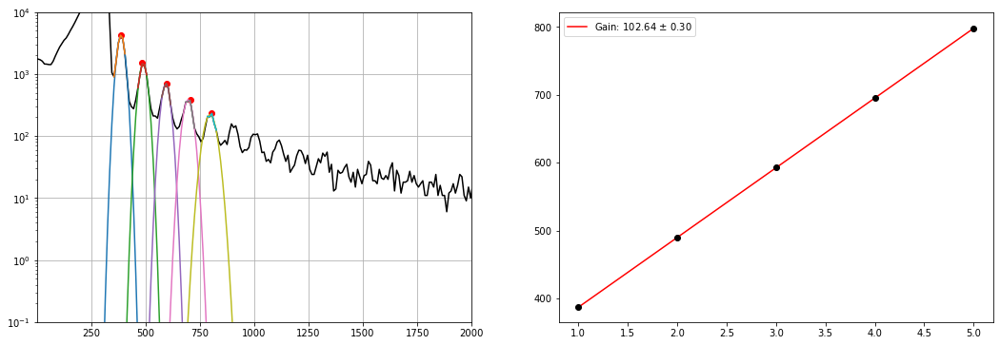

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_92.h5


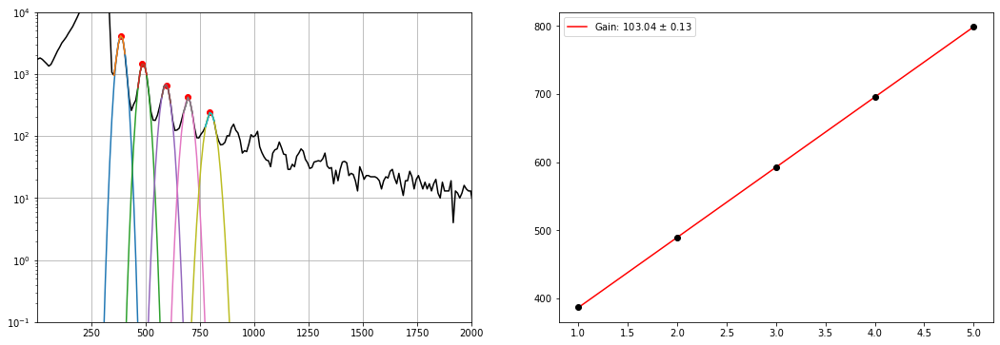

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_93.h5


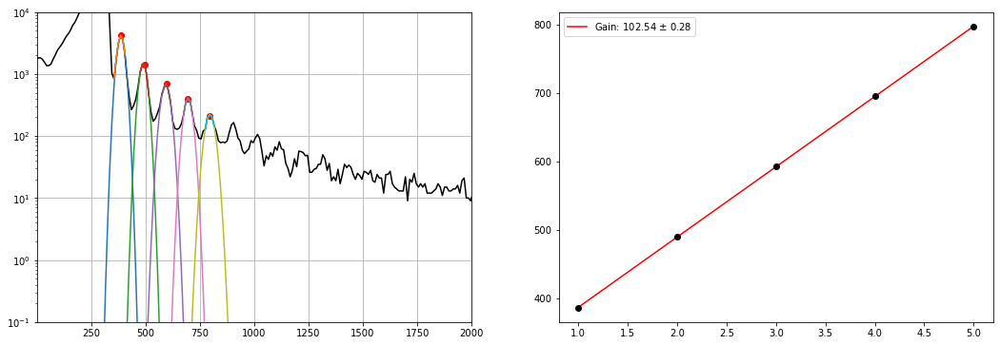

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_94.h5


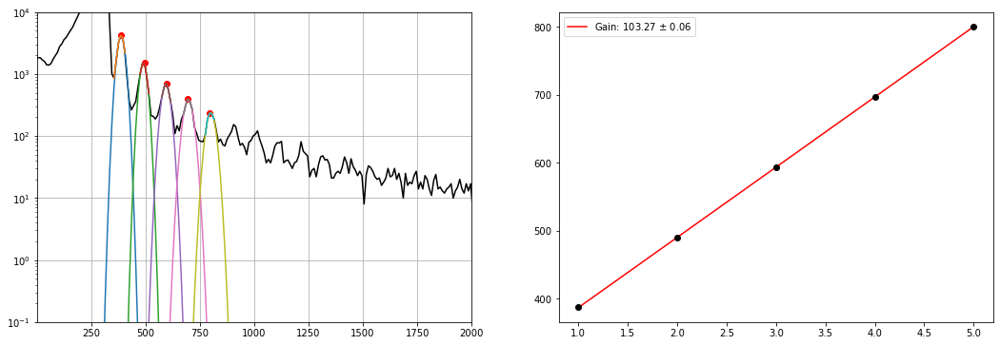

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_95.h5


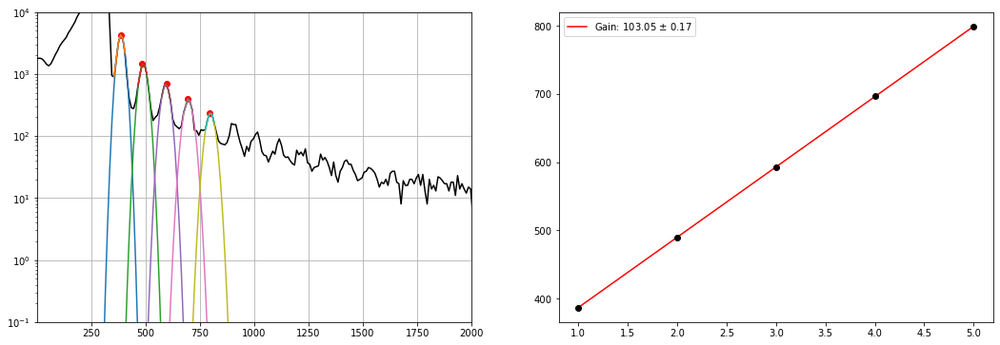

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_96.h5


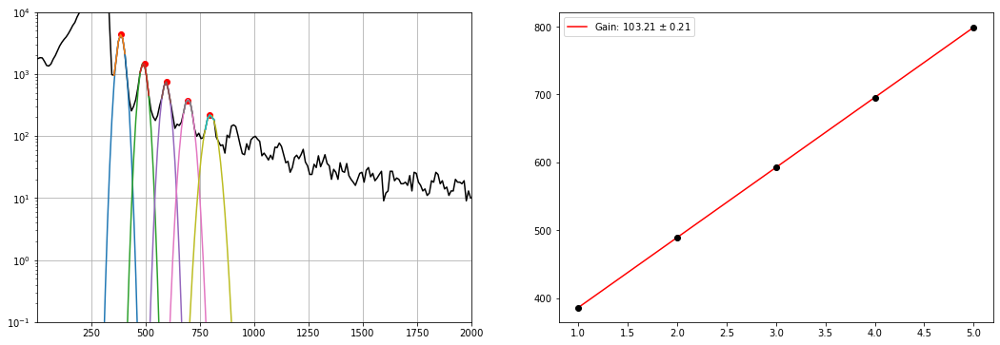

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_97.h5


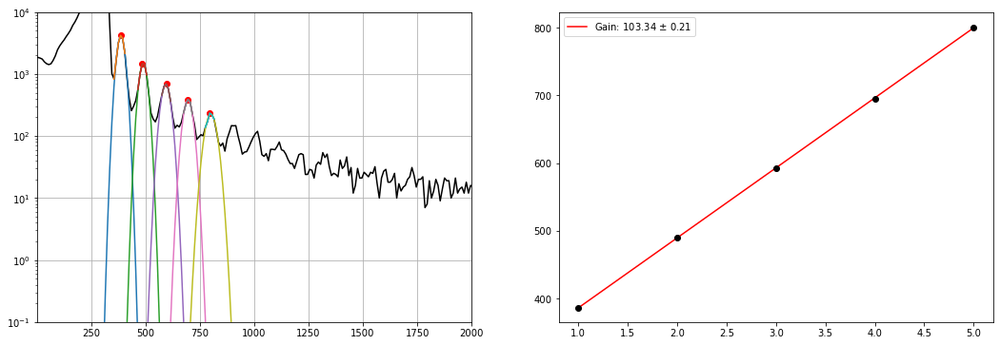

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_98.h5


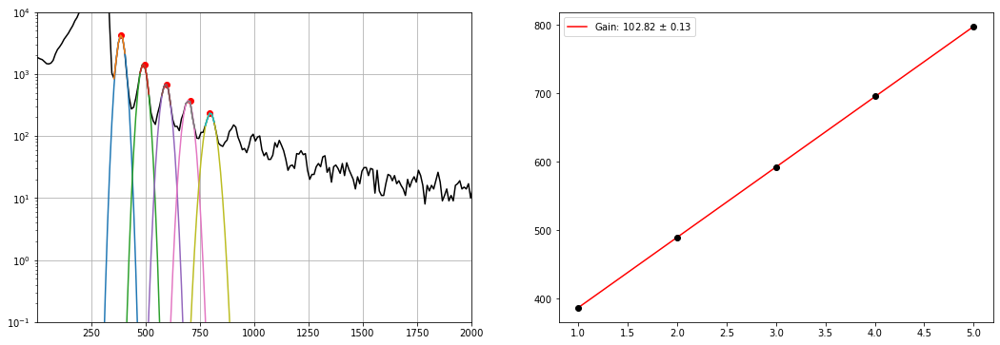

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_99.h5


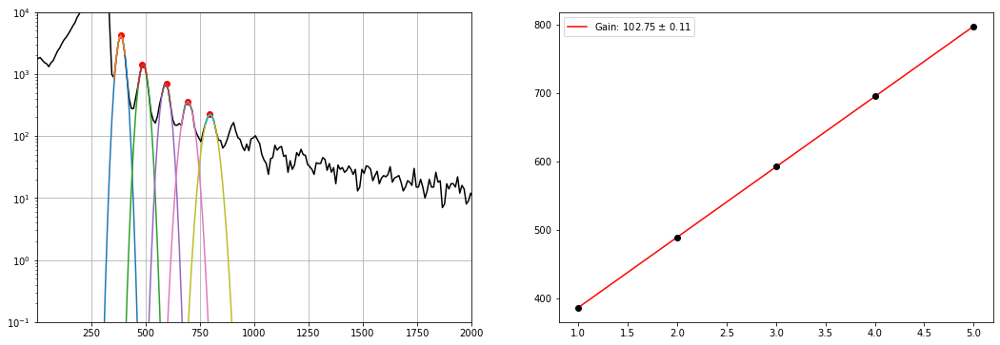

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_100.h5


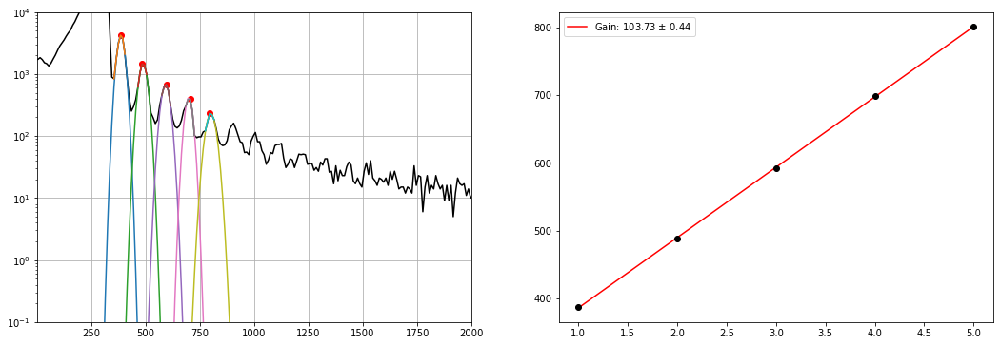

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_101.h5


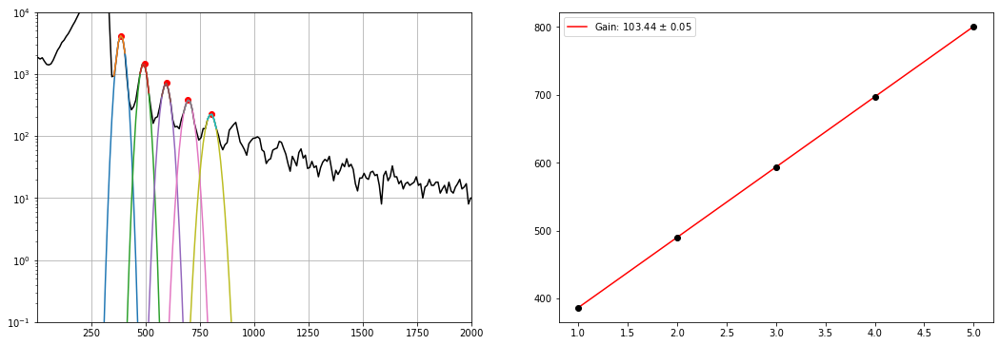

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_102.h5


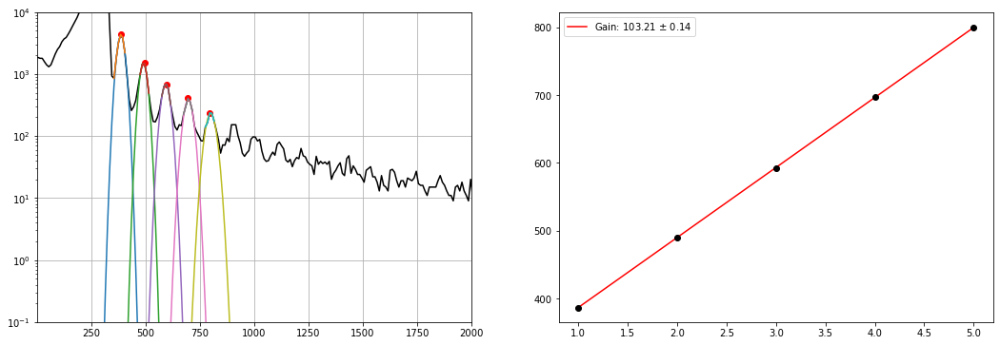

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_103.h5


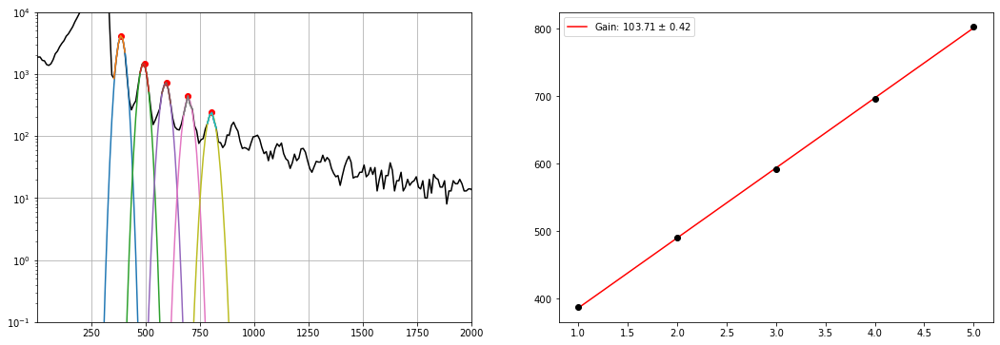

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_104.h5


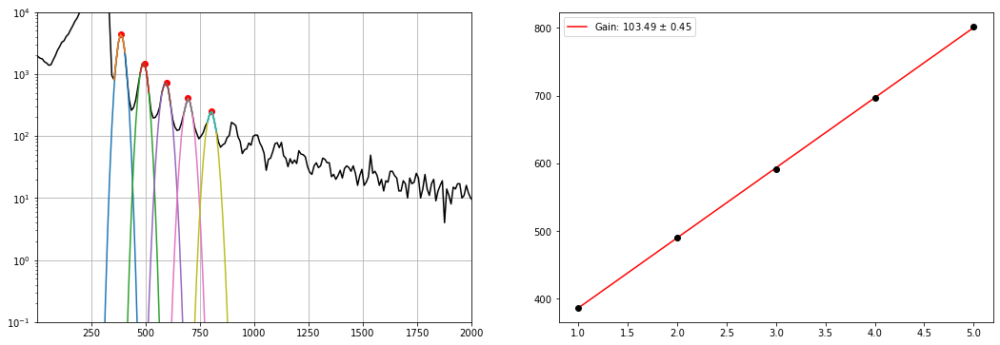

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_105.h5


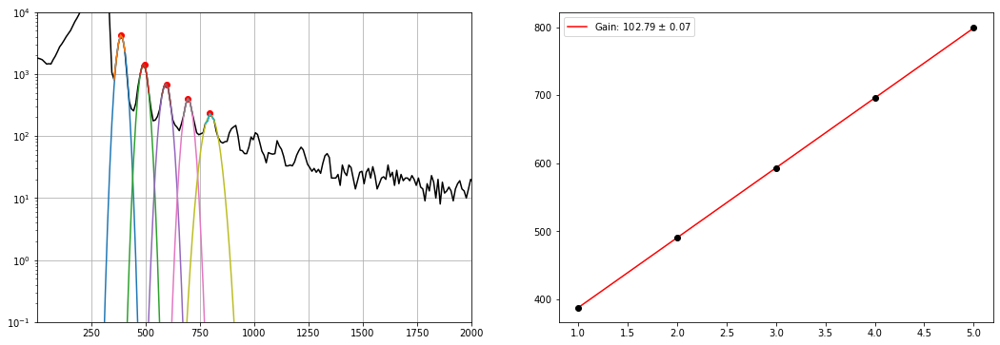

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_106.h5


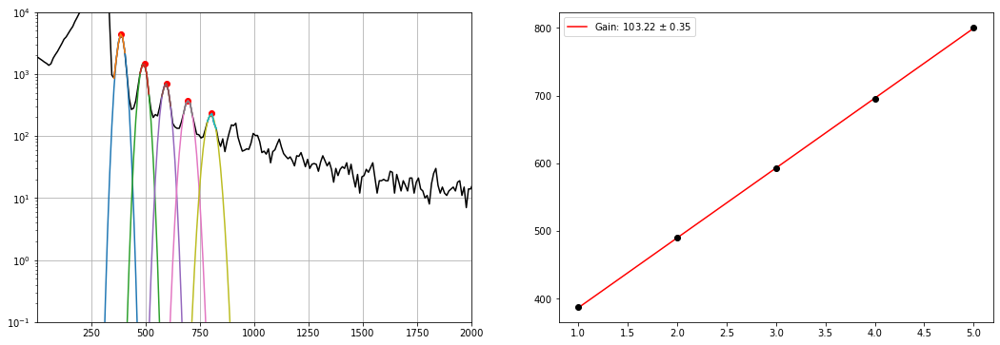

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_107.h5


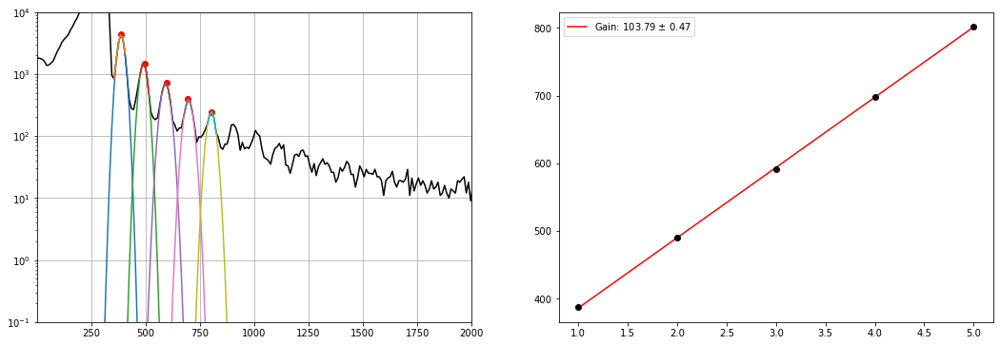

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_108.h5


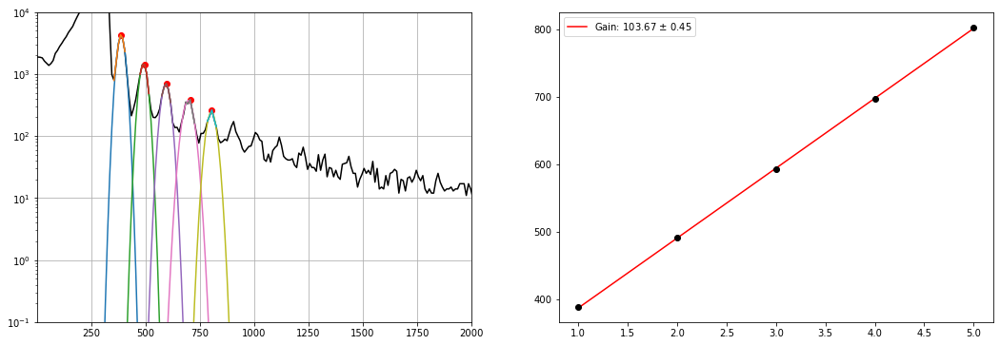

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_109.h5


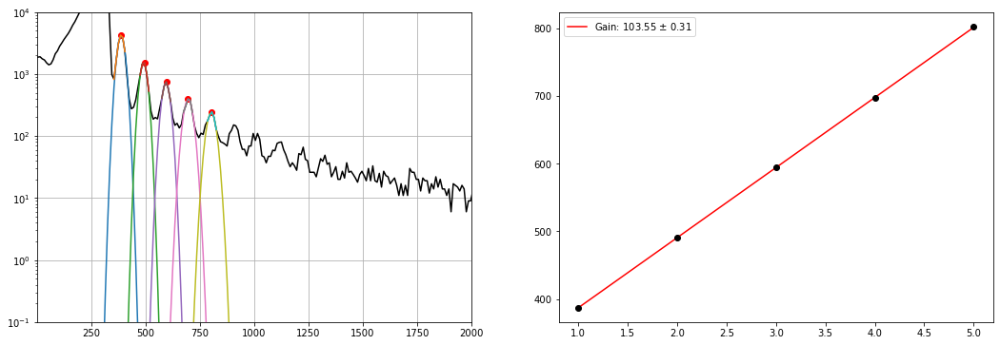

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_110.h5


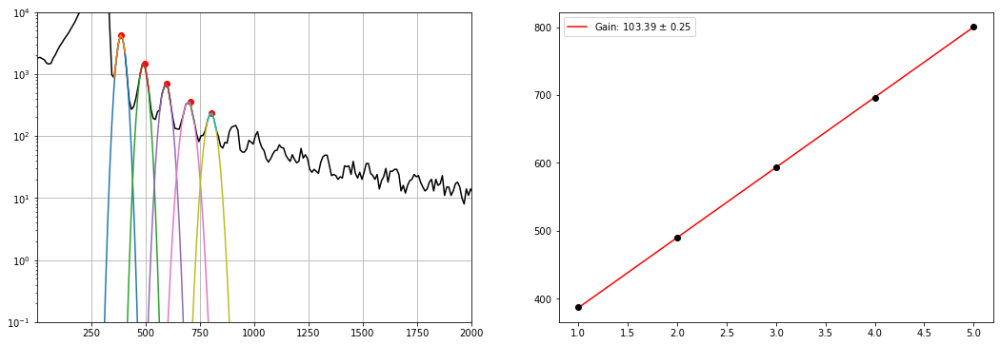

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_111.h5


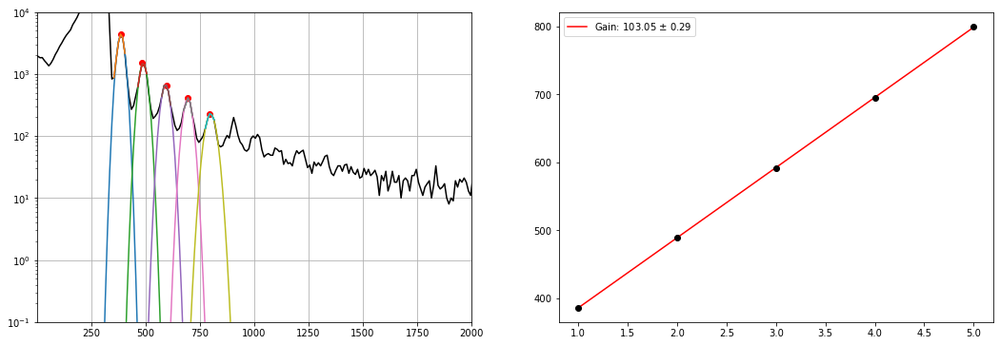

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_112.h5


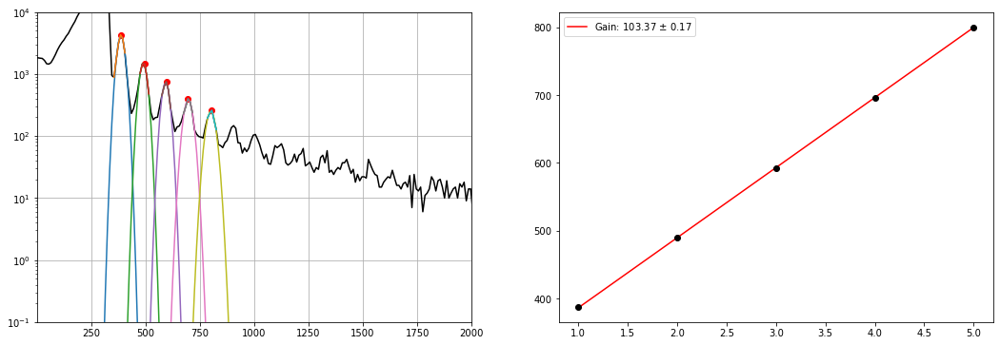

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_113.h5


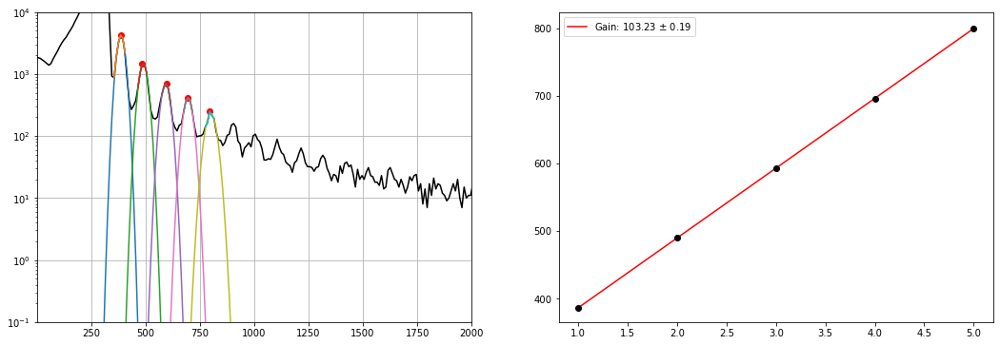

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_114.h5


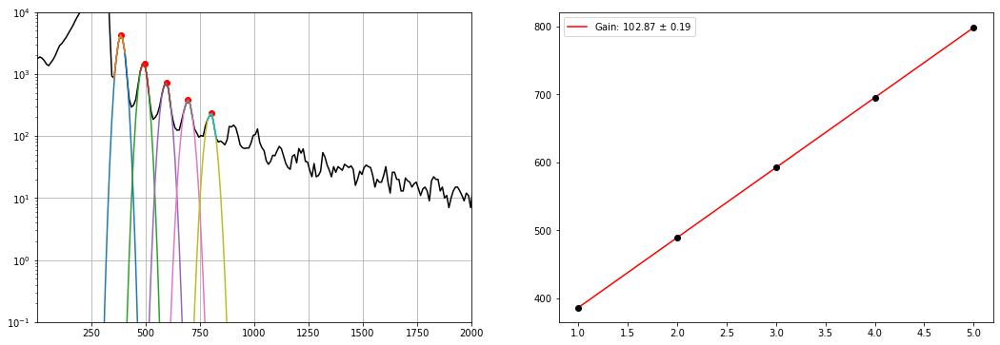

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_115.h5


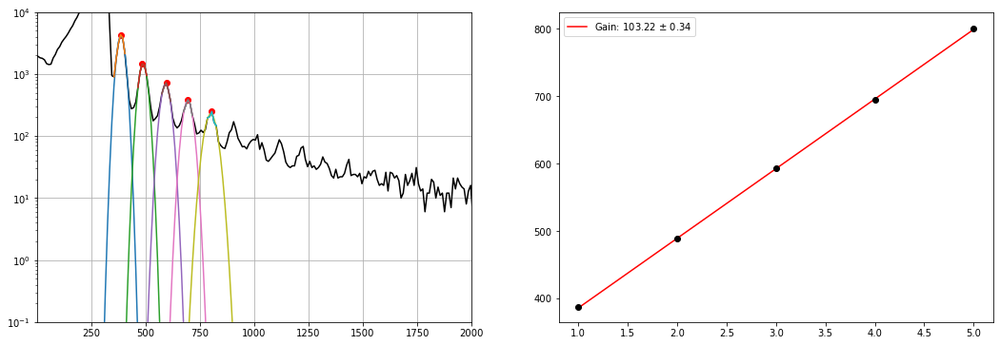

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_116.h5


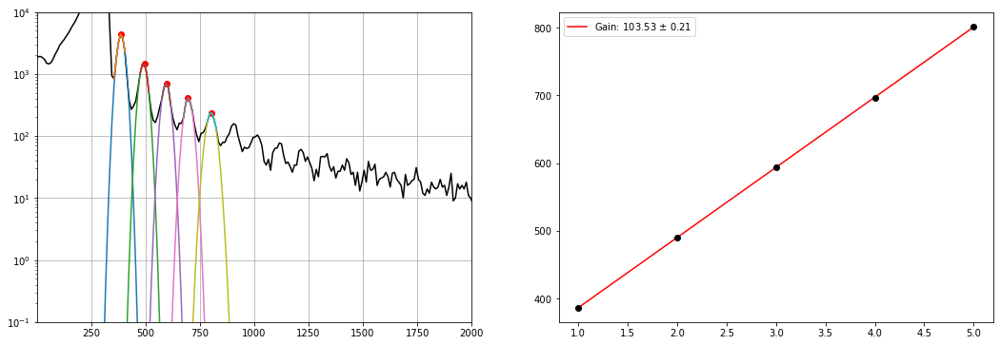

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_117.h5


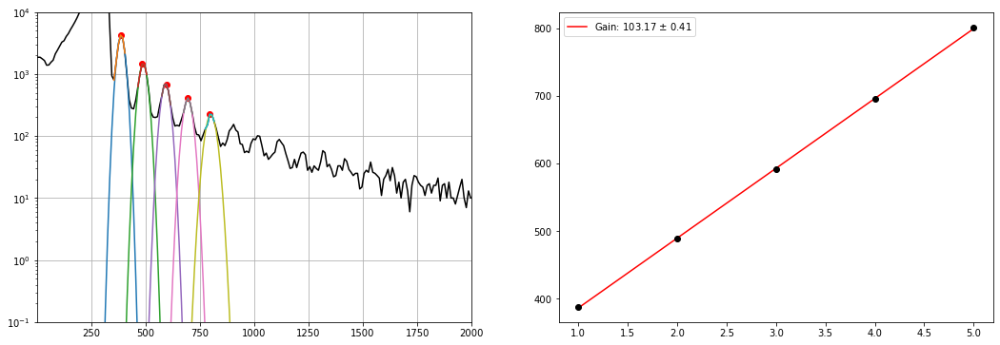

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_118.h5


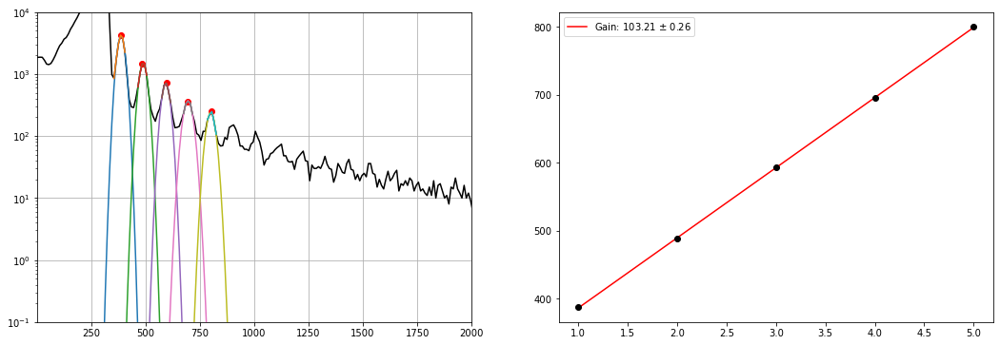

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_119.h5


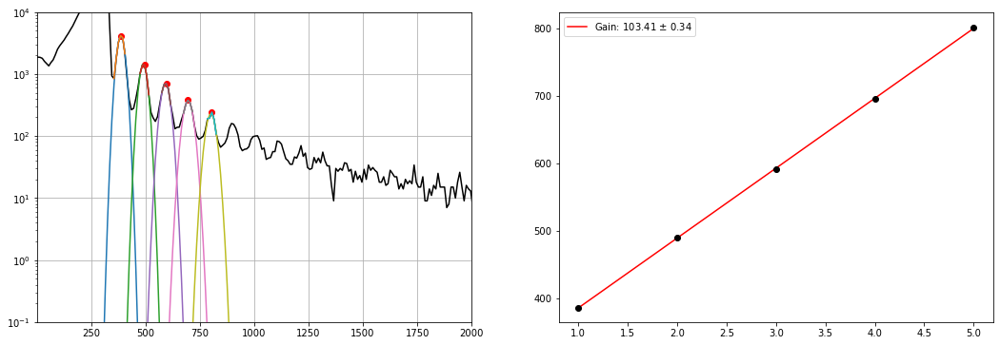

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_120.h5


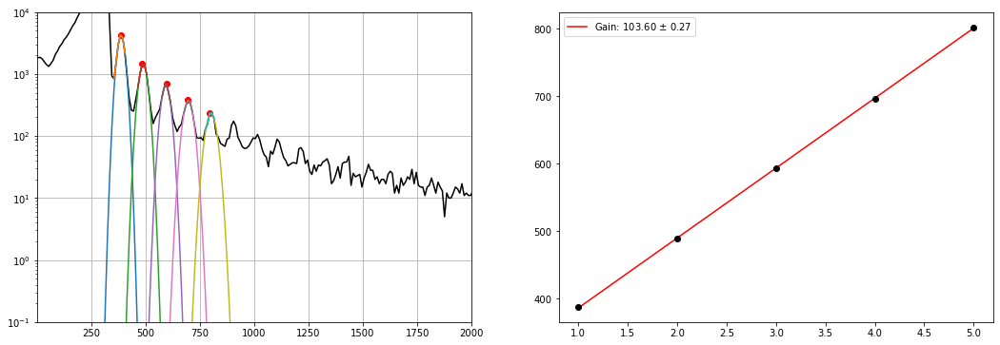

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_121.h5


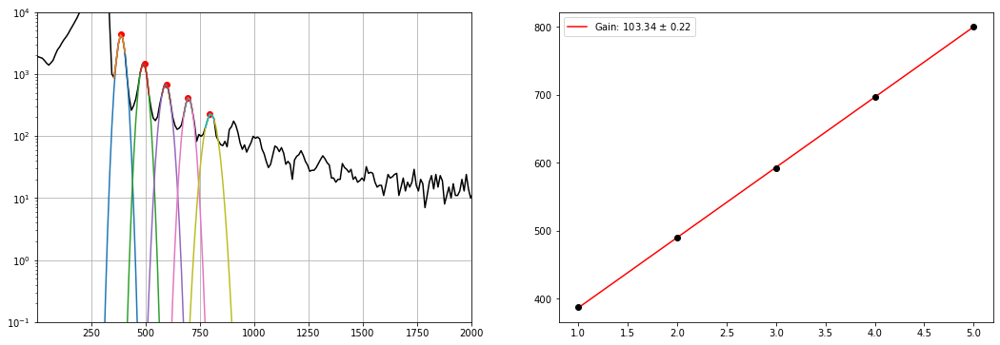

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_122.h5


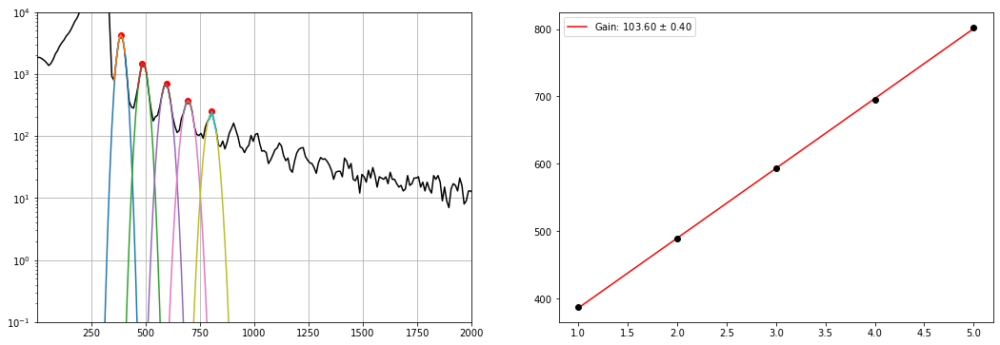

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_123.h5


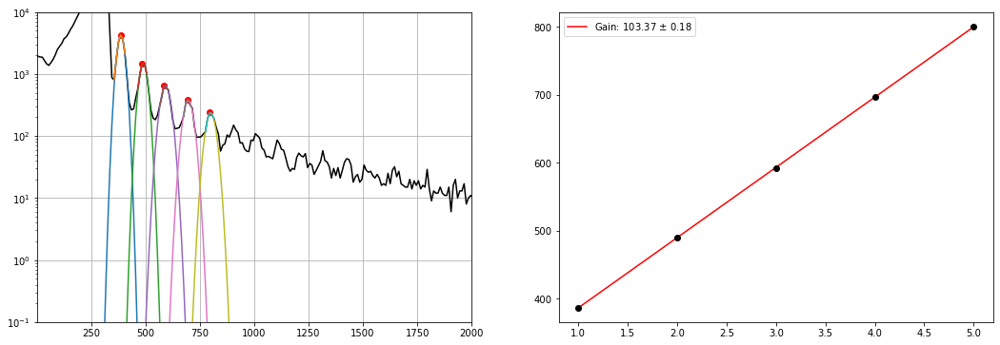

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_124.h5


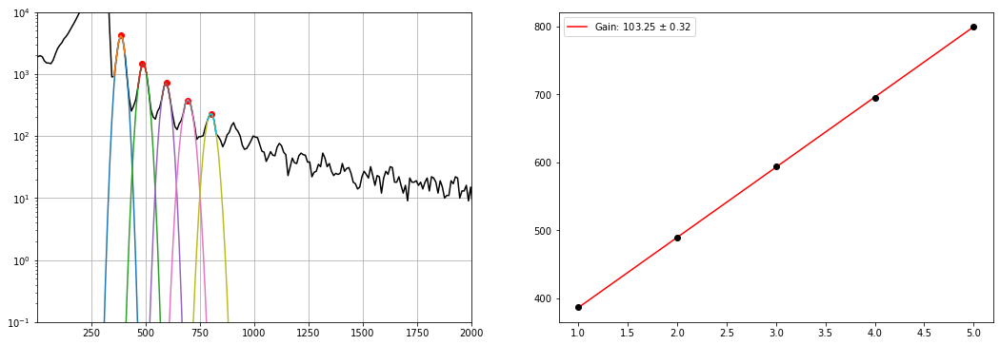

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_125.h5


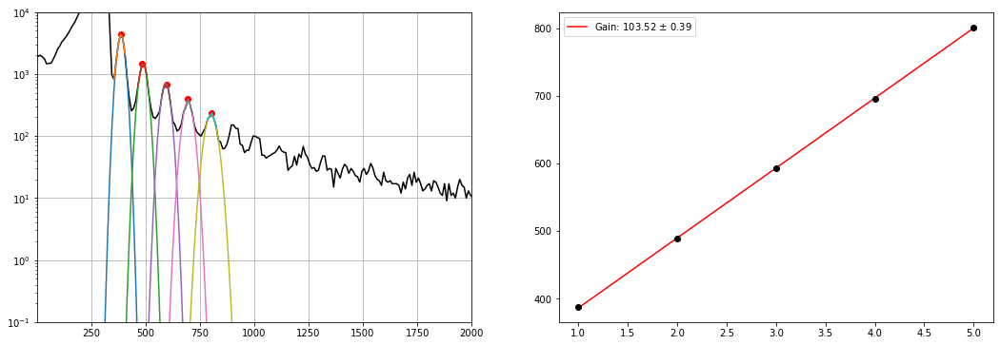

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_126.h5


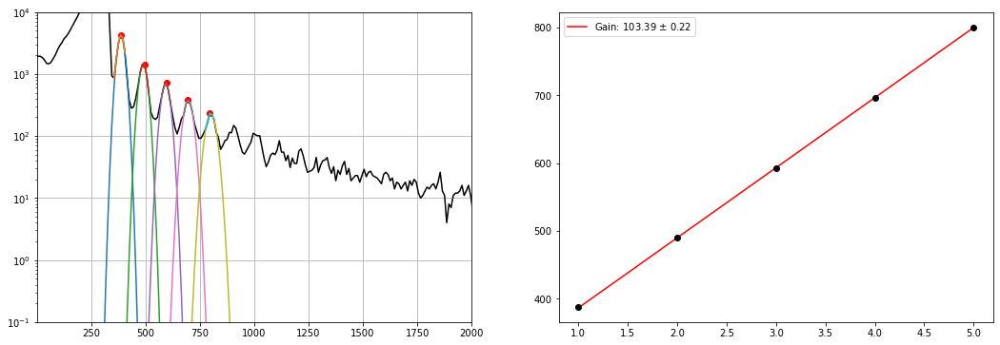

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_127.h5


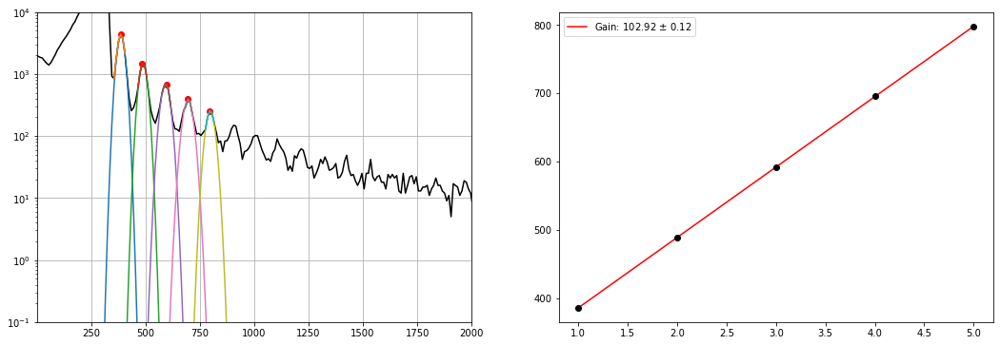

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_128.h5


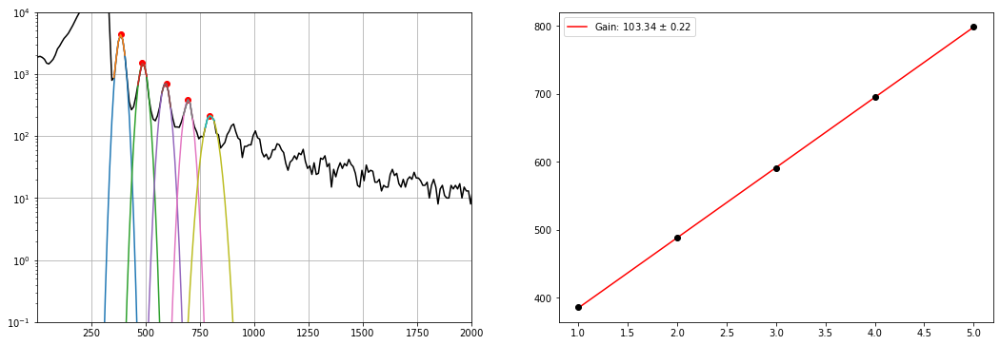

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_129.h5


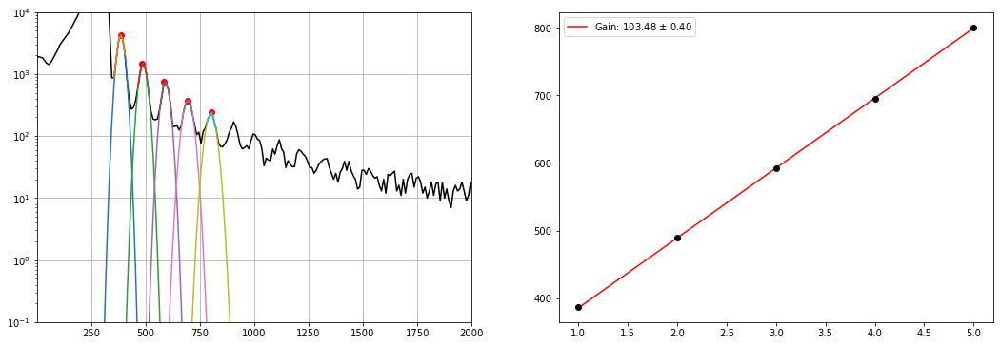

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_130.h5


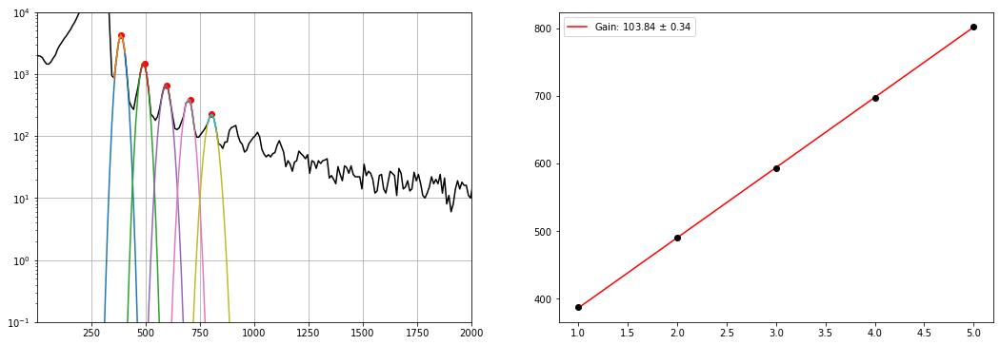

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_131.h5


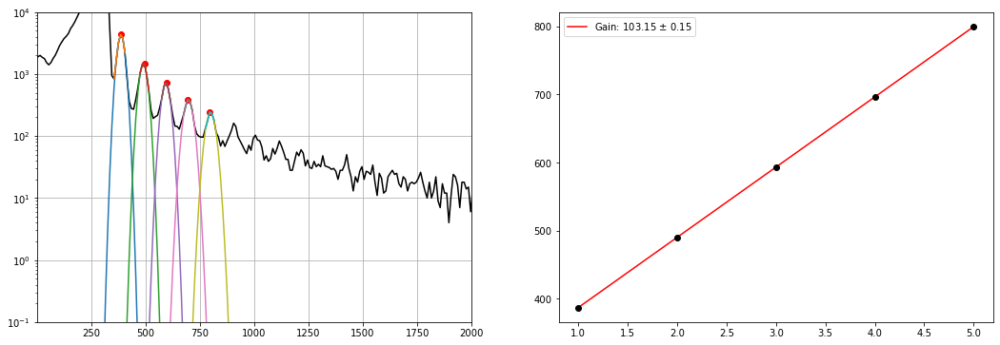

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_132.h5


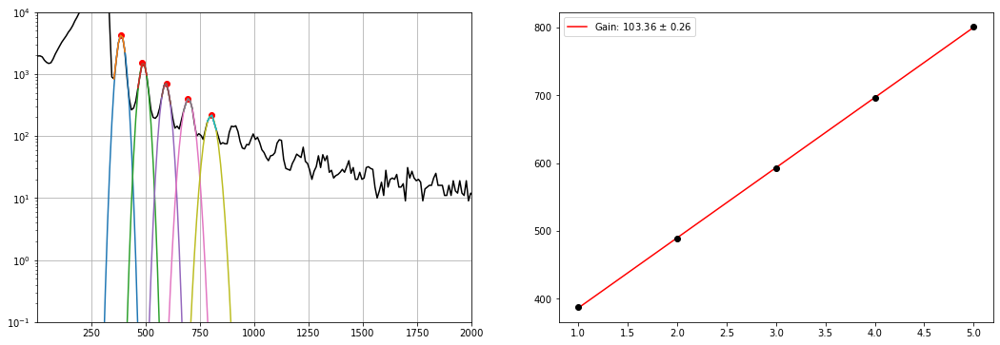

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_133.h5


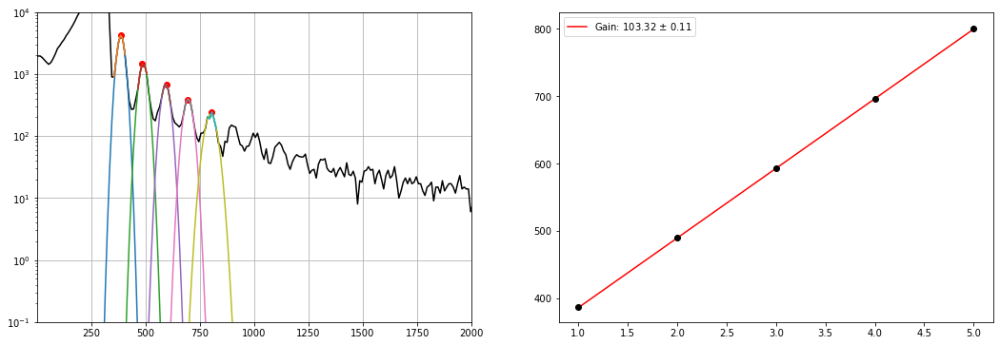

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_134.h5


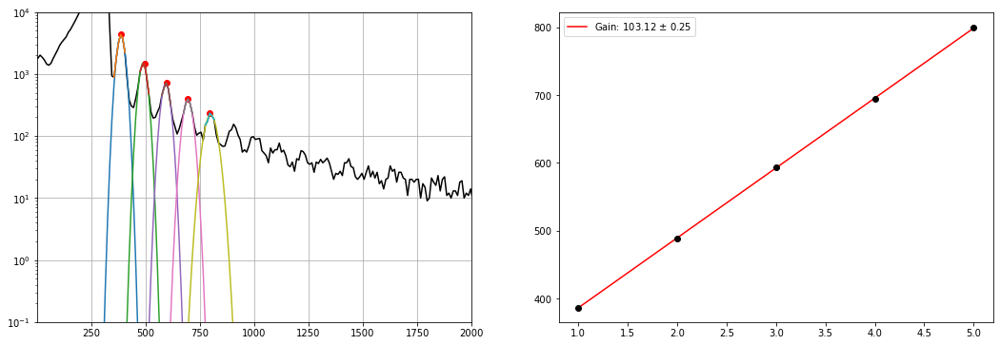

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_135.h5


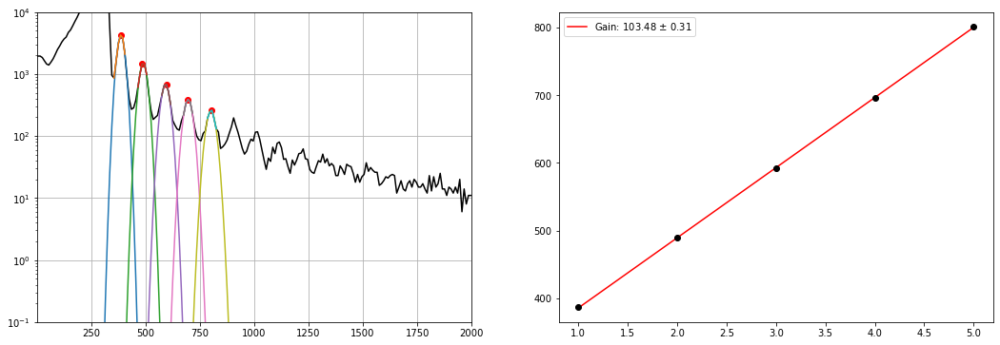

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_136.h5


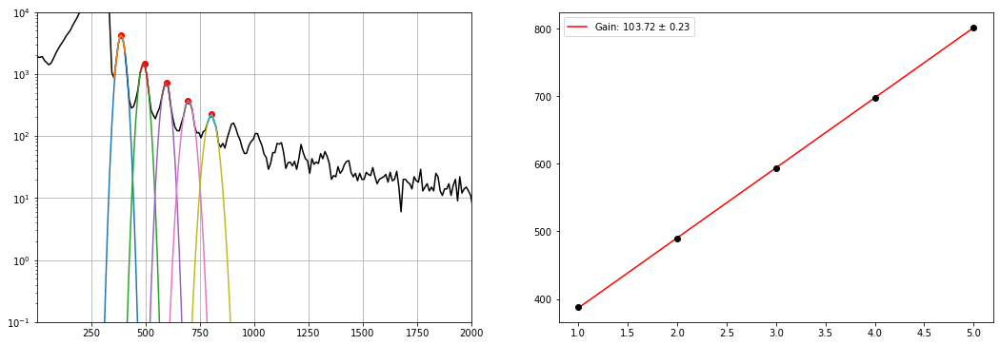

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_137.h5


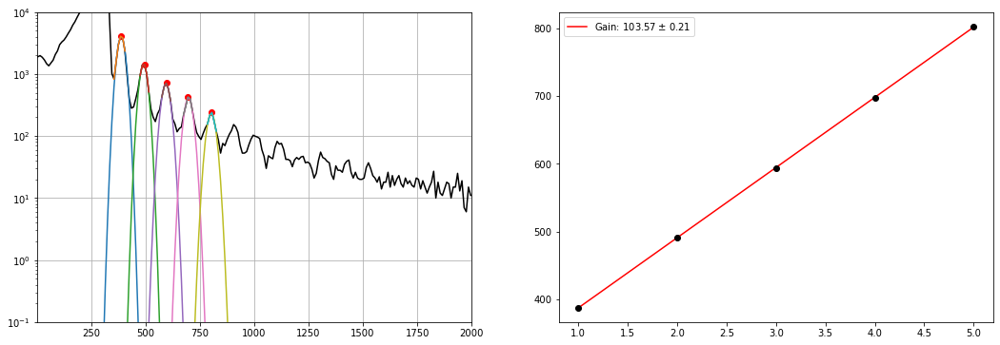

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_138.h5


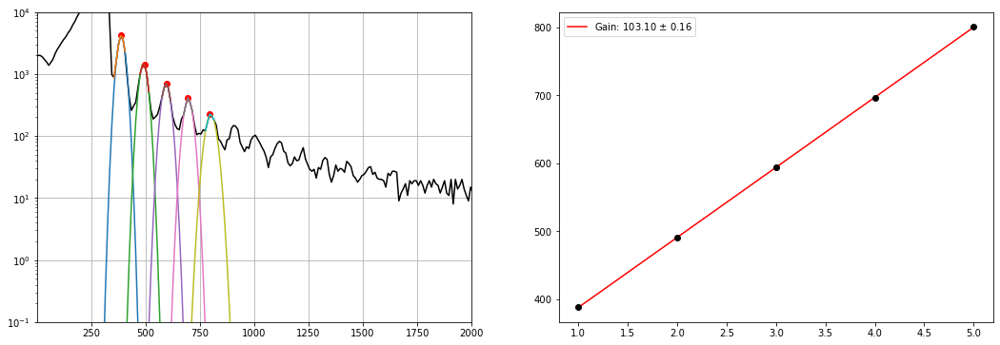

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_139.h5


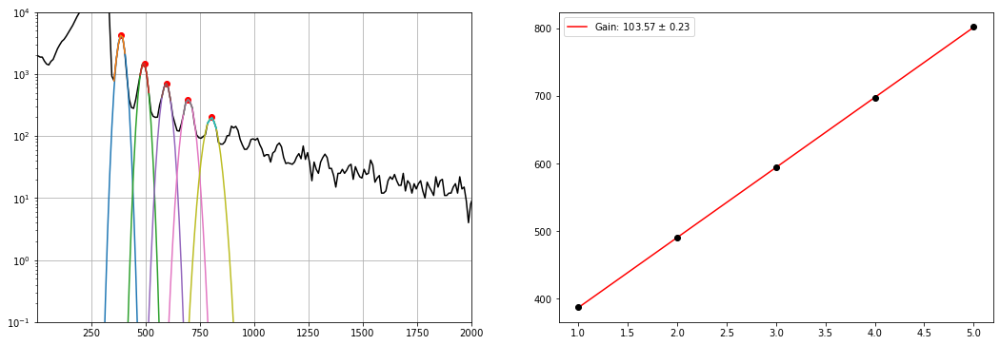

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_140.h5


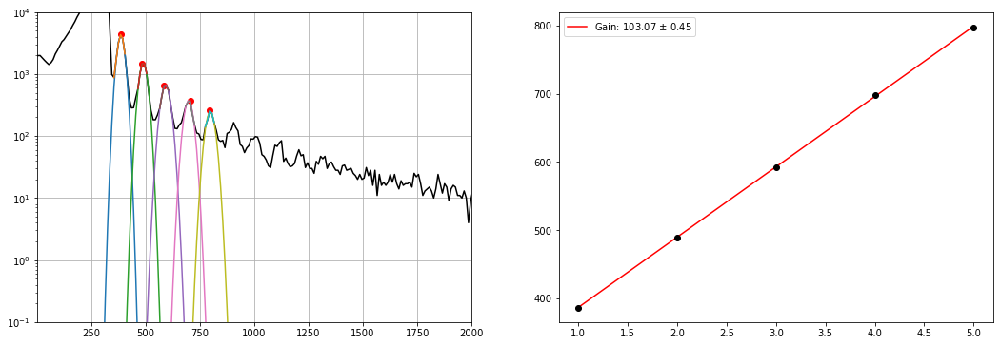

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_141.h5


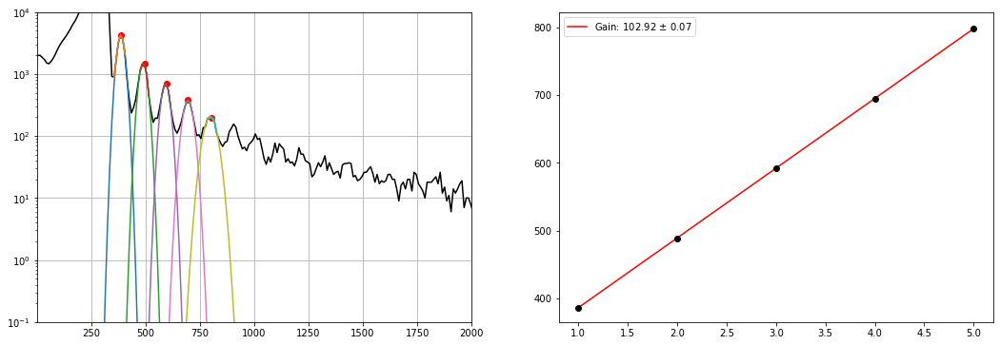

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_142.h5


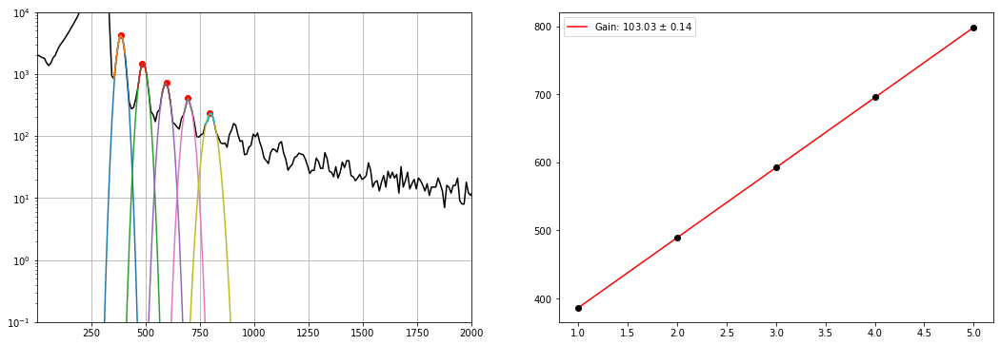

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_143.h5


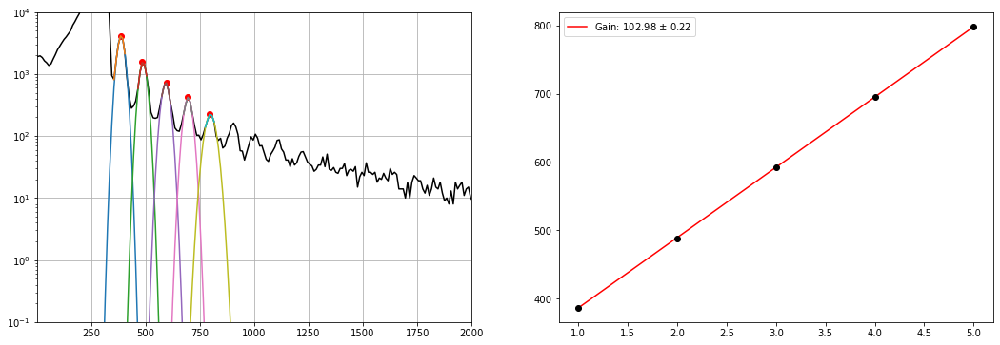

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_144.h5


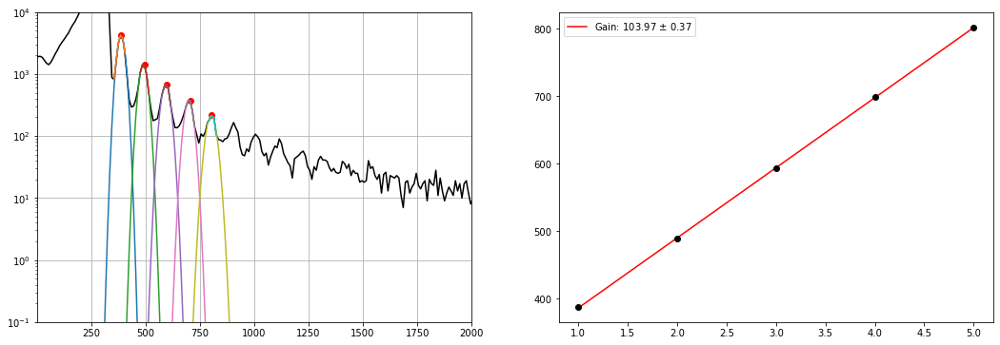

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_145.h5


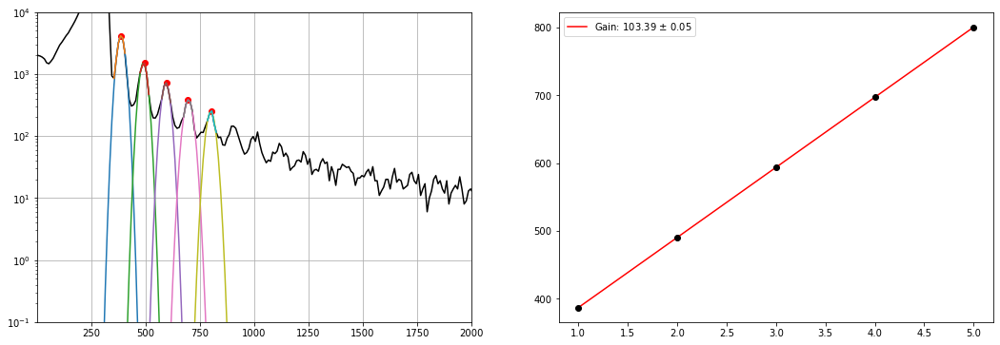

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_146.h5


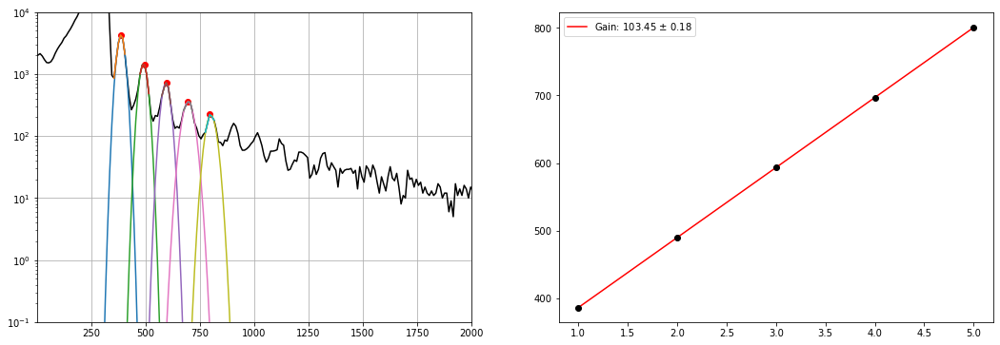

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_147.h5


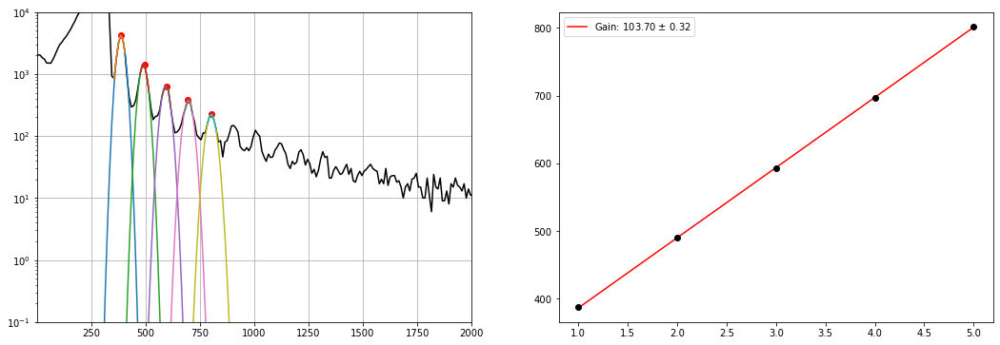

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_148.h5


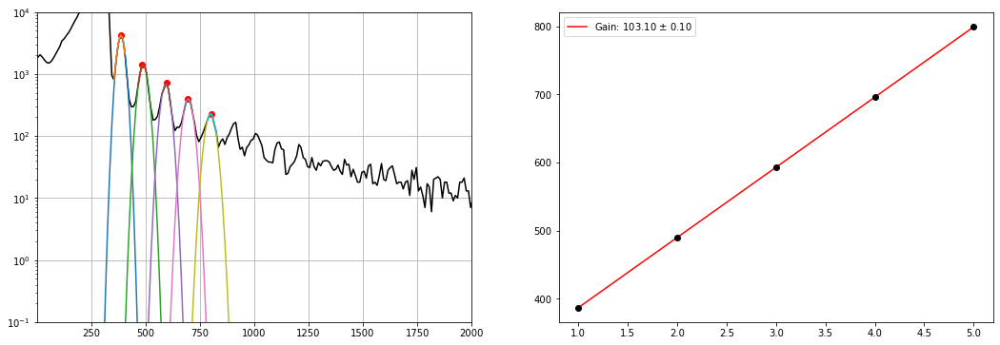

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_149.h5


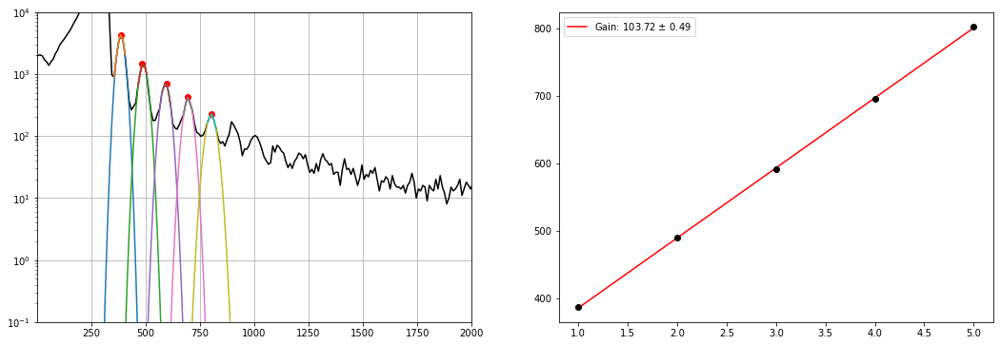

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_150.h5


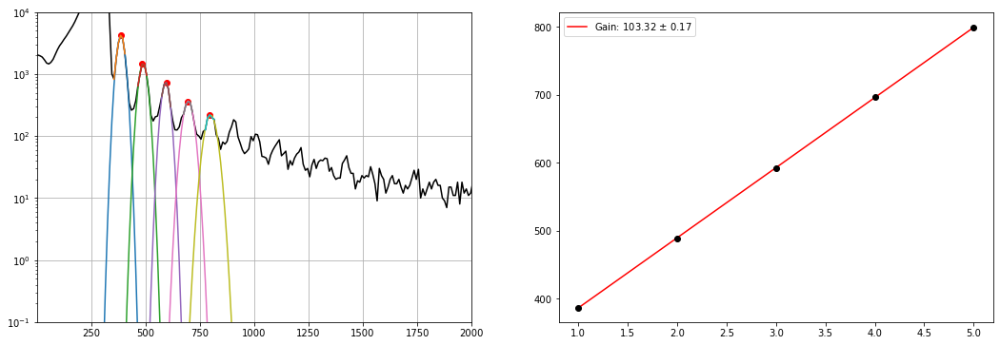

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_151.h5


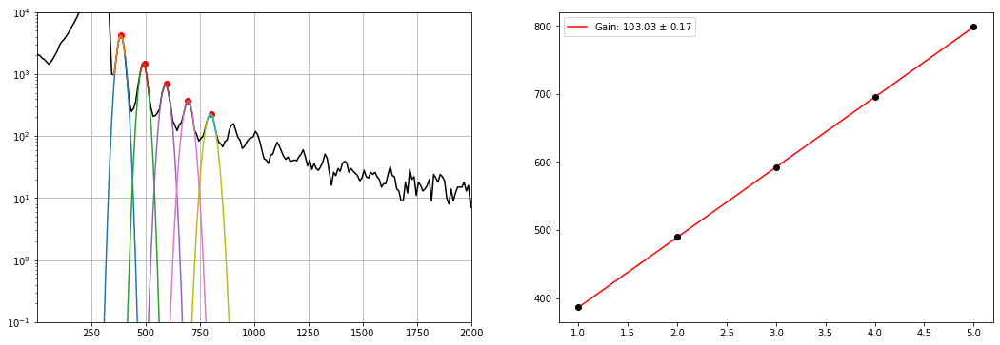

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_152.h5


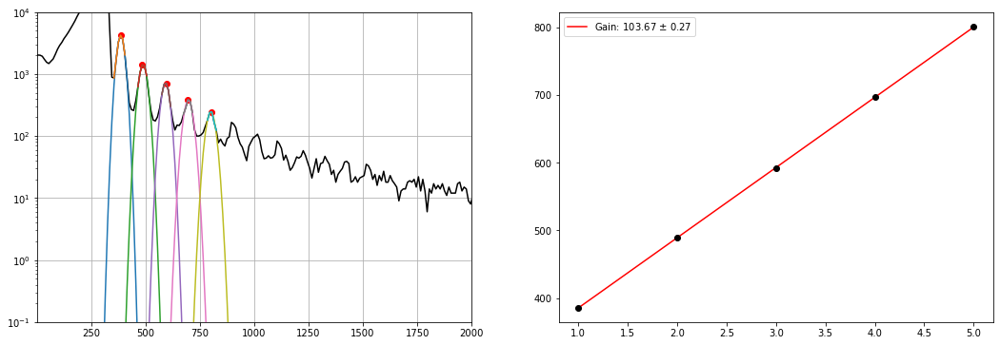

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_153.h5


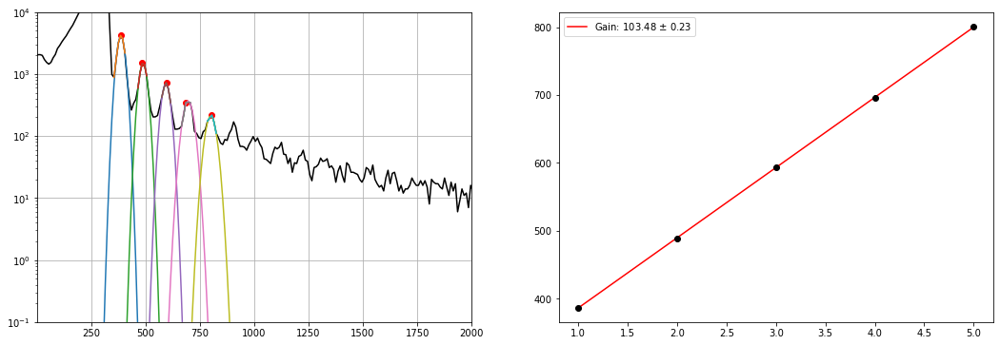

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_154.h5


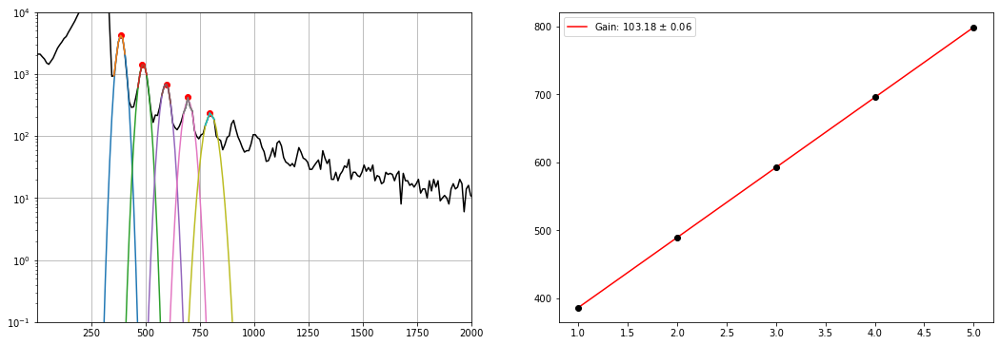

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_155.h5


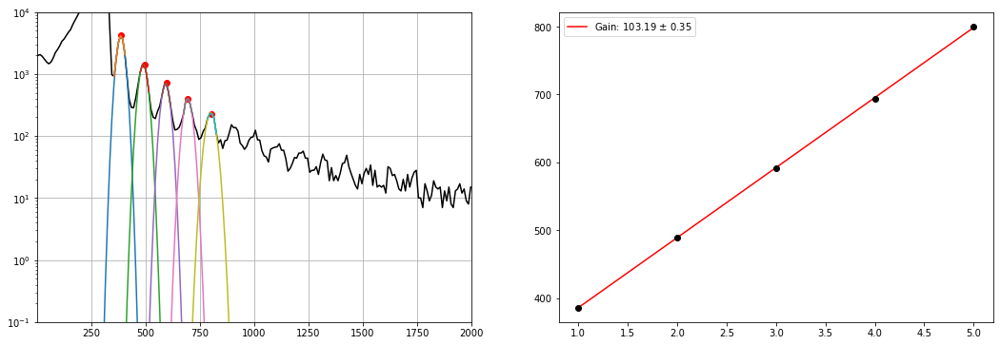

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step11/mca_keith_31.40OV_156.h5


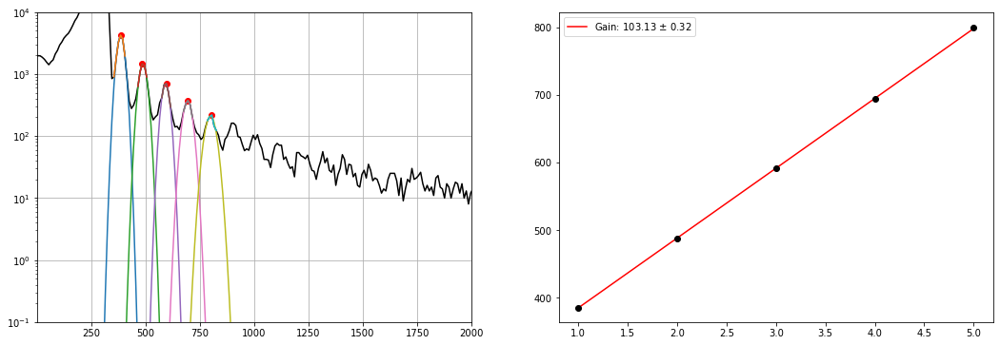

In [17]:
data_POS_FIELD1 = {'source':{'color': 'black'}}

get_data(data_POS_FIELD1, path_11, files_11, binsize=10, peak_dist=15)

-2.741421346966979


<Figure size 648x432 with 0 Axes>

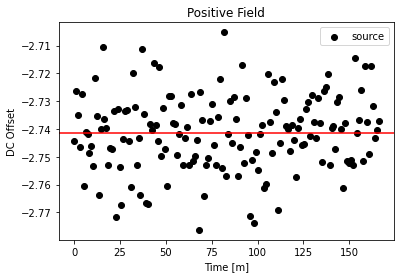

In [18]:
plot_offset(data_POS_FIELD1, 'Positive')

# Negative E Field

In [19]:
# getting the data that we need
path_13 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/'
files_13 = load_directory(path_13)
SRS_gain_13 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_13 = 275 # center of noise pedestal peak

Number of files found:  10
Number of files:  10


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_0.h5


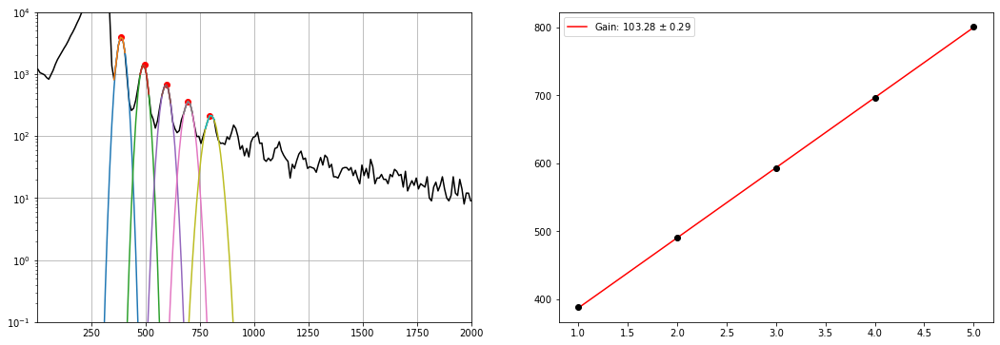

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_1.h5


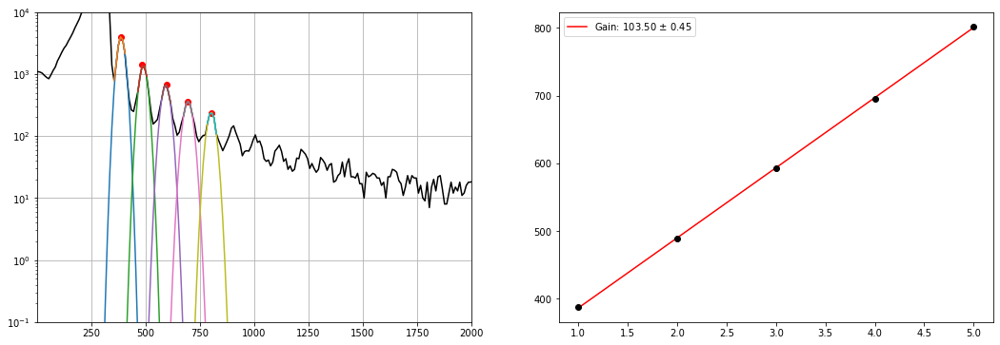

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_2.h5


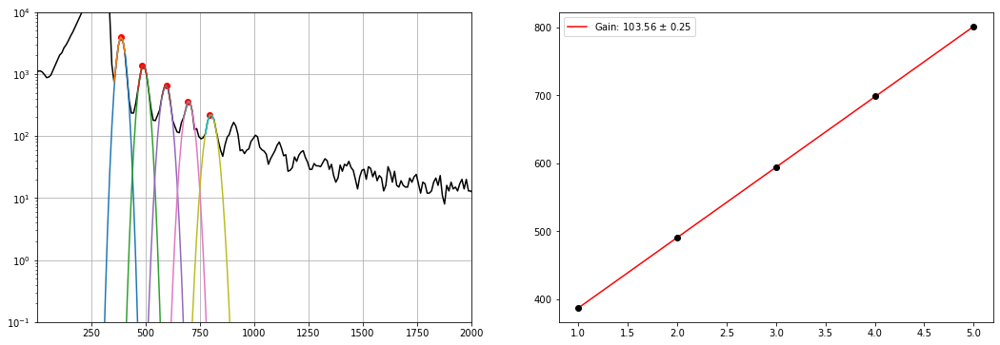

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_3.h5


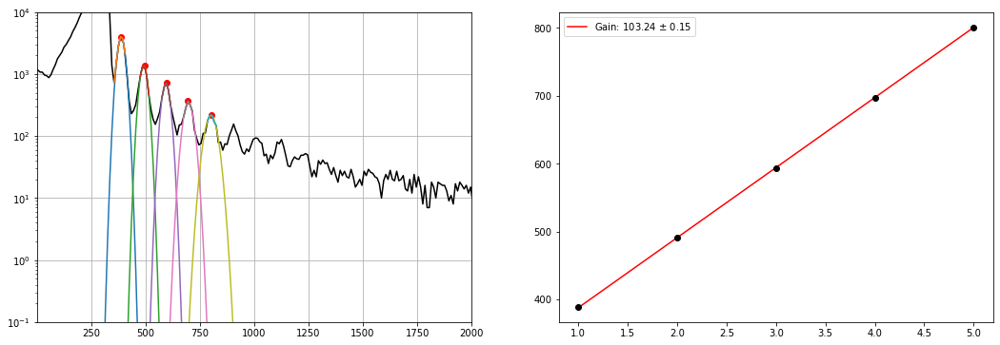

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_4.h5


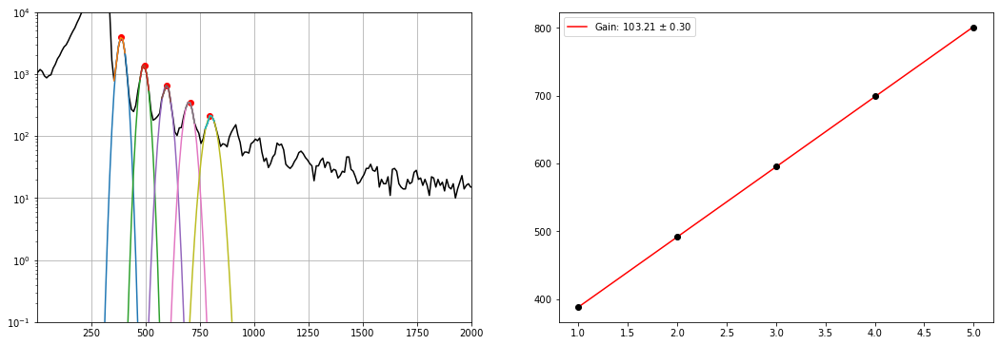

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_5.h5


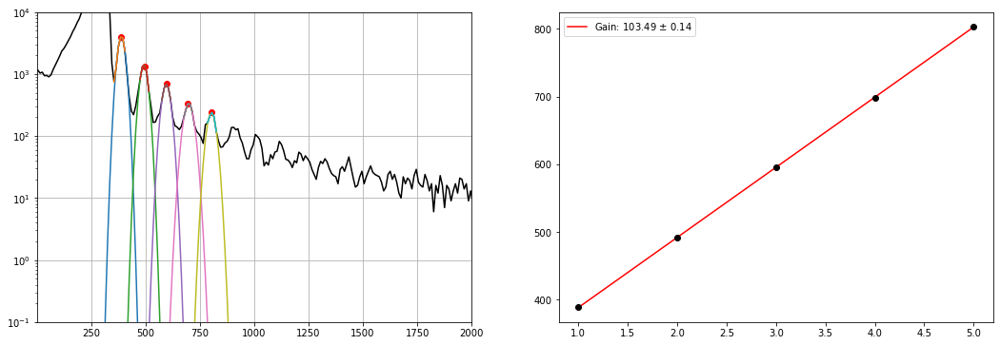

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_6.h5


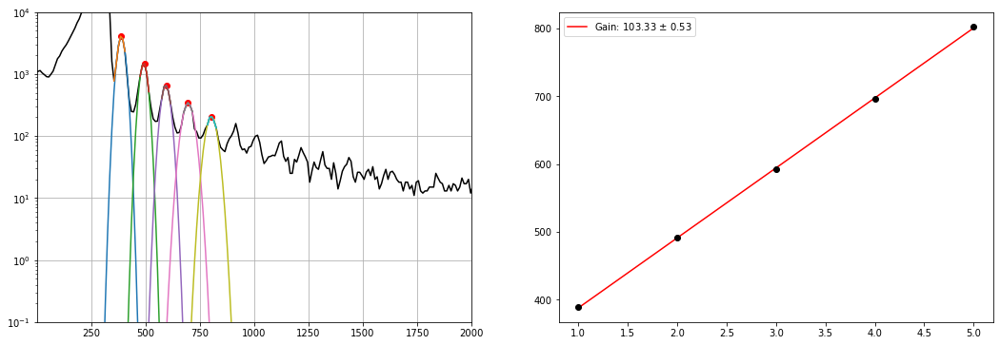

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_7.h5


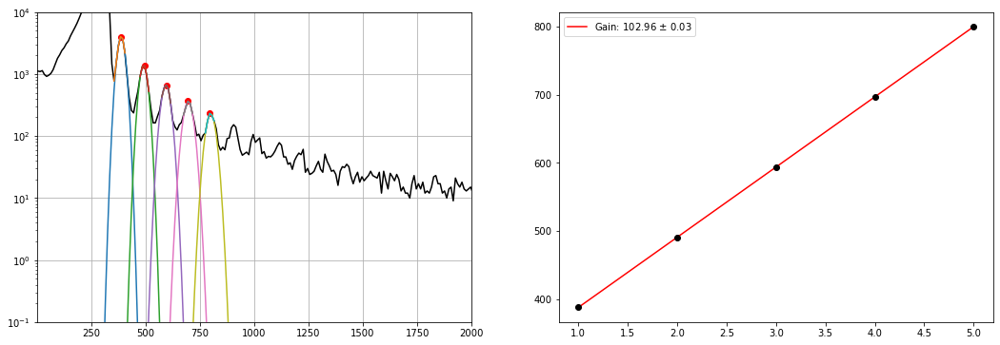

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_8.h5


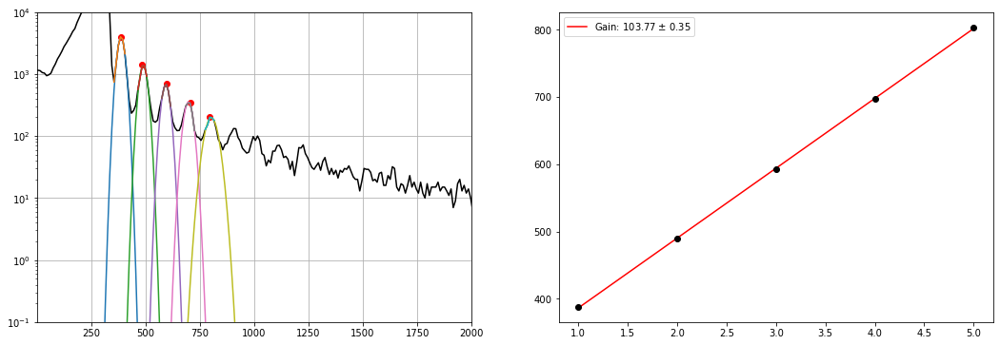

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step13/mca_keith_31.40OV_9.h5


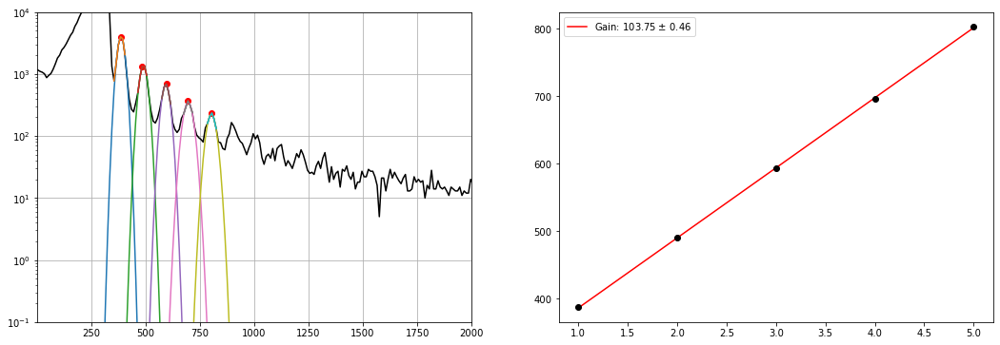

In [20]:
data_NEG_FIELD = {'source':{'color': 'black'}}

get_data(data_NEG_FIELD, path_13, files_13, binsize=10, peak_dist=15)

-2.7460448104636157


<Figure size 648x432 with 0 Axes>

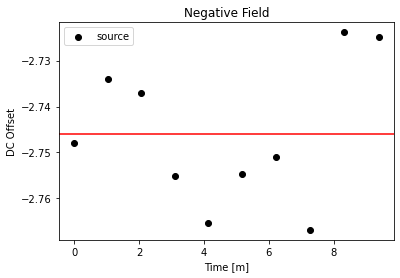

In [21]:
plot_offset(data_NEG_FIELD, 'Negative')

# Positive E Field #2

In [22]:
# getting the data that we need
path_14 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/'
files_14 = load_directory(path_14)
SRS_gain_14 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_14 = 100 # center of noise pedestal peak

Number of files found:  22
Number of files:  22


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_0.h5


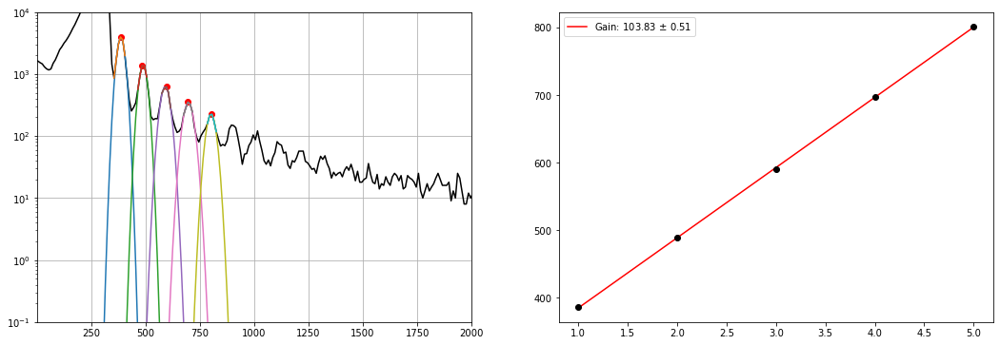

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_1.h5


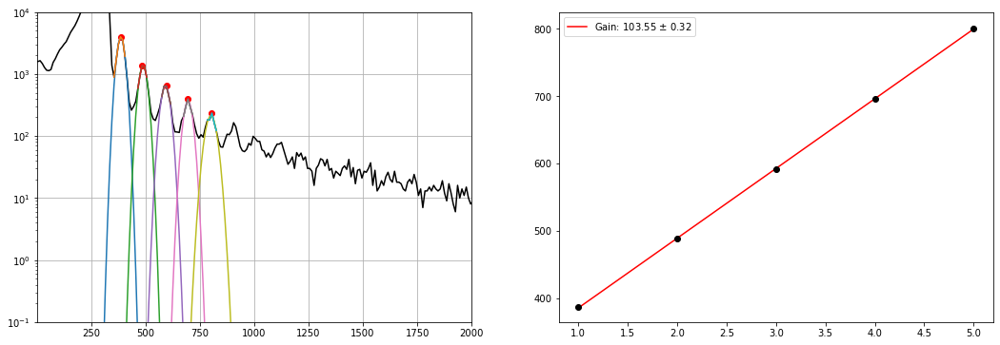

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_2.h5


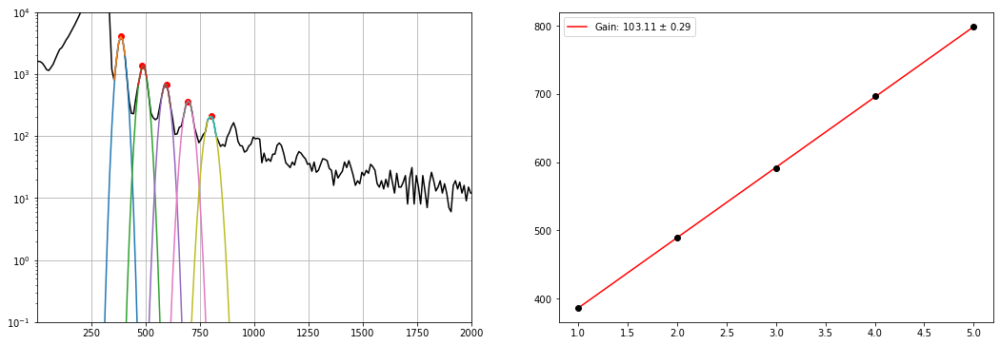

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_3.h5


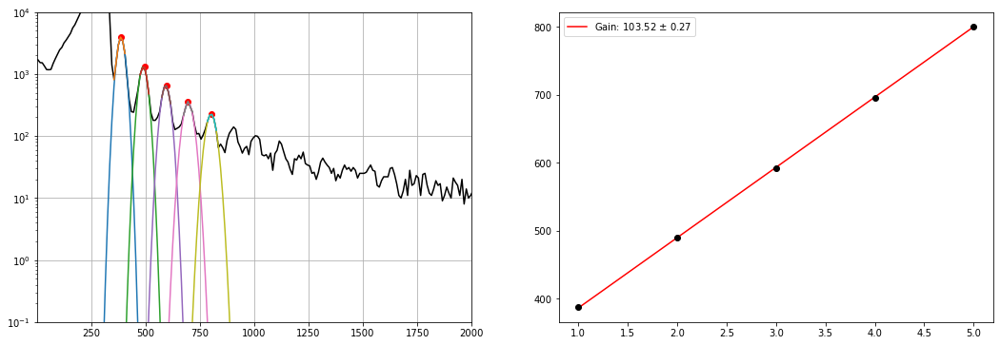

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_4.h5


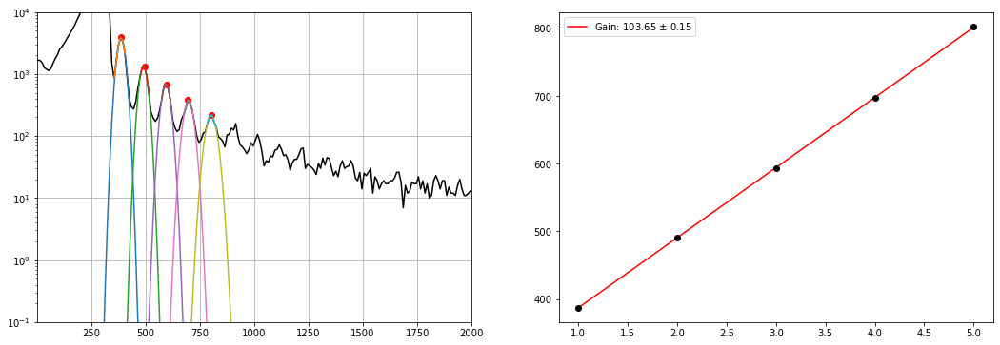

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_5.h5


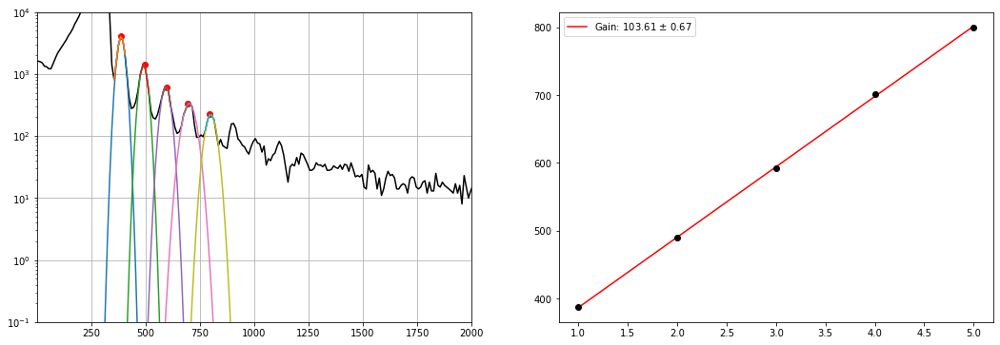

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_6.h5


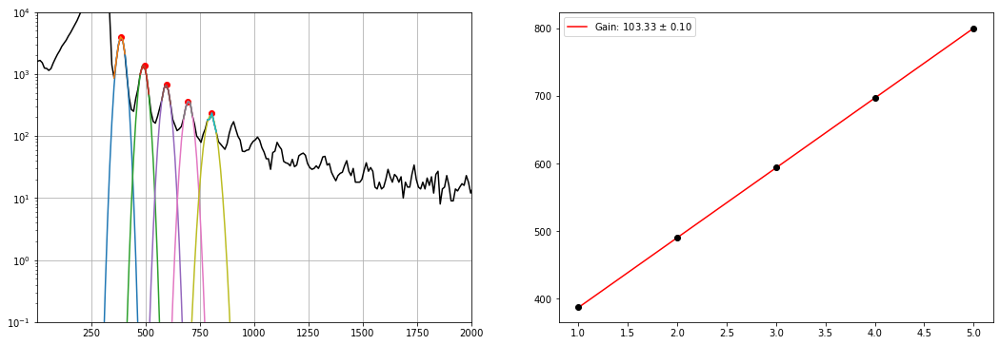

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_7.h5


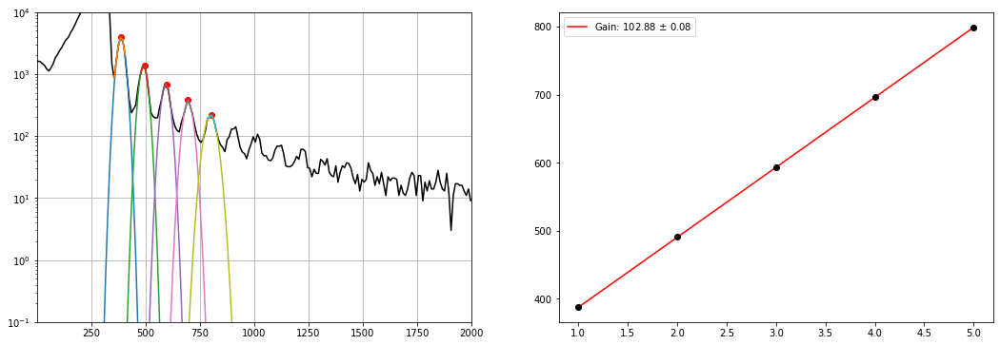

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_8.h5


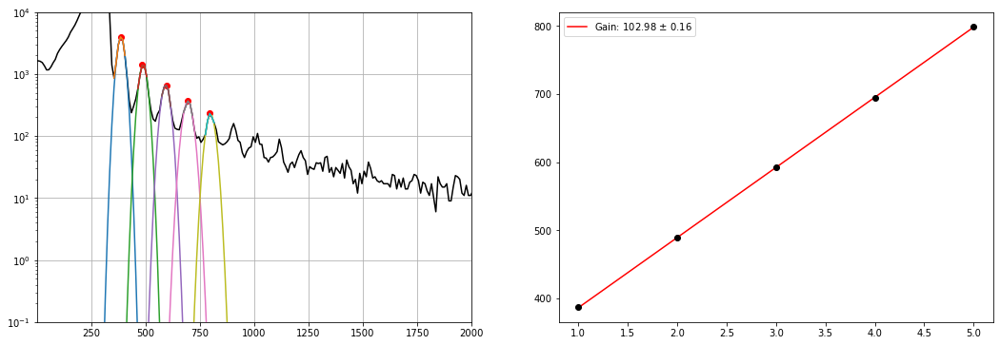

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_9.h5


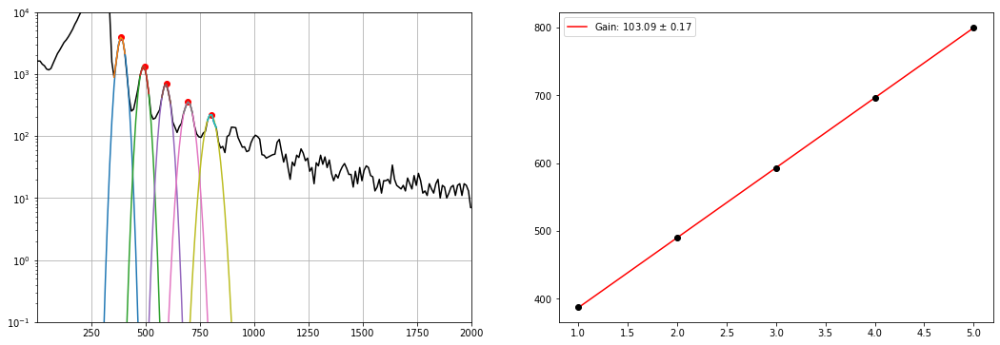

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_10.h5


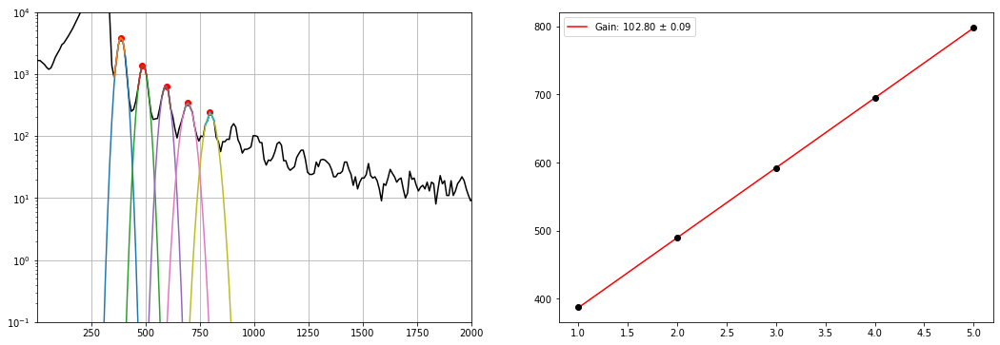

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_11.h5


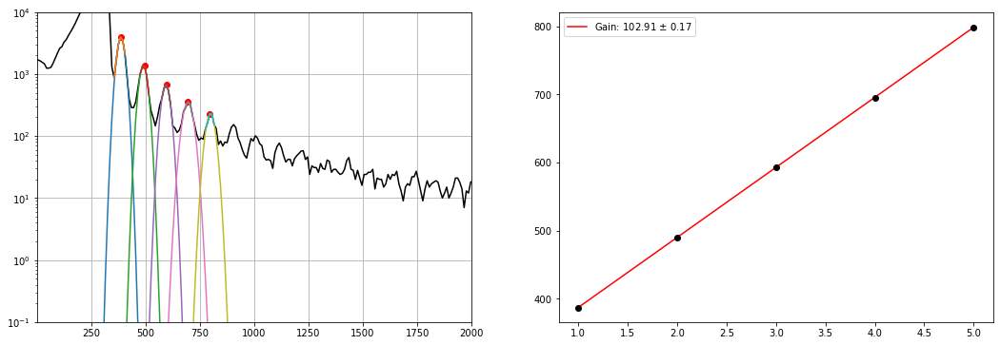

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_12.h5


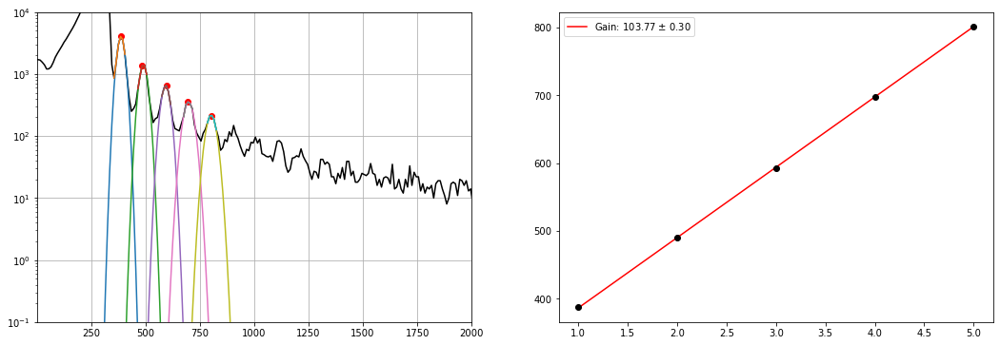

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_13.h5


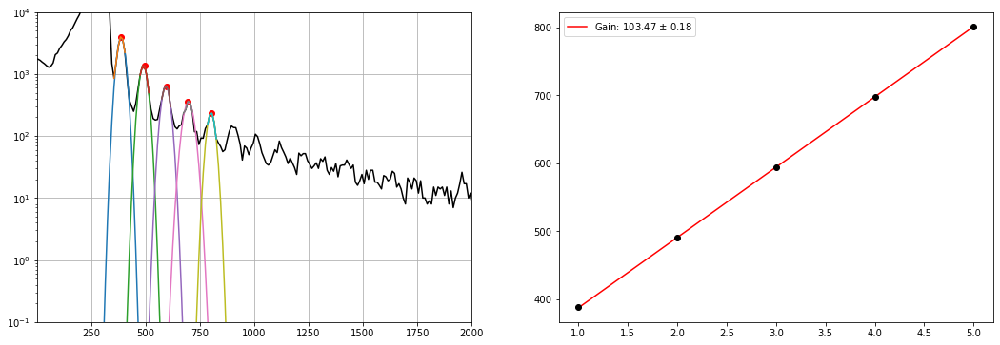

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_14.h5


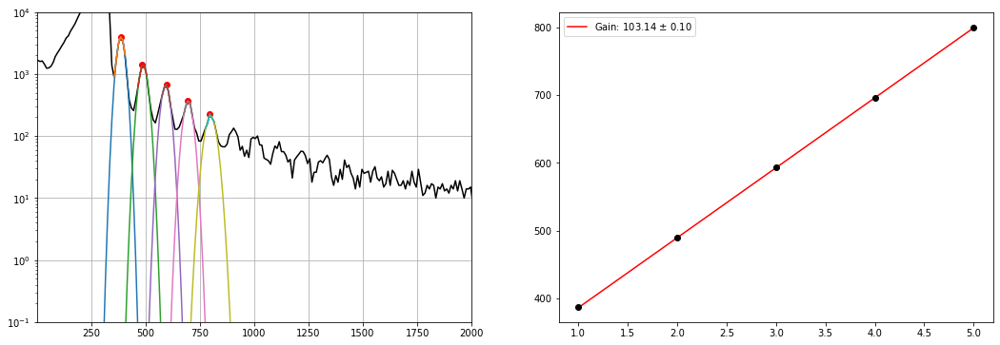

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_15.h5


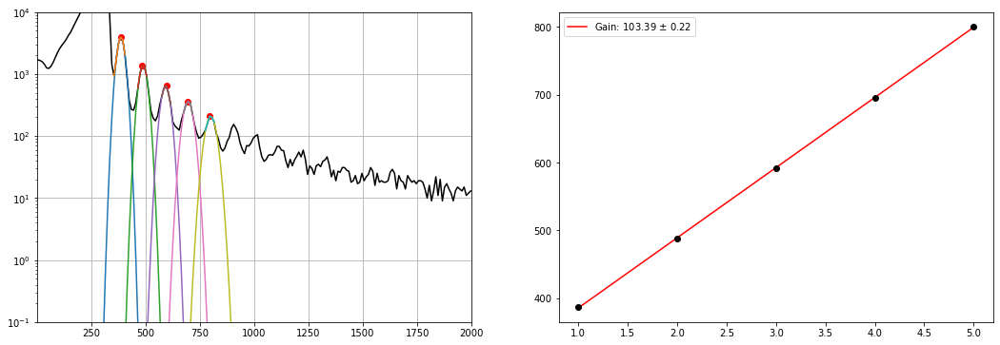

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_16.h5


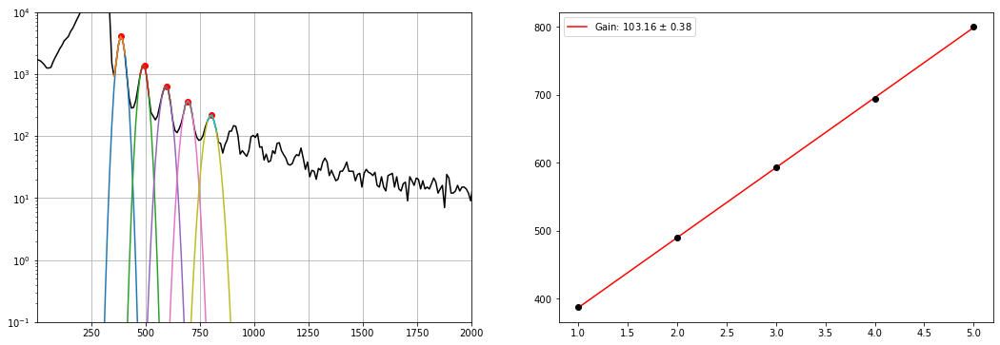

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_17.h5


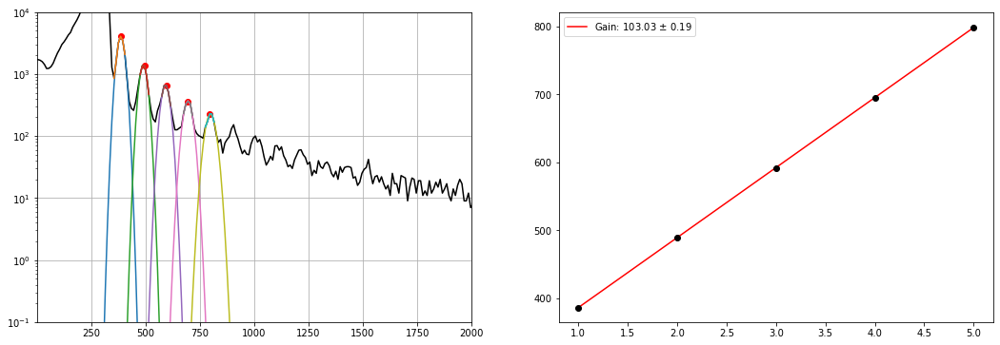

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_18.h5


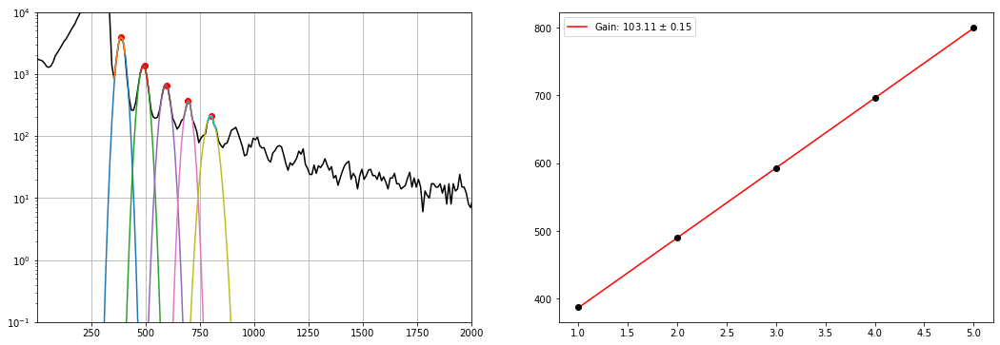

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_19.h5


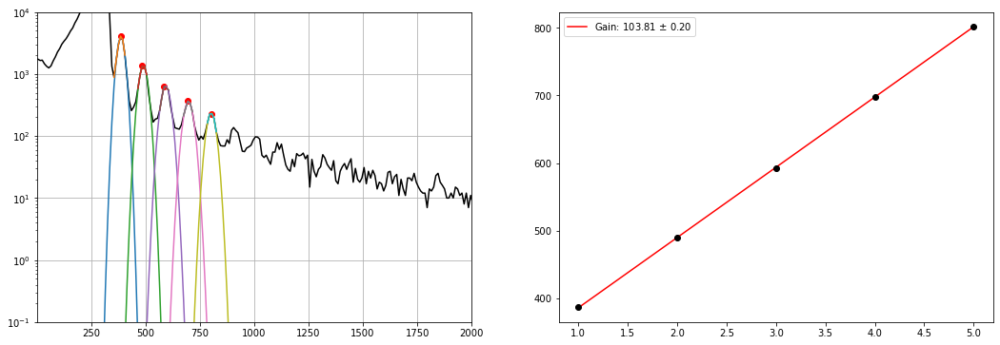

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_20.h5


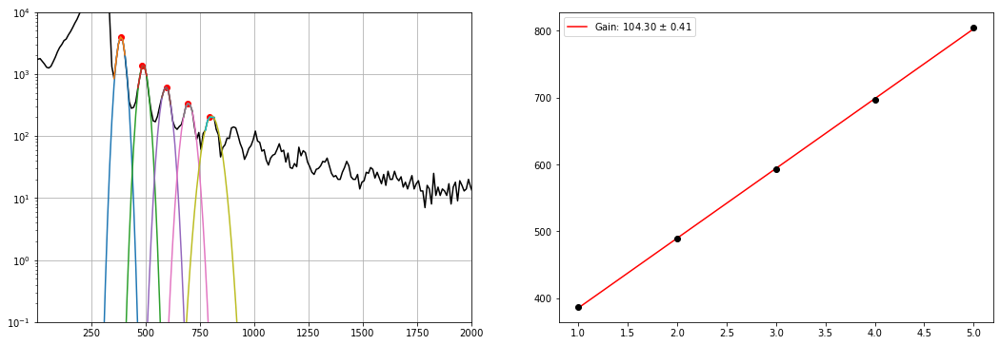

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step14/mca_keith_31.40OV_21.h5


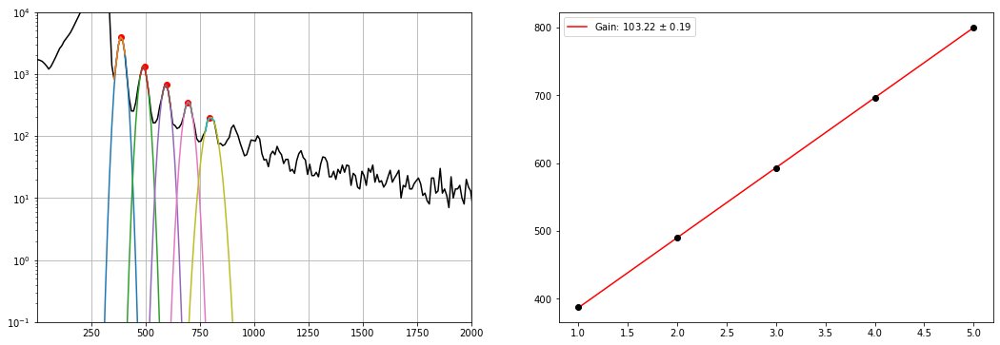

In [23]:
data_POS_FIELD2 = {'source':{'color': 'black'}}

get_data(data_POS_FIELD2, path_14, files_14, binsize=10, peak_dist=15)

-2.7397539955932784


<Figure size 648x432 with 0 Axes>

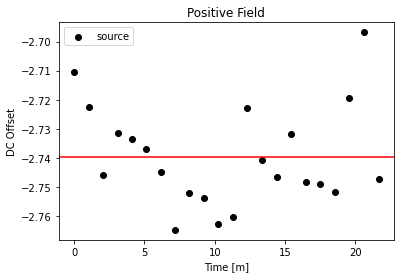

In [24]:
plot_offset(data_POS_FIELD2, 'Positive')

In [25]:
# getting the data that we need
path_15 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/'
files_15 = load_directory(path_15)
SRS_gain_15 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_15 = 100 # center of noise pedestal peak

Number of files found:  30
Number of files:  30


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_0.h5


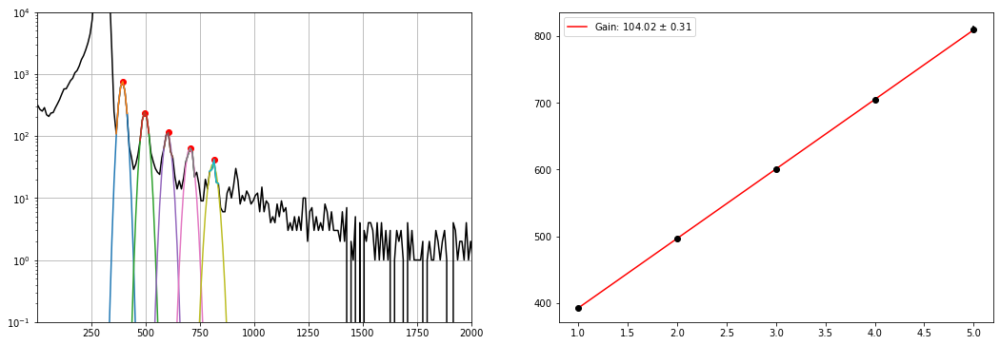

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_1.h5


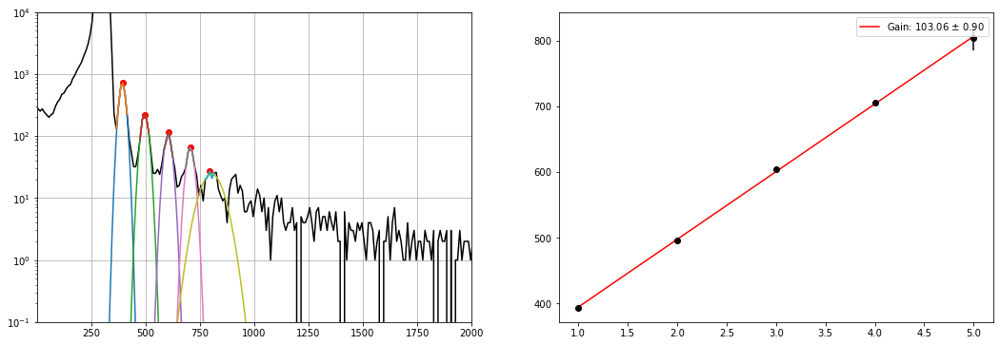

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_2.h5


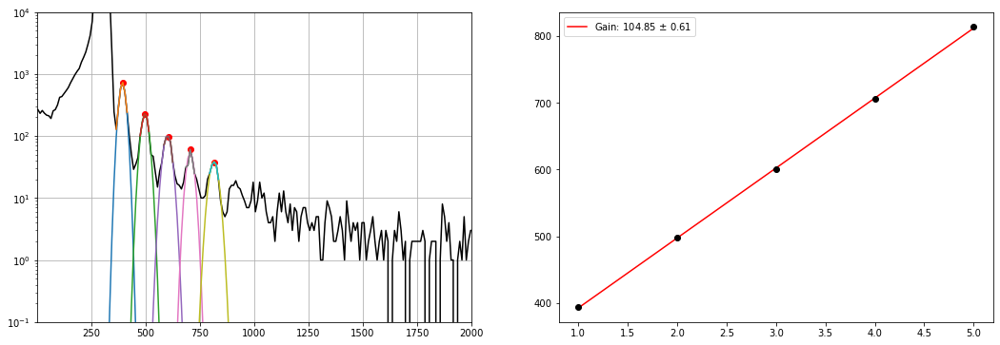

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_3.h5


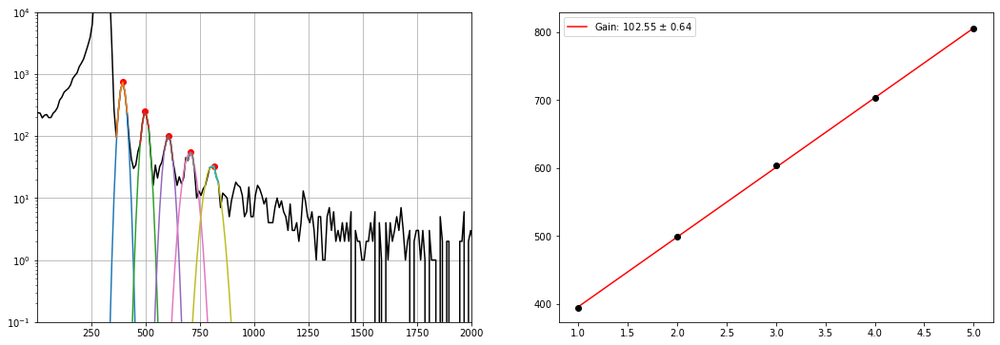

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_4.h5


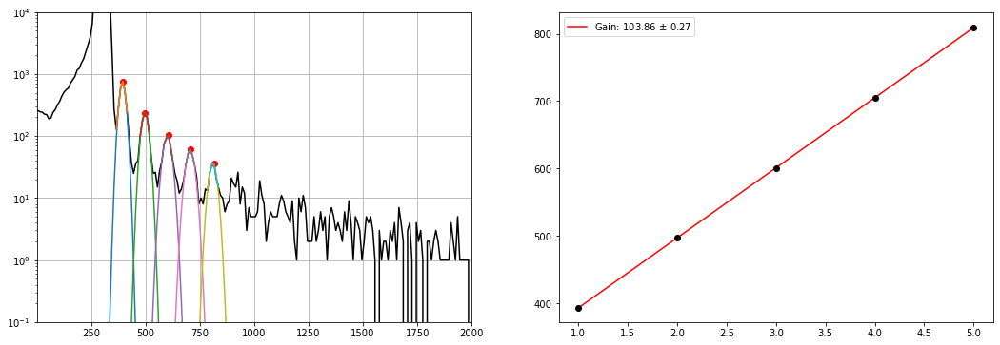

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_5.h5


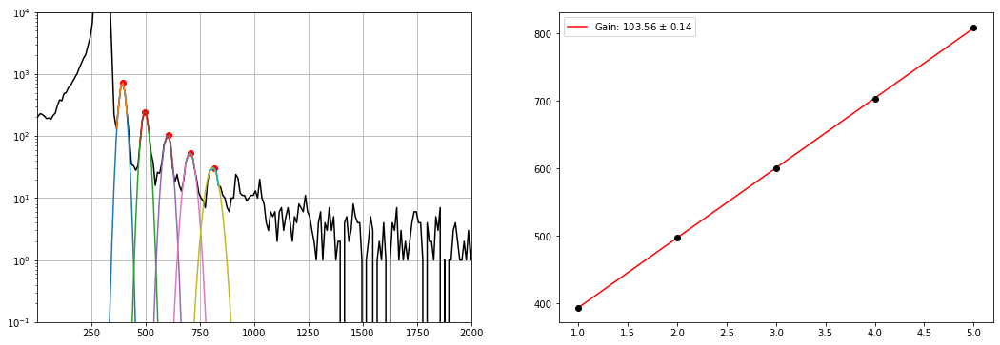

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_6.h5


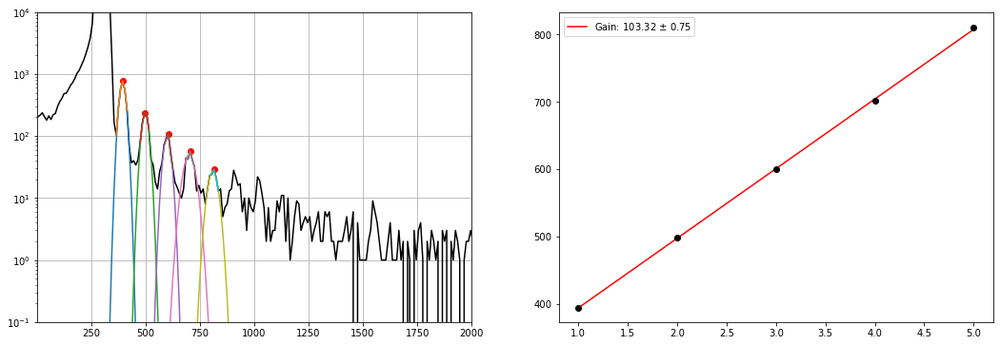

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_7.h5


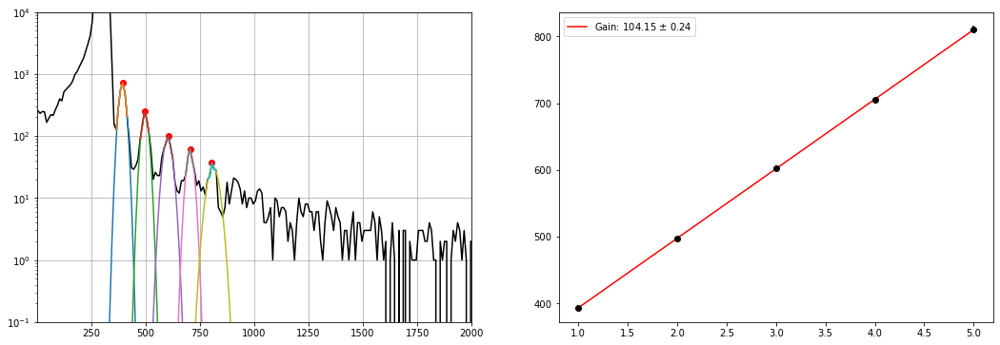

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_8.h5


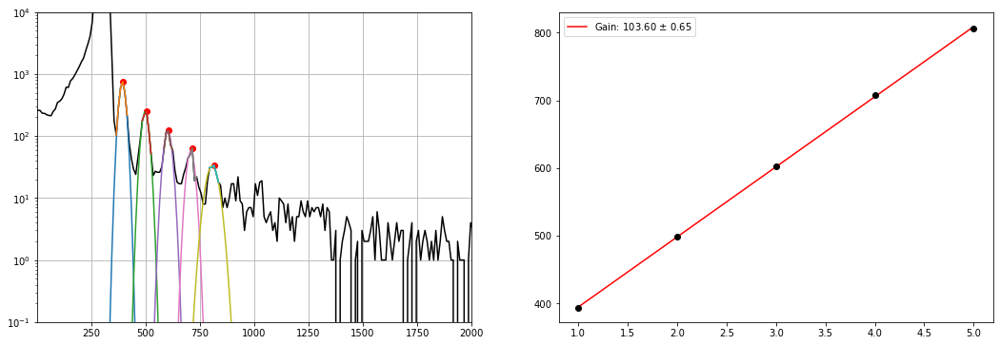

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_9.h5


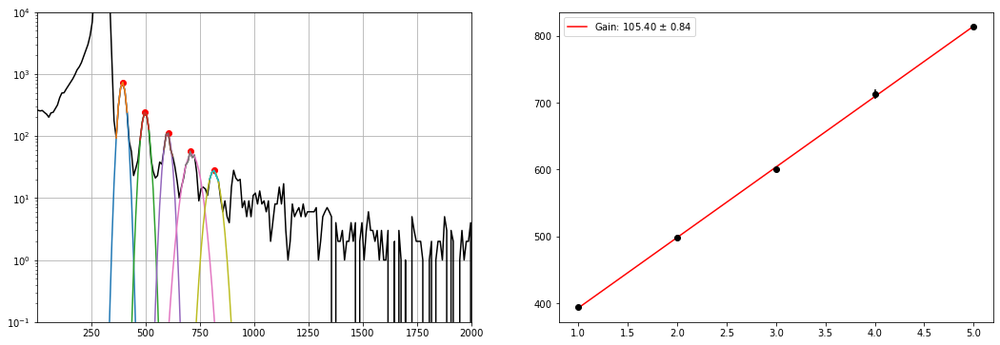

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_10.h5


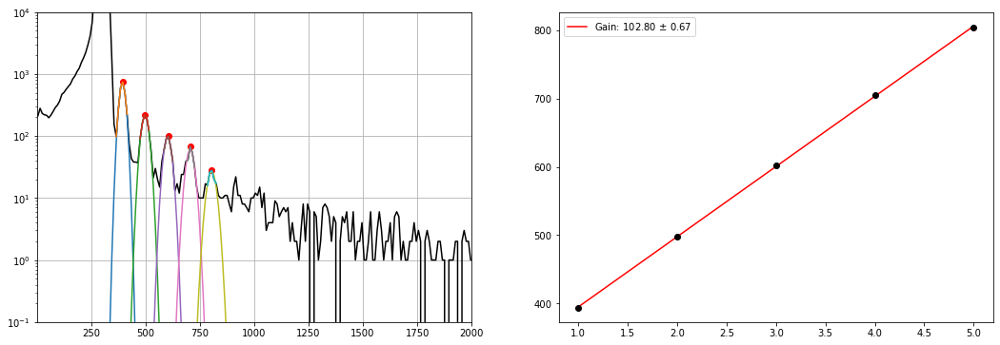

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_11.h5


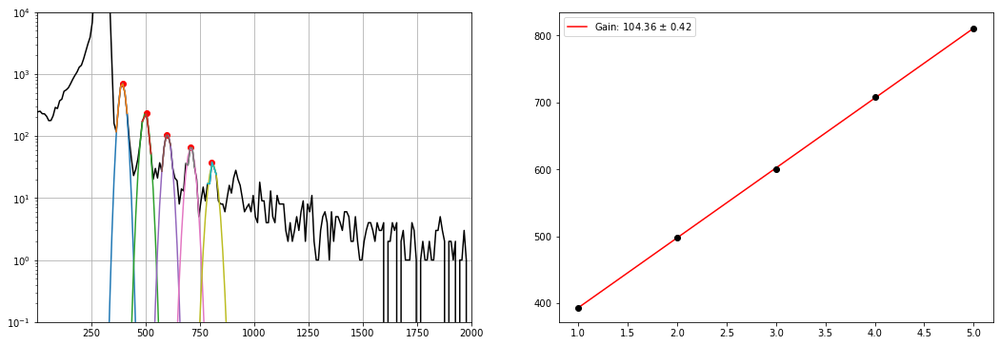

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_12.h5


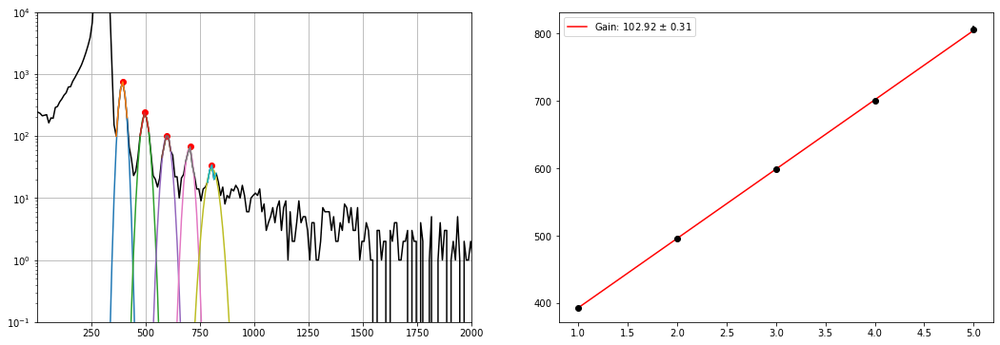

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_13.h5


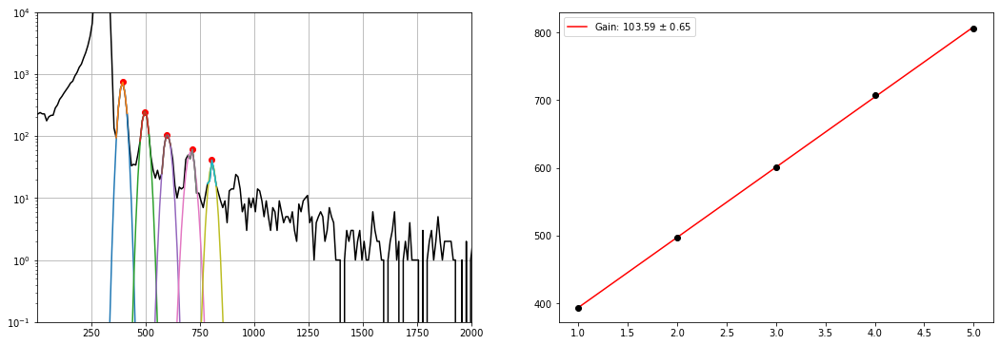

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_14.h5


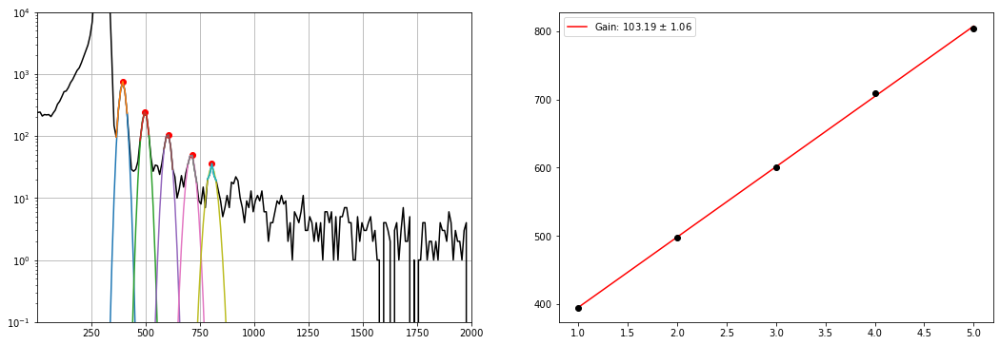

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_15.h5


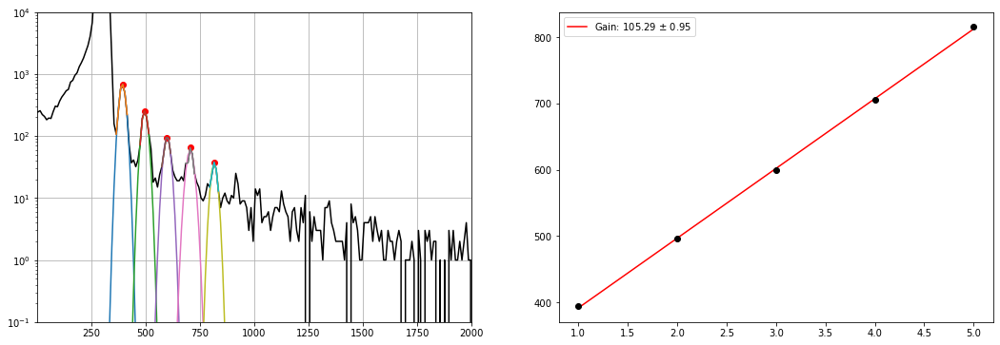

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_16.h5


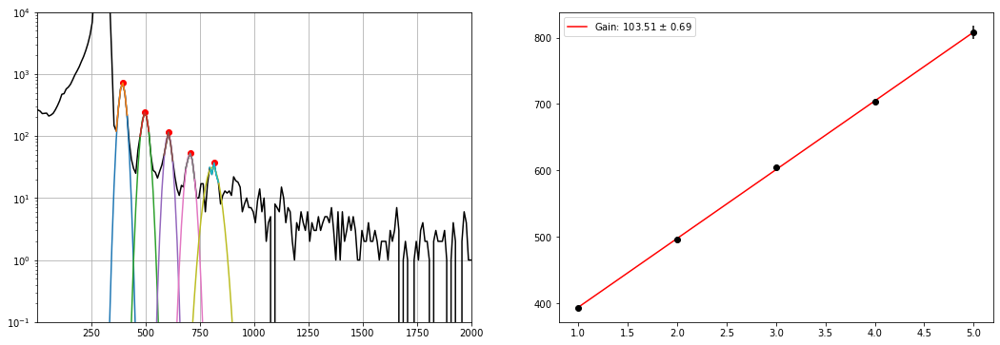

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_17.h5


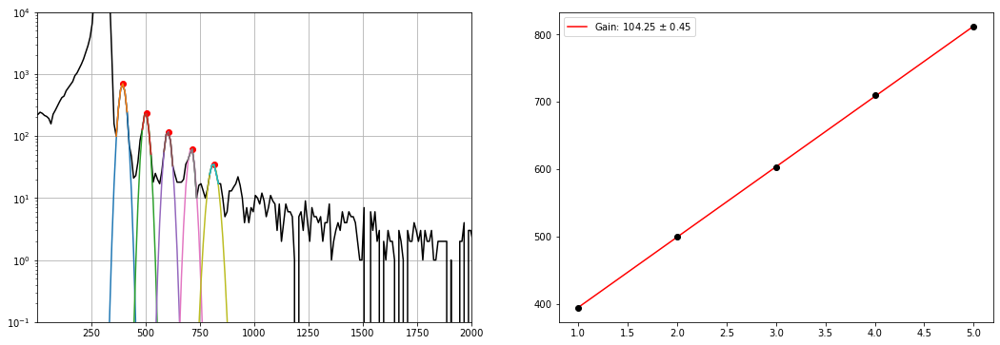

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_18.h5


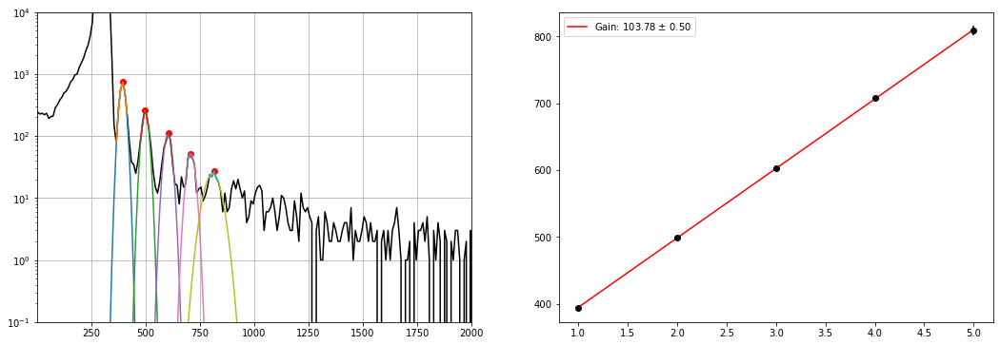

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_19.h5


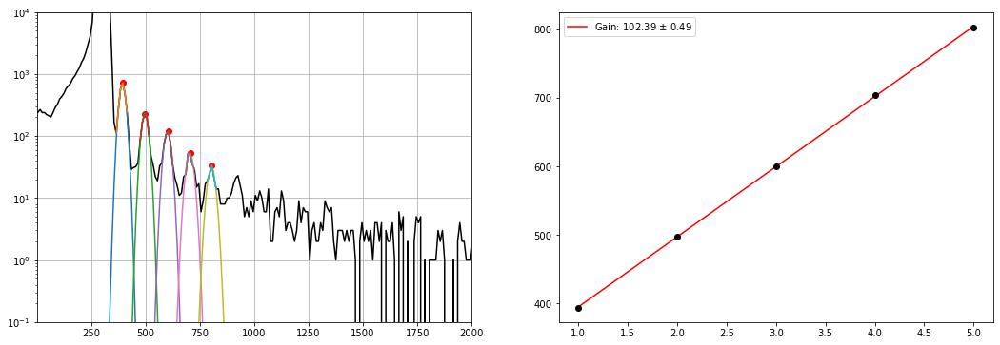

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_20.h5


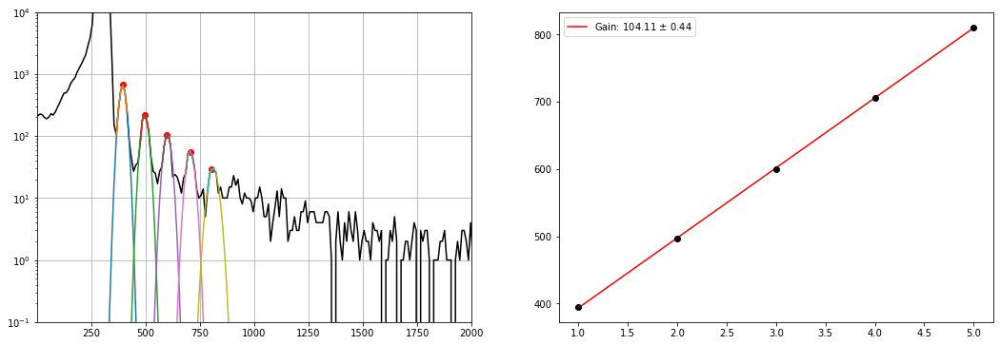

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_21.h5


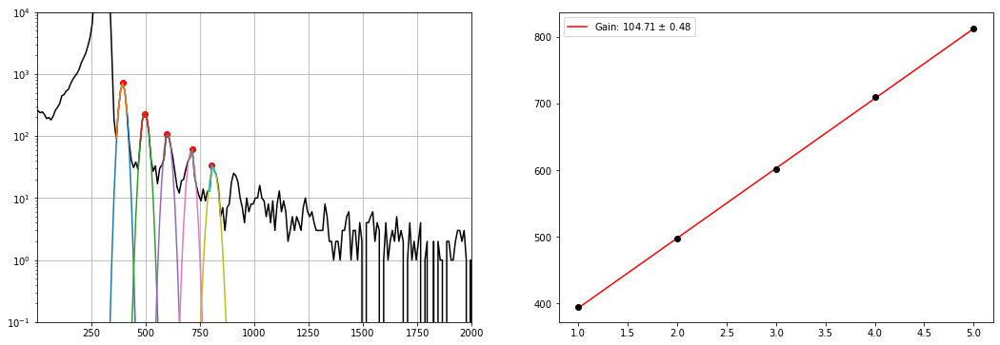

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_22.h5


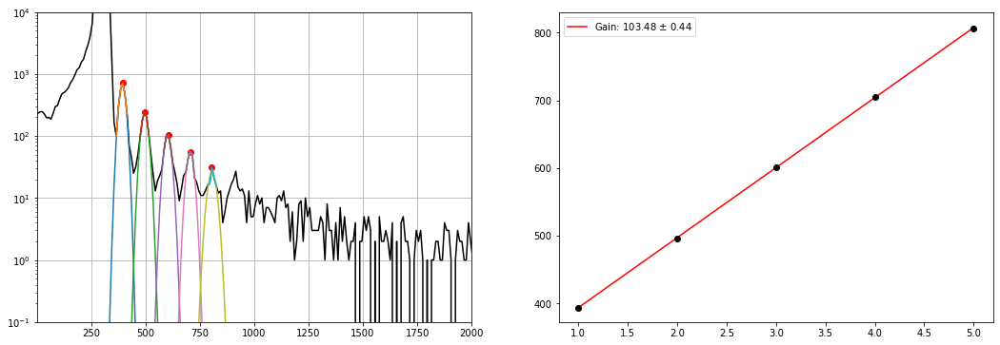

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_23.h5


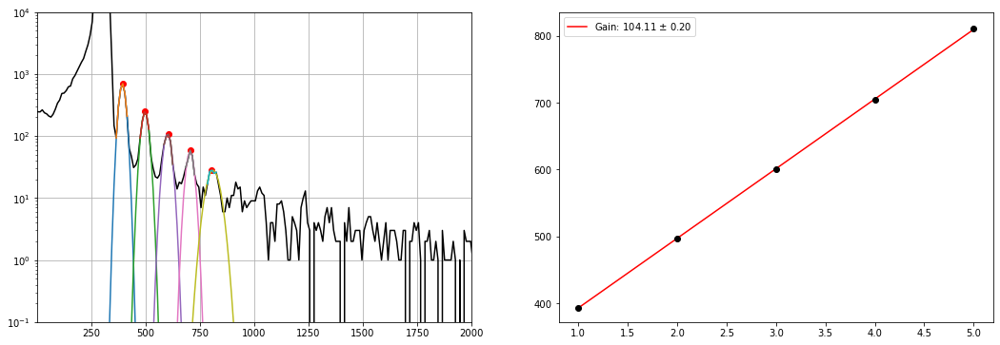

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_24.h5


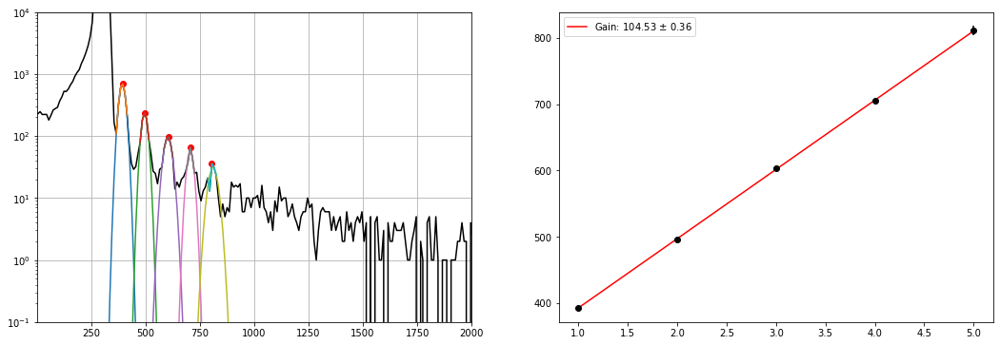

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_25.h5


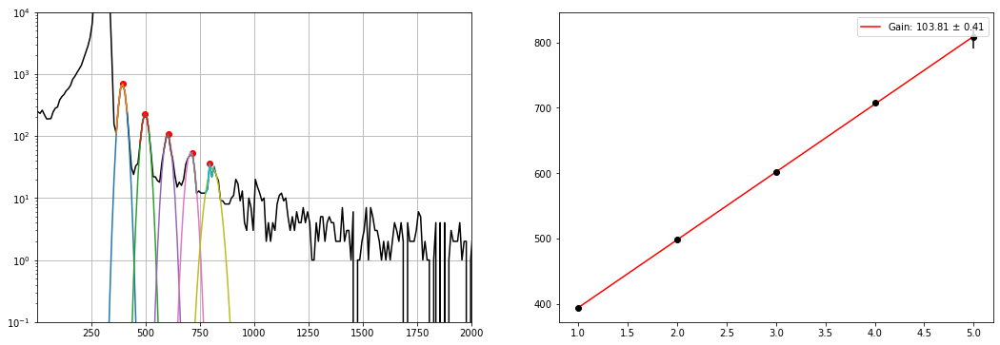

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_26.h5


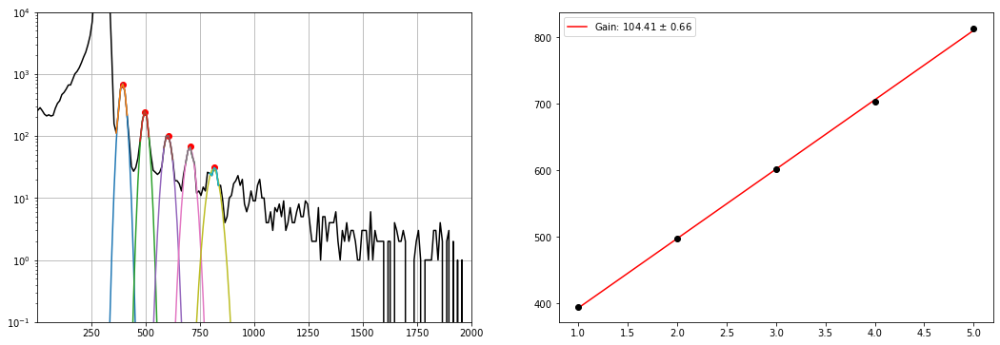

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_27.h5


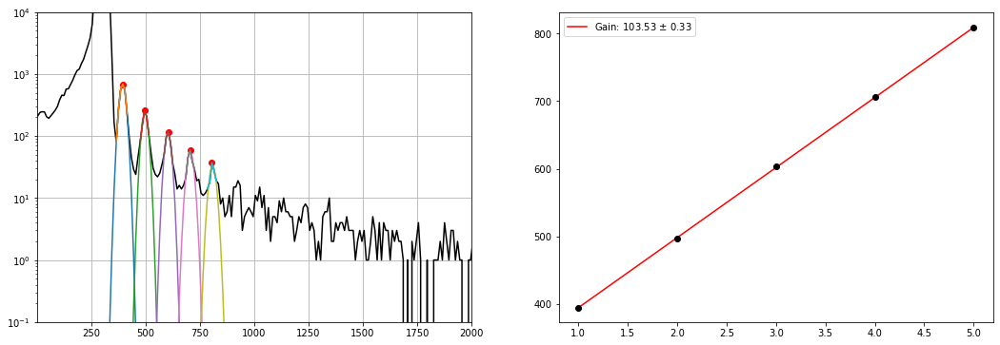

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_28.h5


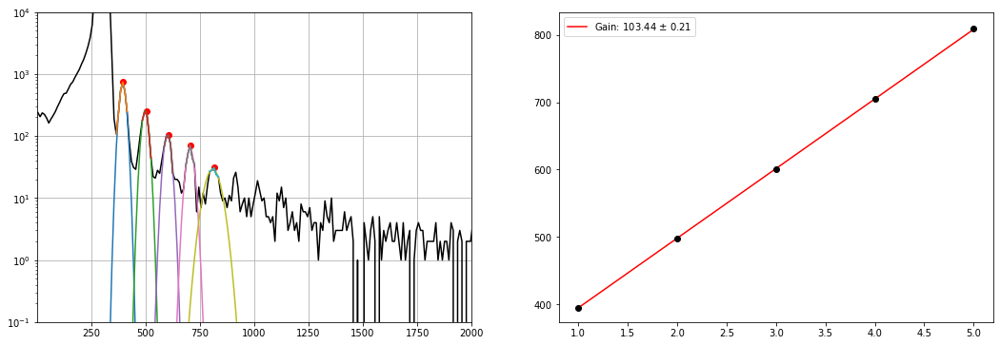

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20221007/Step15/mca_keith_31.40OV_29.h5


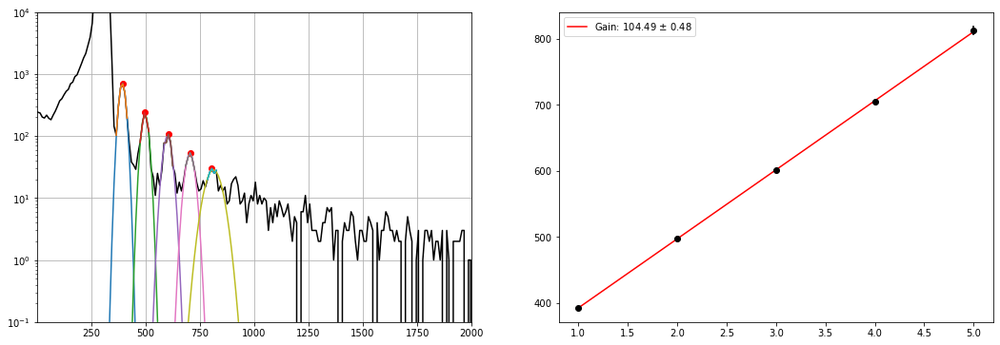

In [26]:
data_POS_FIELD3 = {'source':{'color': 'black'}}

get_data(data_POS_FIELD3, path_15, files_15, binsize=10, peak_dist=15)

-2.793042545866155


<Figure size 648x432 with 0 Axes>

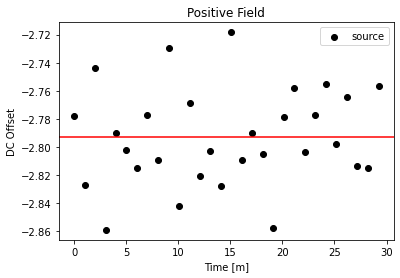

In [27]:
plot_offset(data_POS_FIELD3, 'Positive')

In [28]:
# combining the two positive fields
data_POS_FIELD_com = {'source':{}}
for file_type in set(data_POS_FIELD2.keys()).union(set(data_POS_FIELD3.keys())):
    for key in set(data_POS_FIELD2[file_type].keys()).union(set(data_POS_FIELD3[file_type])):
        if key in data_POS_FIELD2[file_type] and key in data_POS_FIELD3[file_type]:
            if key == 'mean_dc_offset':
                data_POS_FIELD_com[file_type][key] = (data_POS_FIELD2[file_type][key] + data_POS_FIELD3[file_type][key])/2
            elif key == 'color':
                data_POS_FIELD_com[file_type][key] = data_POS_FIELD2[file_type][key]
            else:
                data_POS_FIELD_com[file_type][key] = np.concatenate((data_POS_FIELD2[file_type][key], data_POS_FIELD3[file_type][key]))
        else:
            print('keys do not match')

# Combining all the fields

In [29]:
data_list = [data_NO_FIELD1, data_POS_FIELD1, data_NEG_FIELD, data_POS_FIELD_com]
# length = {'source': 0, 405.0: 0, 310.0: 0}
combined_time = {}
combined_offsets = {}

# for data in data_list:
#     for file_type in data.keys():
# #         print(len(data[file_type]['dc_offset']))
#         length[file_type] += len(data[file_type]['dc_offset'])

# for file_type in data_NO_FIELD1.keys():
#     combined_time[file_type] = np.arange(0, length[file_type])

for file_type in data_NO_FIELD1.keys():
    combined_time[file_type] = np.concatenate([data[file_type]['time'] for data in data_list])
    combined_offsets[file_type] = np.concatenate([data[file_type]['dc_offset'] for data in data_list])

-2.7109000716979645


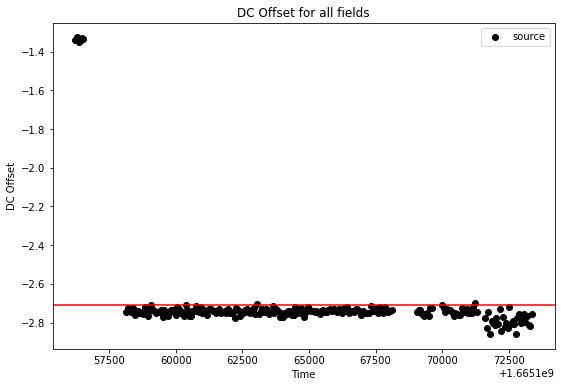

In [30]:
offset_means = {}
plt.figure(figsize = (9, 6))
plt.title('DC Offset for all fields')
plt.xlabel('Time')
plt.ylabel('DC Offset')

for file_type in combined_offsets:
    combined_masked_data = np.ma.masked_array(combined_offsets[file_type], np.isnan(combined_offsets[file_type])) # creating a masked array to ignore the nan when tkaing the average dc offset
    combined_offset_means = np.ma.average(combined_masked_data)
    print(combined_offset_means)
    offset_means[file_type] = combined_offset_means
    plt.scatter(combined_time[file_type], combined_offsets[file_type], label=file_type, color=data_NO_FIELD1[file_type]['color'])
    plt.axhline(y=combined_offset_means, color='r')

# plt.axvline(x=len(time_NO_FIELD1['source'])-1, color='k')
# plt.axvline(x=len(time_NO_FIELD1['source'])+len(time_POS_FIELD1['source'])-1, color='k')
# plt.axvline(x=len(time_NO_FIELD1['source'])+len(time_POS_FIELD1['source'])+len(time_NEG_FIELD['source'])-1, color='k')
# plt.axvline(x=len(time_NO_FIELD1['source'])+len(time_POS_FIELD1['source'])+len(time_NEG_FIELD['source'])+len(time_POS_FIELD2['source'])+len(time_POS_FIELD3['source'])-1, color='k')

plt.legend()

In [31]:
# combined_time = {}
# offset_means = {}
# plt.figure(figsize = (9, 6))
# plt.title('DC Offset for all fields')
# plt.xlabel('Time')
# plt.ylabel('DC Offset')

# for file_type in data_NO_FIELD:
#     combined_time[file_type] = np.arange(0, (len(time_NO_FIELD[file_type])+len(time_POS_FIELD[file_type])+len(time_NEG_FIELD[file_type])))
#     combined_offsets = np.concatenate((data_NO_FIELD[file_type]['dc_offset'], data_POS_FIELD[file_type]['dc_offset'], data_NEG_FIELD[file_type]['dc_offset']))
#     combined_masked_data = np.ma.masked_array(combined_offsets, np.isnan(combined_offsets)) # creating a masked array to ignore the nan when tkaing the average dc offset
#     combined_dc_offset_mean = np.ma.average(combined_masked_data)
#     print(combined_dc_offset_mean)
#     offset_means[file_type] = combined_dc_offset_mean
#     plt.scatter(combined_time[file_type], combined_offsets, label=file_type)
#     plt.axvline(x=len(time_NO_FIELD['source'])-1, color='k')
#     plt.axvline(x=len(time_NO_FIELD['source'])+len(time_POS_FIELD['source'])-1, color='k')
#     plt.axhline(y=combined_dc_offset_mean, color='r')
# plt.legend()

# Saving data to a file

In [32]:
all_data = [data_NO_FIELD1_2, data_POS_FIELD1, data_NEG_FIELD, data_POS_FIELD_com, offset_means]

with open('data_for_pde_Avinay.pkl', 'wb') as f:
    pickle.dump(all_data, f)
        

# 0 E field SRS Gain 5

In [42]:
def peak_fit_srs5(x_data, y_data, voltage, min_distance=20, max_peaks=5, min_thresh=10, peak_range=500):
    # Find the peaks in the spectrum using the find_peaks function from scipy.signal
    
    peaks_index, _ = scipy.signal.find_peaks(y_data, distance=min_distance)
    
    # Fit each peak with a Gaussian function using the curve_fit function from scipy
    gain_info = [] # parameters to fit the gain
    peak_params = [] # parameters to plot the gaussian
    peak_number = 1 # corresponds to single photoelectron peak
    peaks = [] # list of where all the peaks are that are used in the fits
    peak_cuts = []
    for peak in peaks_index:
        if peak_number > max_peaks: # stopping the loop after we have reached the max number of peaks
            break

        if peak < min_thresh:
            continue
        
        peaks.append(np.array([x_data[peak], y_data[peak]]))
        
        # initial guess for the Gaussian parameters
        amplitude_guess = y_data[peak]
        mean_guess = x_data[peak]
        standard_deviation_guess = 10
        initial_guess = [amplitude_guess, mean_guess, standard_deviation_guess]
        
        # cutting data around each peak
        if peak_number == 1: # trying to not include the pedestal for the first peak
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - 25))
        else:
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - peak_range))
        peak_x = x_data[cut] # x values of peak for fitting
        peak_y = y_data[cut] # y values of peak for fitting
        peak_cuts.append([peak_x, peak_y])
        
#         plt.yscale('log')
#         plt.plot(x_data[cut], y_data[cut], alpha=0.5)
        
        # Perform the curve fitting
        try:
            # trying to fit the peaks
            params, params_covariance = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
            # params are returned as amplitude, mean, std dev
            print('Guess: ', initial_guess)
            print('Params: ', params)
            peak_params.append(params)
            gain_info.append([peak_number, params[1], np.sqrt(params_covariance[1,1])]) # peak number, mean, and covariance
        except RuntimeError as r:
            # if curve fit doesn't work then we will just use the peak amplitude and center that find_peaks found
            print('fit failed')
            params = initial_guess
            peak_params.append(initial_guess)
            gain_info.append([peak, mean_guess, np.nan])
#             xx = np.linspace( x_data[peak] - 2*standard_deviation_guess, x_data[peak] + 2*standard_deviation_guess, 100 )
        
        peak_number += 1 # (goes to n*spe until it reaches max_peak)
        
    plt.show()
    return np.array(peak_params), np.array(gain_info), np.array(peaks), peak_cuts

In [35]:
# getting the data that we need
path_16 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/'
files_16 = load_directory(path_16)
SRS_gain_16 = 5 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_16 = 275 # center of noise pedestal peak

Number of files found:  18
Number of files:  18


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_0.h5
Guess:  [350, 100.04274548119199, 10]
Params:  [332.30736243  92.38642377  26.81722139]
Guess:  [184, 148.06326331216414, 10]
Params:  [157.12082473 143.98252212  26.79494898]
Guess:  [114, 196.0837811431363, 10]
Params:  [100.27723654 191.91263344  37.63400446]


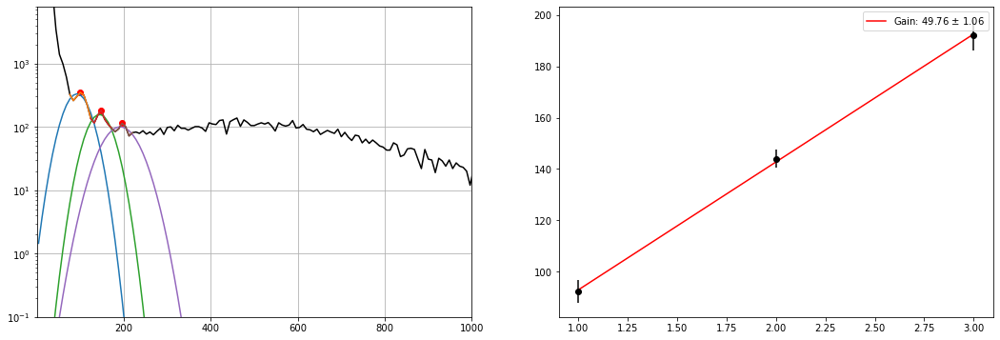

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_1.h5
Guess:  [405, 100.04274548119199, 10]
Params:  [354.66040499  97.33613276  22.73489286]
Guess:  [182, 148.06326331216414, 10]
Params:  [160.11502587 142.98904994  25.80506833]
Guess:  [123, 204.08720078163165, 10]
Params:  [116.4526595  197.82440418  24.42208981]


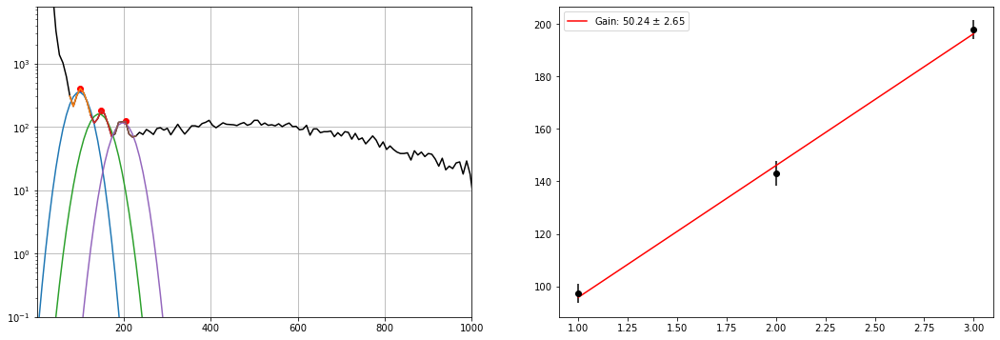

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_2.h5
Guess:  [411, 100.04274548119199, 10]
Params:  [356.11285372  95.77478395  22.70546251]
Guess:  [184, 148.06326331216414, 10]
Params:  [161.15746631 144.67863596  26.49726613]
Guess:  [99, 196.0837811431363, 10]
Params:  [ 94.05064387 189.14545398  43.71529266]


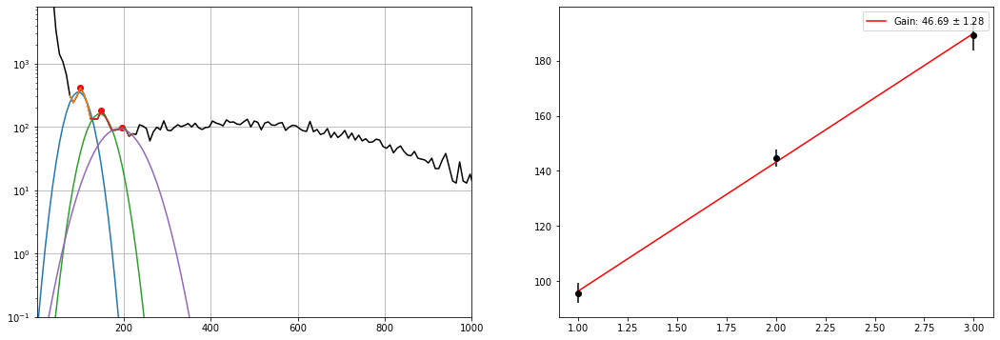

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_3.h5
Guess:  [388, 100.04274548119199, 10]
Params:  [354.39091515  96.04704405  21.88293193]
Guess:  [191, 148.06326331216414, 10]
Params:  [163.82146754 145.85993967  27.28773103]
Guess:  [118, 196.0837811431363, 10]
Params:  [113.18561369 190.22312577  26.17248175]


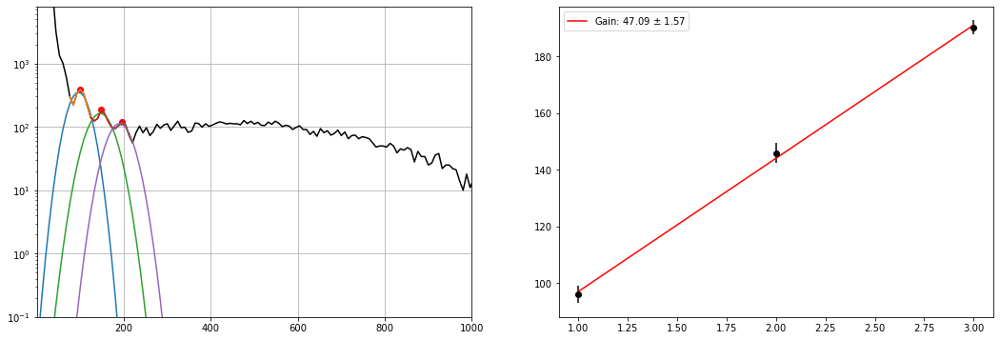

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_4.h5
Guess:  [369, 100.04274548119199, 10]
Params:  [335.59234997  94.55267937  23.41535913]
Guess:  [206, 148.06326331216414, 10]
Params:  [183.06739801 147.0400288   19.70224356]
Guess:  [104, 204.08720078163165, 10]
Params:  [ 92.94754819 191.85425859  44.45450539]


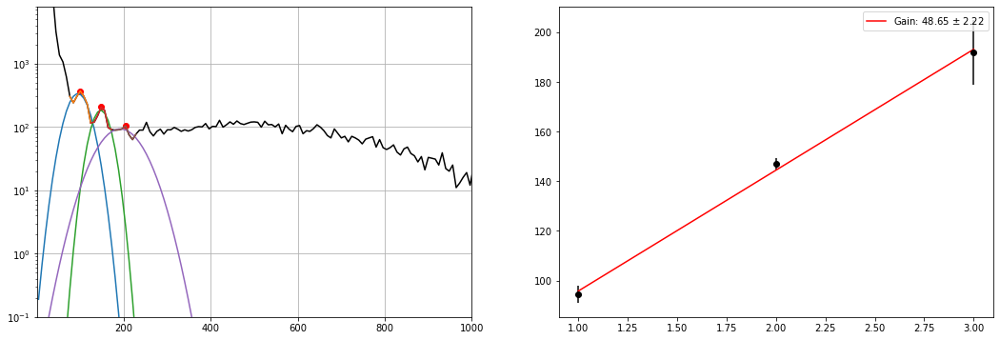

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_310_5.h5
Guess:  [349, 100.04274548119199, 10]
Params:  [337.77393586  91.07492697  28.50881602]
Guess:  [182, 148.06326331216414, 10]
Params:  [177.08412288 144.74395133  20.89994155]
Guess:  [122, 204.08720078163165, 10]
Params:  [105.46081967 192.45841318  39.60126885]


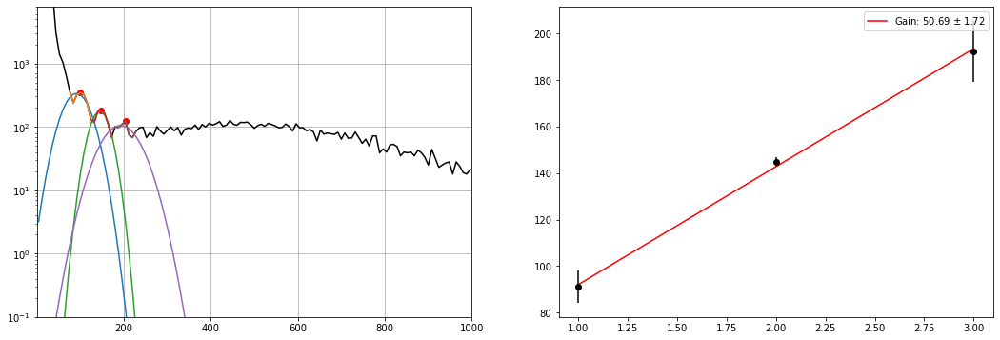

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_0.h5
Guess:  [620, 100.04274548119199, 10]
Params:  [536.10925465  98.91414666  20.47080943]
Guess:  [346, 140.05984367366878, 10]
Params:  [320.47402946 133.84251946  47.59714218]
Guess:  [285, 188.08036150464093, 10]
Params:  [265.69213146 187.91799414  30.77967308]
fit failed


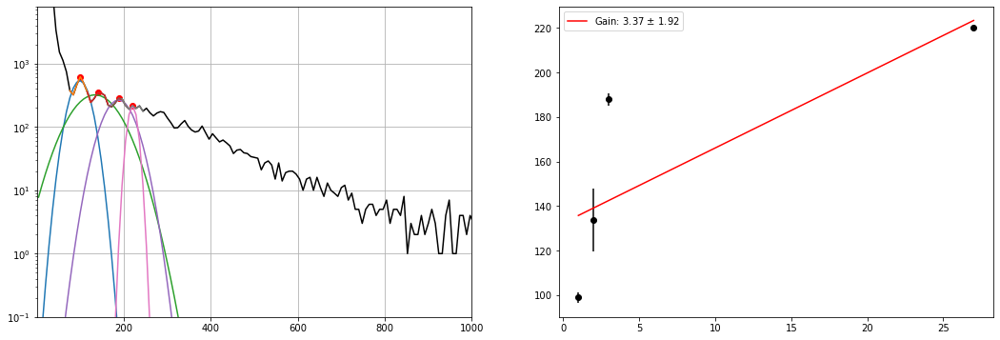

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_1.h5
Guess:  [550, 100.04274548119199, 10]
Params:  [487.20033131  98.68284736  22.65417604]
Guess:  [386, 148.06326331216414, 10]
Params:  [349.87170951 146.75541625  22.49954998]
Guess:  [310, 188.08036150464093, 10]
Params:  [272.30771761 189.95969178  33.76195471]
Guess:  [210, 236.1008793356131, 10]
Params:  [205.05044611 197.30320616  99.15691341]


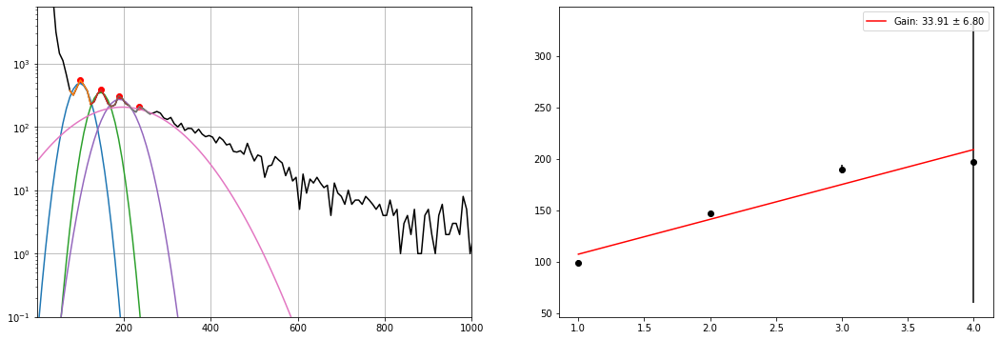

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_2.h5
Guess:  [589, 100.04274548119199, 10]
Params:  [531.71257739  97.71307755  22.48098006]
Guess:  [408, 148.06326331216414, 10]
Params:  [375.18558832 147.687516    22.54920261]
Guess:  [321, 196.0837811431363, 10]
Params:  [287.81478606 193.98247385  27.08312645]
Guess:  [232, 236.1008793356131, 10]
Params:  [223.9901966  228.1748893   35.22488466]


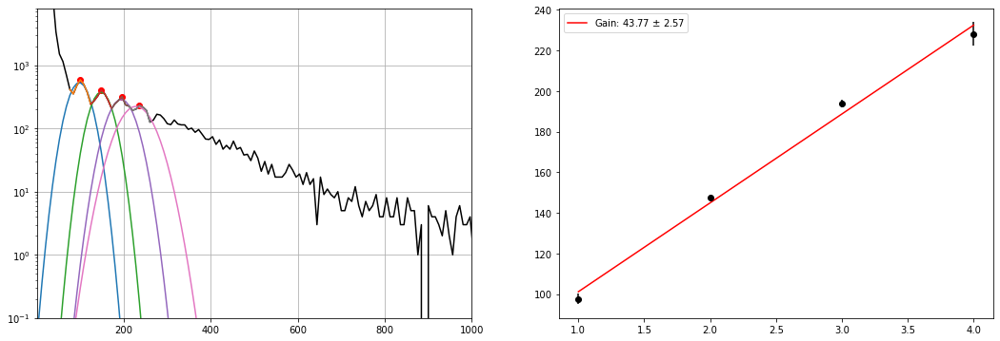

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_3.h5
Guess:  [537, 100.04274548119199, 10]
Params:  [509.50403559  98.77619179  20.61379508]
Guess:  [349, 148.06326331216414, 10]
Params:  [345.51366259 147.0646473   21.99336466]
Guess:  [265, 196.0837811431363, 10]
Params:  [254.72866993 194.07099117  27.42116289]
Guess:  [209, 236.1008793356131, 10]
Params:  [192.43066072 234.69147306  44.21816447]


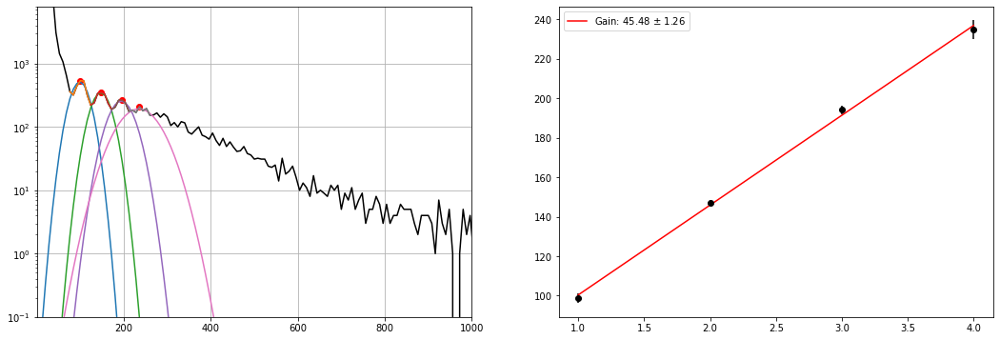

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_4.h5
Guess:  [548, 100.04274548119199, 10]
Params:  [532.79680897  98.86733531  20.1418576 ]
Guess:  [407, 148.06326331216414, 10]
Params:  [374.75514945 147.08158022  21.19524815]
Guess:  [316, 196.0837811431363, 10]
Params:  [287.15792664 193.48734602  24.25582252]
Guess:  [234, 236.1008793356131, 10]
Params:  [211.77391842 233.27273555  42.52720515]


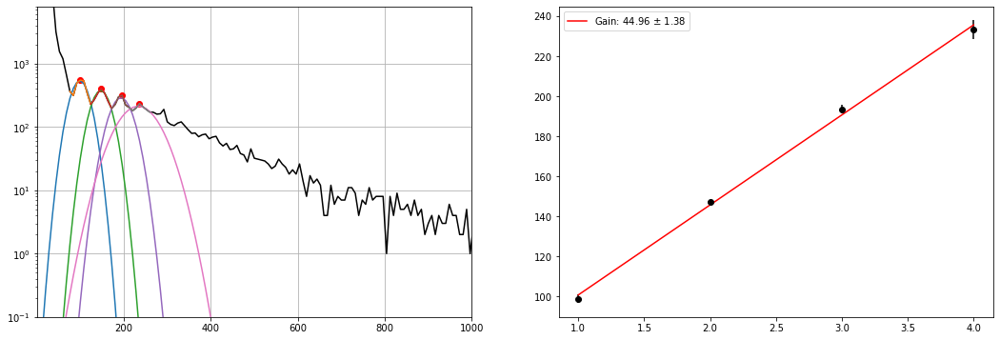

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_405_5.h5
Guess:  [556, 100.04274548119199, 10]
Params:  [522.58992312  97.33243297  22.03832544]
Guess:  [368, 148.06326331216414, 10]
Params:  [350.90525968 146.53593396  22.26608348]
Guess:  [274, 196.0837811431363, 10]
Params:  [258.50555592 194.58864855  26.67634302]
Guess:  [206, 236.1008793356131, 10]
Params:  [192.72939184 230.31351756  51.81812941]


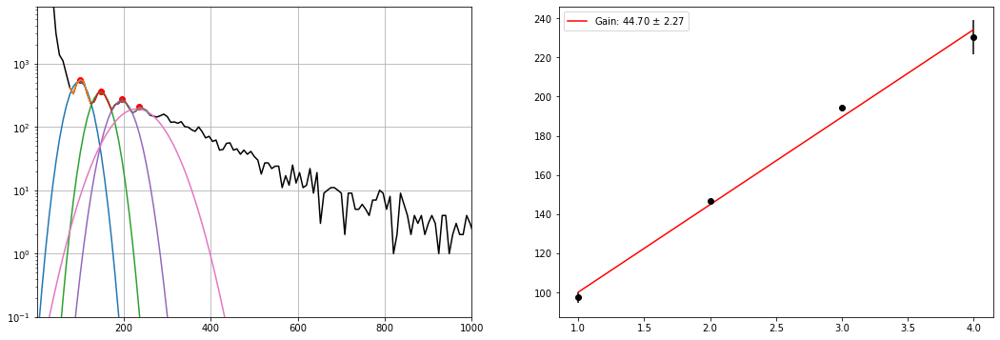

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_0.h5
Guess:  [2231, 100.04274548119199, 10]
Params:  [2063.68489894   95.68931709   24.11275501]
Guess:  [1050, 148.06326331216414, 10]
Params:  [950.44298816 144.63465111  24.57938826]
Guess:  [564, 196.0837811431363, 10]
Params:  [513.77196362 192.68295214  27.33389041]
Guess:  [340, 244.10429897410845, 10]
Params:  [312.53898872 240.79599885  28.50222273]
Guess:  [220, 300.12823644357593, 10]
Params:  [213.39210126 294.18447889  26.6771126 ]


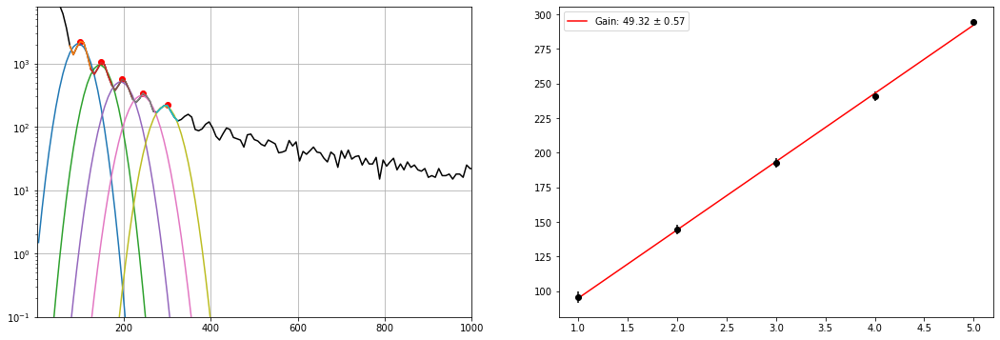

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_1.h5
Guess:  [2297, 100.04274548119199, 10]
Params:  [2106.34111223   96.15272297   24.18121302]
Guess:  [1057, 148.06326331216414, 10]
Params:  [1000.6558832   145.70491684   24.48267786]
Guess:  [584, 196.0837811431363, 10]
Params:  [536.44908458 192.51443957  26.59036741]
Guess:  [363, 244.10429897410845, 10]
Params:  [337.5616152  242.27851835  27.02380242]
Guess:  [236, 292.1248168050806, 10]
Params:  [218.95583027 290.04369948  29.5154477 ]


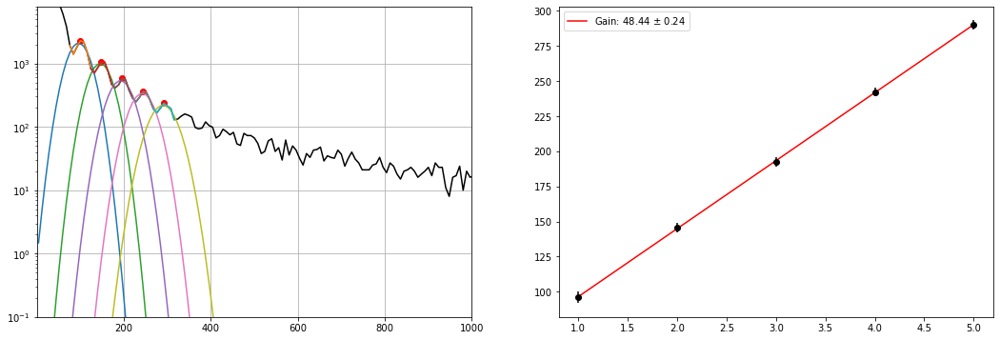

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_2.h5
Guess:  [2246, 100.04274548119199, 10]
Params:  [2083.54848549   95.51055527   24.6114835 ]
Guess:  [1067, 148.06326331216414, 10]
Params:  [977.13146002 144.61606747  24.23826685]
Guess:  [610, 196.0837811431363, 10]
Params:  [544.15897481 193.01126582  25.0997749 ]
Guess:  [347, 244.10429897410845, 10]
Params:  [320.91374713 241.317785    27.08295208]
Guess:  [250, 292.1248168050806, 10]
Params:  [218.25976488 289.38093846  26.62575626]


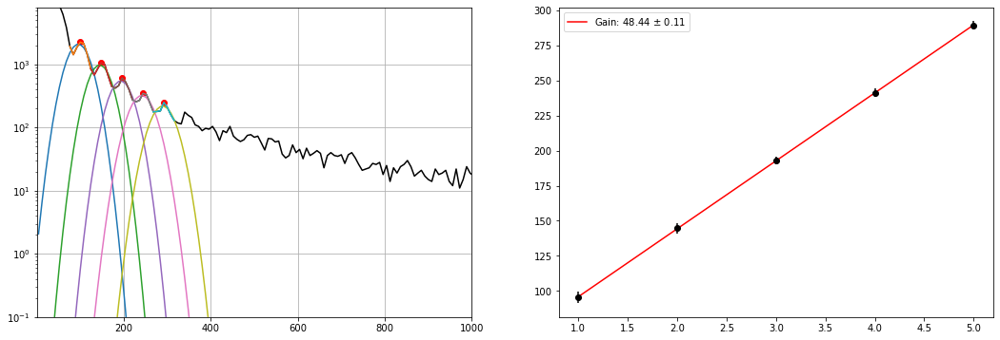

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_3.h5
Guess:  [2175, 100.04274548119199, 10]
Params:  [1996.39197037   94.36537575   24.95559725]
Guess:  [999, 148.06326331216414, 10]
Params:  [931.8308058  146.32890068  23.39884538]
Guess:  [544, 204.08720078163165, 10]
Params:  [509.49119662 197.24654524  22.73026492]
Guess:  [322, 244.10429897410845, 10]
Params:  [301.59971642 241.5997954   30.59540305]
Guess:  [214, 300.12823644357593, 10]
Params:  [210.26279591 295.25519295  23.14329782]


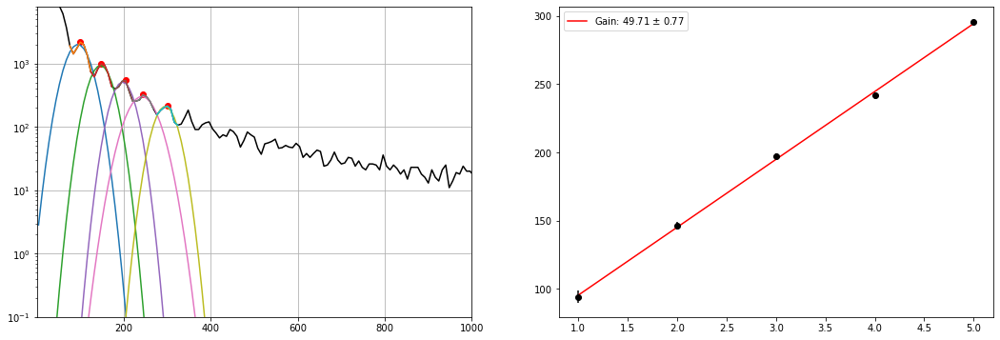

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_4.h5
Guess:  [2242, 100.04274548119199, 10]
Params:  [2004.87885172   94.70989099   25.11473509]
Guess:  [1035, 148.06326331216414, 10]
Params:  [955.64082418 144.91078362  23.63476356]
Guess:  [556, 196.0837811431363, 10]
Params:  [507.1163706  192.59662258  26.12783774]
Guess:  [361, 252.1077186126038, 10]
Params:  [349.86951652 245.97657453  20.37691672]
Guess:  [217, 300.12823644357593, 10]
Params:  [217.45967925 295.72904361  23.20774264]


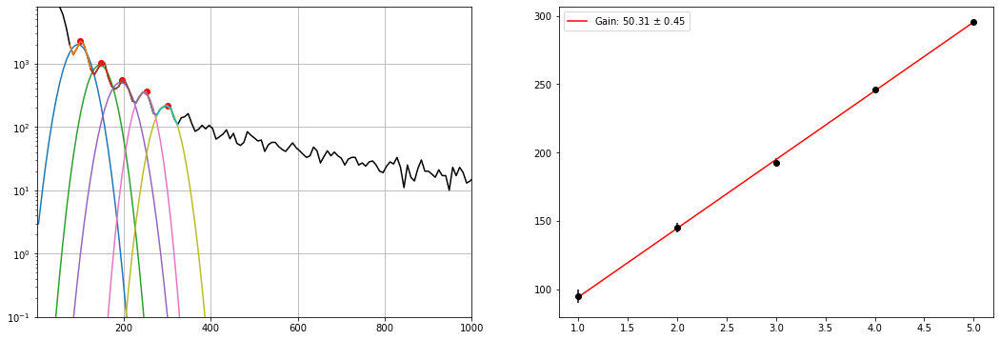

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step16/mca_keith_31.40OV_source_5.h5
Guess:  [2362, 100.04274548119199, 10]
Params:  [2153.25088118   96.46178547   22.80664245]
Guess:  [1054, 148.06326331216414, 10]
Params:  [990.70548466 143.98337608  24.14803901]
Guess:  [563, 196.0837811431363, 10]
Params:  [530.58957306 193.56304579  24.85331945]
Guess:  [343, 244.10429897410845, 10]
Params:  [315.76057105 242.41947809  26.38342574]
Guess:  [213, 292.1248168050806, 10]
Params:  [193.97214773 286.21661404  46.76458865]


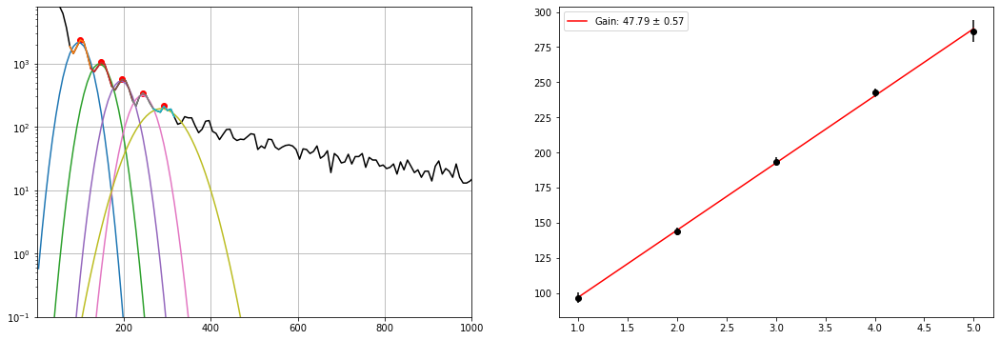

In [43]:
data_NO_FIELD_5 = {'source':{}, 405.0:{}, 310.0:{}}

for file_type, file_list in files_16.items():
    # creating the data fields in the dict
    data_NO_FIELD_5[file_type]['pe_data'] = []
    data_NO_FIELD_5[file_type]['counts'] = []
    data_NO_FIELD_5[file_type]['gain'] = np.empty(len(file_list))
    data_NO_FIELD_5[file_type]['gain_err'] = np.empty(len(file_list))
    data_NO_FIELD_5[file_type]['dc_offset'] = np.empty(len(file_list))
    data_NO_FIELD_5[file_type]['file_volts'] = np.empty(len(file_list))
    for i, file in enumerate(file_list):
        pe, counts, gain, gain_err, dc_offset, volts = plot_fit_gain_dc(file, 25, 5, 8) #file, peak_dist, SRS_gain, binsize
        data_NO_FIELD_5[file_type]['pe_data'].append(pe)
        data_NO_FIELD_5[file_type]['counts'].append(counts)
        data_NO_FIELD_5[file_type]['gain'][i] = gain
        data_NO_FIELD_5[file_type]['gain_err'][i] = gain_err
        data_NO_FIELD_5[file_type]['dc_offset'][i] = dc_offset
        data_NO_FIELD_5[file_type]['file_volts'][i] = volts
    # converting all the lists to arrays 
    data_NO_FIELD_5[file_type]['pe_data'] = np.array(data_NO_FIELD_5[file_type]['pe_data'])
    data_NO_FIELD_5[file_type]['counts'] = np.array(data_NO_FIELD_5[file_type]['counts'])

In [44]:
with open('data_for_pde_gain5.pkl', 'wb') as f:
    pickle.dump(data_NO_FIELD_5, f)